In [1]:
% matplotlib inline
# % config InlineBackend.figure_format = 'svg'

import matplotlib.pyplot as plt
from matplotlib.lines import Line2D
import numpy as np
import pickle

from limlam_mocker import limlam_mocker as llm
#Get Parameters for run
from limlam_mocker import params        as params

import lnn as lnn

### load in models
from models_to_load import *

np.random.seed(1337)

%load_ext autoreload

In [2]:
%autoreload
# %autoreload 0
#%autoreload 2

# Setup Learning Enviornment

In [16]:
import tensorflow as tf
from tensorflow import keras

mapLoc = '../maps2/basic_Li/'
different_mapLoc = '../maps2/random_maps2/'
random_small_Li_mapLoc = '../maps2/random_small_Li/'
catLoc = '../catalogues2/'
modelLoc = '../models2/'
modelLoc2 = '../models3/'
modelLoc4 = '../models4/'

### map info
numb_maps = 100
pix_x = 256
pix_y = 256

### output info
lum_func_size = 49

# Load the maps

In [4]:
subFields = lnn.loadBaseFNames(mapLoc)
base = [mapLoc + s for s in subFields]
lumLogBinCents = lnn.loadData(base[152] + '_lum.npz')['logBinCent']

subFields = lnn.loadBaseFNames(different_mapLoc)
different_base = [different_mapLoc + s for s in subFields]

# subFields = lnn.loadBaseFNames(random_small_Li_mapLoc)
# random_small_Li_base = [random_small_Li_mapLoc + s for s in subFields]

subFields = lnn.loadBaseFNames(random_small_Li_mapLoc)
np.random.seed(1234)
np.random.shuffle(subFields)
np.random.seed()

### shuffle  test and validation data
random_small_Li_base = [random_small_Li_mapLoc + s for s in subFields]

In [5]:
training_order = ['../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13613_rotate_0_subfield_24__Li_2.148e-02_1.392e+00_-2.305e+00_3.143e-01_2.946e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13607_rotate_0_subfield_29__Li_2.532e-02_1.303e+00_-1.628e+00_3.092e-01_2.830e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13707_rotate_0_subfield_11__Li_4.586e-02_1.432e+00_-7.655e-01_3.056e-01_2.895e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13651_rotate_0_subfield_14__Li_-4.861e-03_1.356e+00_-1.584e+00_3.030e-01_3.026e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13681_rotate_0_subfield_23__Li_-2.337e-02_1.315e+00_-1.738e+00_2.913e-01_2.998e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13753_rotate_0_subfield_20__Li_-5.615e-03_1.447e+00_-1.926e+00_2.985e-01_3.062e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13671_rotate_0_subfield_5__Li_3.565e-02_1.376e+00_-1.216e+00_3.177e-01_2.989e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13709_rotate_0_subfield_17__Li_-2.590e-02_1.424e+00_-1.755e+00_3.108e-01_2.942e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13763_rotate_0_subfield_31__Li_-4.284e-02_1.359e+00_-1.733e+00_3.015e-01_3.088e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13759_rotate_0_subfield_8__Li_-2.958e-02_1.420e+00_-1.632e+00_2.980e-01_3.060e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13701_rotate_0_subfield_30__Li_1.721e-02_1.380e+00_-1.939e+00_3.099e-01_3.016e-01', 
                  '../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13659_rotate_0_subfield_12__Li_-7.471e-03_1.368e+00_-1.996e+00_3.044e-01_2.839e-01']

# Load Models

In [6]:
basic_adam = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='basic_adam',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [7]:
bigger_input_z = get_master_adam(modelLoc4, 64, 64, 100, lum_func_size,
                                extra_file_name='', file_name='bigger_input_z',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [8]:
### made with cur_map -= (np.min(cur_map)) not cur_map -= (-6) in preprocessing
# noisy_adam = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
#                                 extra_file_name='', file_name='noisy_adam',
#                                 train_number=0, give_weights=True,
#                                 droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
#                                 luminosity_byproduct='log', kernel_size=3,
#                                 dense_layer=1000, use_bias=True)

In [9]:
full_train_basic_adam = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='full_train_basic_adam',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [10]:
### made with cur_map -= (-6) not cur_map -= (np.min(cur_map)) in preprocessing
noisy_adam_zero = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='noisy_adam_zero',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [11]:
### made with cur_map -= (-6) not cur_map -= (np.min(cur_map)) in preprocessing
noisy_adam_full_train = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='noisy_adam_full_train',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [12]:
just_noisy_adam = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='just_noisy_adam',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [13]:
augmentation_adam_full_train = get_master_adam(modelLoc4, 64, 64, 10, lum_func_size,
                                extra_file_name='', file_name='augmentation_adam_full_train',
                                train_number=0, give_weights=True,
                                droprate=0.5, numb_layers=6, base_filters=64, threeD=True,
                                luminosity_byproduct='log', kernel_size=3,
                                dense_layer=1000, use_bias=True)

In [6]:
noisy_resnet = get_master_res_next(modelLoc4, 64, 64, 10, lum_func_size,
                extra_file_name='', file_name='noisy_resnet',
                train_number=0, dense_layer=1000,
                droprate=0.3, base_filters=128,
                luminosity_byproduct='log', cardinality=1,
                give_weights=True, use_bias=True)

In [7]:
noisy_resnet_full_train = get_master_res_next(modelLoc4, 64, 64, 10, lum_func_size,
                extra_file_name='', file_name='noisy_resnet_full_train',
                train_number=0, dense_layer=1000,
                droprate=0.3, base_filters=128,
                luminosity_byproduct='log', cardinality=1,
                give_weights=True, use_bias=True)

In [8]:
foreground_resnet = get_master_res_next(modelLoc4, 64, 64, 10, lum_func_size,
                extra_file_name='', file_name='foreground_resnet',
                train_number=0, dense_layer=1000,
                droprate=0.3, base_filters=128,
                luminosity_byproduct='log', cardinality=1,
                give_weights=True, use_bias=True)

In [9]:
noisy_foreground_resnet = get_master_res_next(modelLoc4, 64, 64, 10, lum_func_size,
                extra_file_name='', file_name='noisy_foreground_resnet',
                train_number=0, dense_layer=1000,
                droprate=0.3, base_filters=128,
                luminosity_byproduct='log', cardinality=1,
                give_weights=True, use_bias=True)

In [10]:
noisy_foreground_resnet_full_train = get_master_res_next(modelLoc4, 64, 64, 10, lum_func_size,
                extra_file_name='', file_name='noisy_foreground_resnet_full_train',
                train_number=0, dense_layer=1000,
                droprate=0.3, base_filters=128,
                luminosity_byproduct='log', cardinality=1,
                give_weights=True, use_bias=True)

# See how good the models are

In [15]:
%autoreload

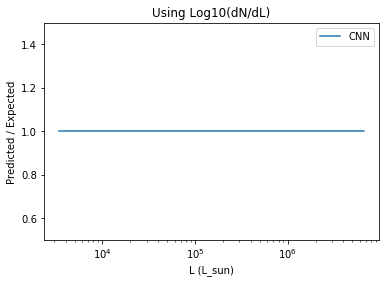

()

In [58]:
numbers = np.random.choice(range(len(random_small_Li_base)), 6)
    
cur_lum, cnn_lum, loss = lnn.test_model(fast_test, random_small_Li_base, numbers[0], 'log', True, pre_pool=4, 
                                      log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                 make_map_noisy=11)
lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)

cur_lum1, cnn_lum1, loss1 = lnn.test_model(fast_test, random_small_Li_base, numbers[1], 'log', True, pre_pool=4, 
                                      log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                 make_map_noisy=11)
lnn.plot_model_test(cur_lum1, cnn_lum1, lumLogBinCents, 'log', lum_func_size=lum_func_size)

lnn.plot_model_ratio(cnn_lum[0], cnn_lum, lumLogBinCents, 'log', 2)

2029 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13679_rotate_0_subfield_30__Li_-4.273e-02_1.463e+00_-1.259e+00_3.041e-01_2.985e-01 ----------------------------
Error and MSE for the given base_number:
[0.41390135884284973, 1.0886631011962891]


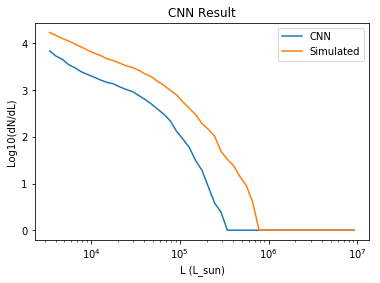

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


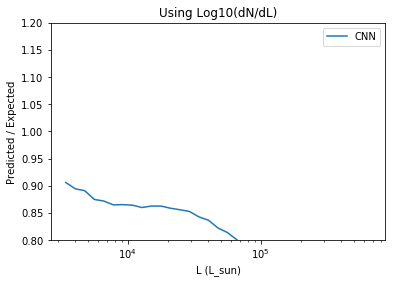

2760 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13867_rotate_0_subfield_29__Li_3.805e-02_1.391e+00_-1.804e+00_2.928e-01_3.052e-01 ----------------------------
Error and MSE for the given base_number:
[0.021822527050971985, 0.044914081692695618]


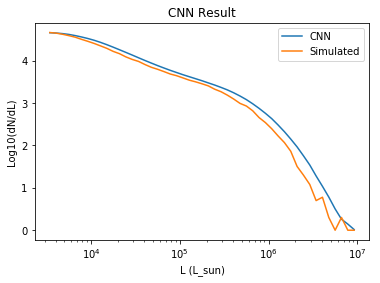

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


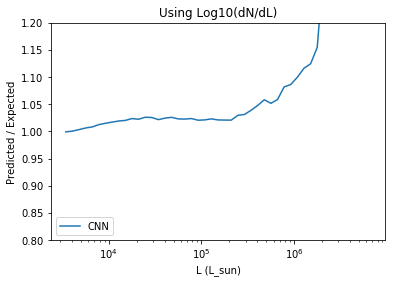

4766 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13827_rotate_0_subfield_33__Li_-3.730e-03_1.405e+00_-2.688e+00_3.157e-01_2.951e-01 ----------------------------
Error and MSE for the given base_number:
[0.033759802579879761, 0.069806709885597229]


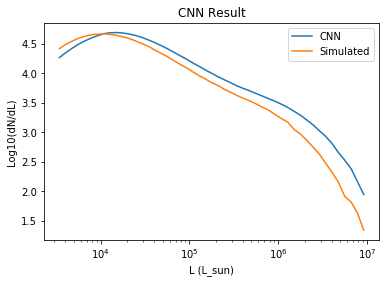

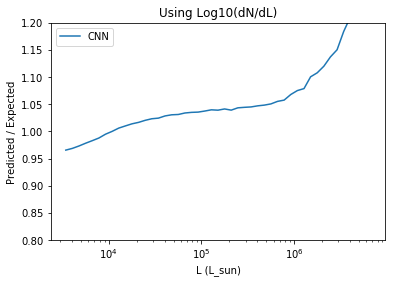

4668 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13649_rotate_0_subfield_9__Li_6.978e-03_1.330e+00_-1.821e+00_2.975e-01_2.898e-01 ----------------------------
Error and MSE for the given base_number:
[0.011774828657507896, 0.02376275323331356]


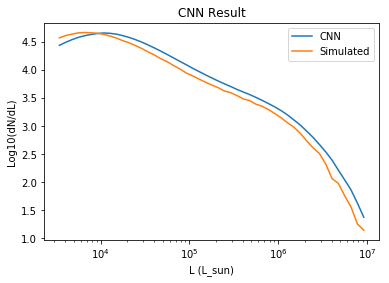

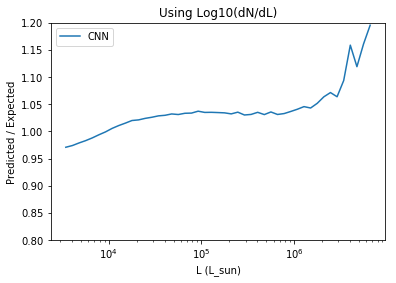

5642 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13667_rotate_0_subfield_10__Li_-2.617e-02_1.433e+00_-1.809e+00_3.020e-01_3.164e-01 ----------------------------
Error and MSE for the given base_number:
[0.028616325929760933, 0.0598488450050354]


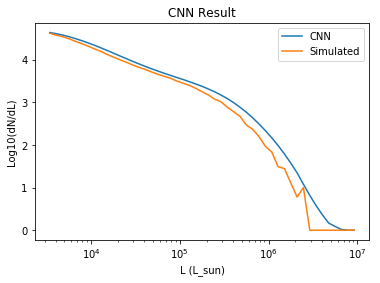

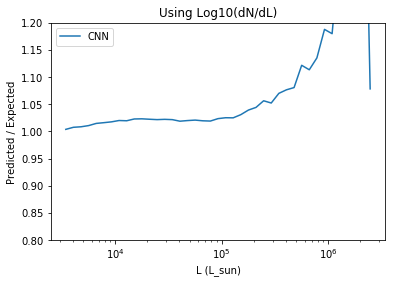

1926 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13581_rotate_0_subfield_2__Li_-2.637e-02_1.307e+00_-2.331e+00_2.849e-01_2.975e-01 ----------------------------
Error and MSE for the given base_number:
[0.076226815581321716, 0.16058771312236786]


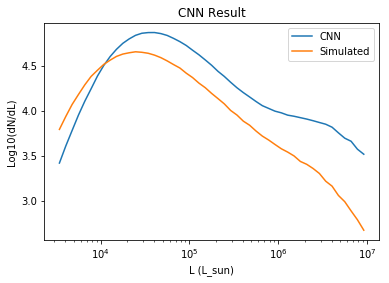

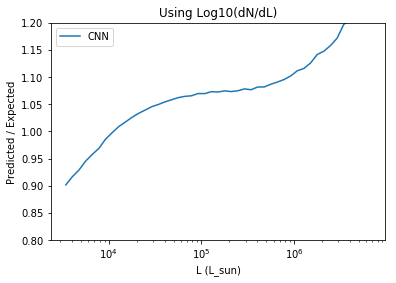

In [34]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(basic_adam, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=0)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

859 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13723_rotate_0_subfield_6__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0021191567648202181, 0.0042765750549733639]


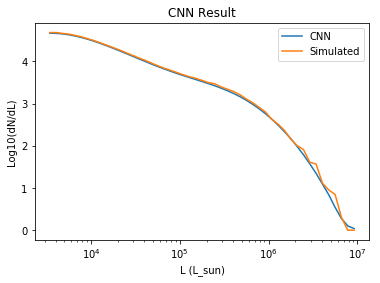

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:295: RuntimeWarning: divide by zero encountered in true_divide
  # ratio_smooth = avg/cur_lum


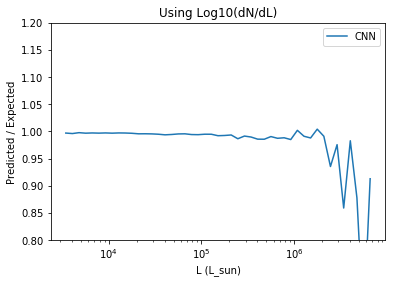

1951 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13689_rotate_0_subfield_26__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0030154609121382236, 0.0061282198876142502]


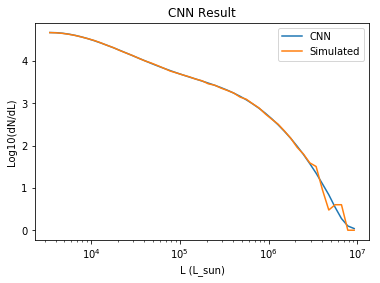

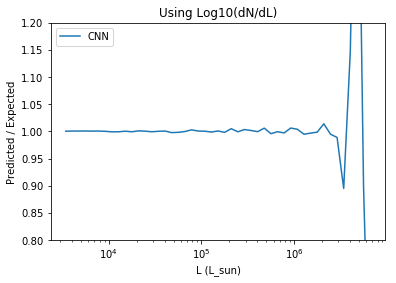

549 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13857_rotate_0_subfield_3__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.00145364785566926, 0.0029249433428049088]


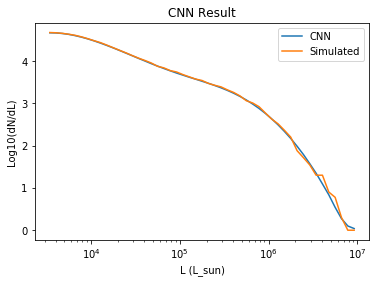

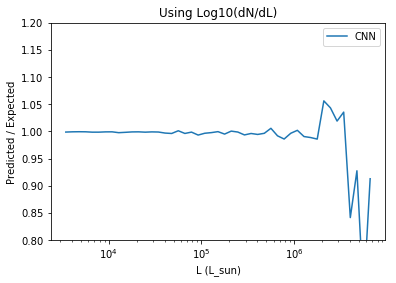

134 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13651_rotate_0_subfield_34__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0017682350007817149, 0.0035612292122095823]


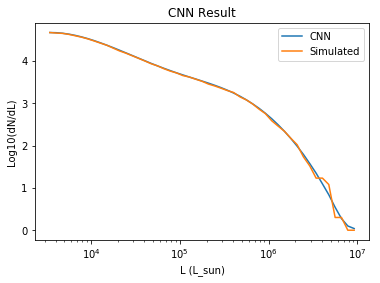

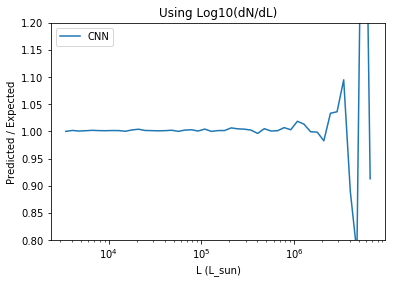

2222 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13889_rotate_0_subfield_34__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.002089107409119606, 0.0042172870598733425]


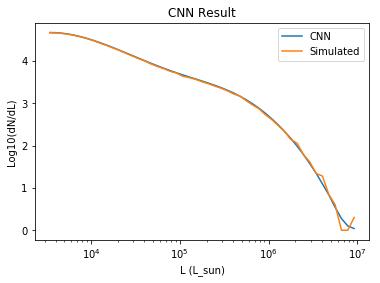

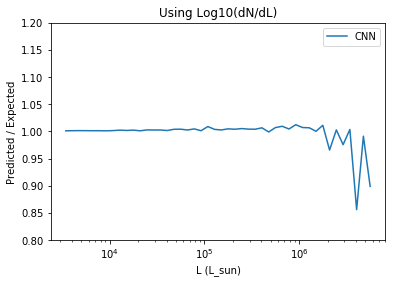

5047 ../maps2/basic_Li/COMAP_z2.39-3.44_1140Mpc_seed_13739_rotate_0_subfield_30__Li_0.000e+00_1.370e+00_-1.740e+00_3.000e-01_3.000e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0012094244593754411, 0.0024389778263866901]


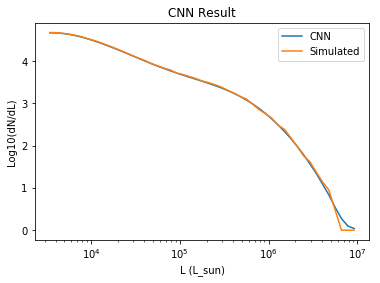

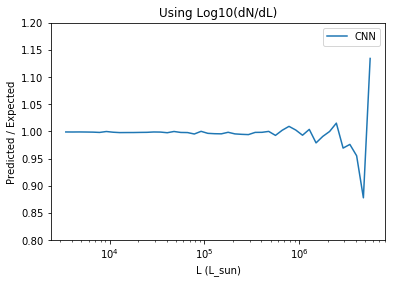

In [25]:
for numb in np.random.choice(range(len(base)), 6):
    print(numb, base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(just_noisy_adam, base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=1000)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

3631 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13873_rotate_0_subfield_19__Li_3.863e-02_1.319e+00_-1.411e+00_3.228e-01_3.104e-01 ----------------------------
Error and MSE for the given base_number:
[0.017087921500205994, 0.035802304744720459]


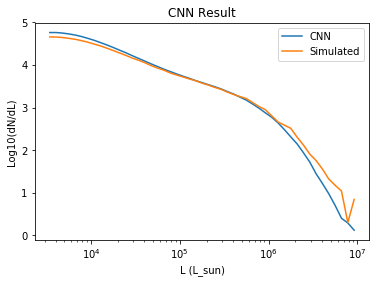

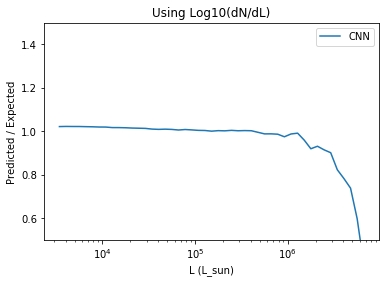

2708 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13881_rotate_0_subfield_25__Li_-4.917e-02_1.406e+00_-1.659e+00_2.937e-01_3.004e-01 ----------------------------
Error and MSE for the given base_number:
[0.012880930677056313, 0.026036491617560387]


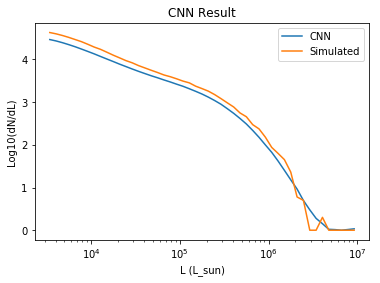

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:286: RuntimeWarning: divide by zero encountered in true_divide
  # plt.semilogx(lumLogBinCents[2:-(end_cut_off)], ratio_smooth[2:-(end_cut_off)], label='Smoothed CNN')
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:286: RuntimeWarning: invalid value encountered in true_divide
  # plt.semilogx(lumLogBinCents[2:-(end_cut_off)], ratio_smooth[2:-(end_cut_off)], label='Smoothed CNN')


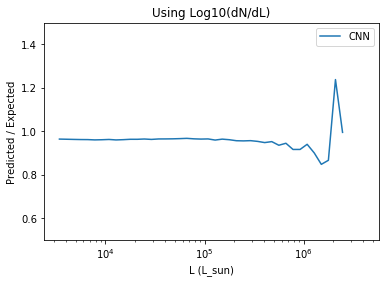

3930 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13763_rotate_0_subfield_5__Li_1.963e-02_1.388e+00_-2.236e+00_3.178e-01_2.926e-01 ----------------------------
Error and MSE for the given base_number:
[0.012635581195354462, 0.025889605283737183]


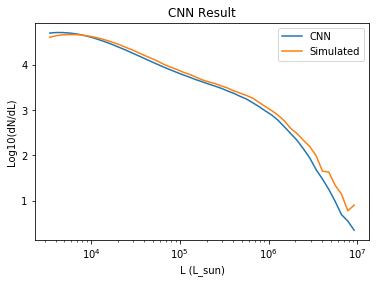

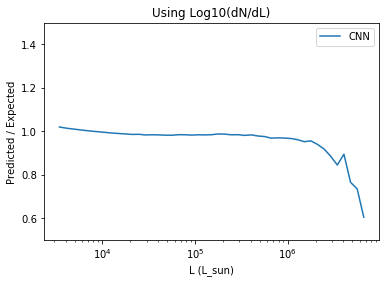

480 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13801_rotate_0_subfield_8__Li_-1.297e-02_1.366e+00_-2.028e+00_2.986e-01_3.130e-01 ----------------------------
Error and MSE for the given base_number:
[0.014009717851877213, 0.02860678918659687]


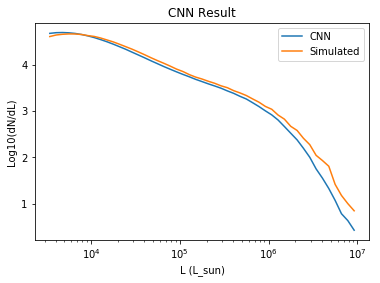

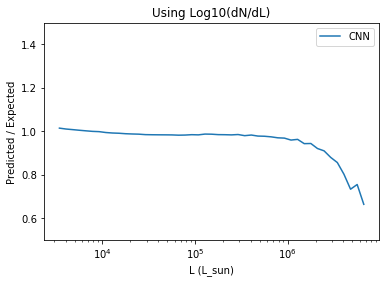

2451 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13591_rotate_0_subfield_19__Li_-1.847e-02_1.399e+00_-1.485e+00_3.016e-01_3.023e-01 ----------------------------
Error and MSE for the given base_number:
[0.021607205271720886, 0.043627247214317322]


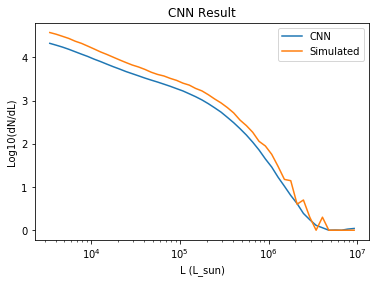

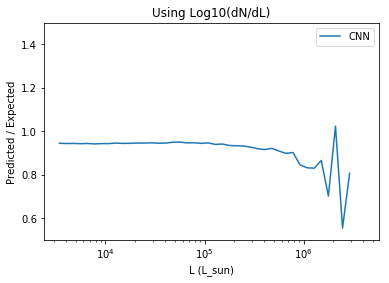

3146 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13765_rotate_0_subfield_16__Li_2.239e-02_1.293e+00_-1.295e+00_2.944e-01_2.983e-01 ----------------------------
Error and MSE for the given base_number:
[0.016578329727053642, 0.034303471446037292]


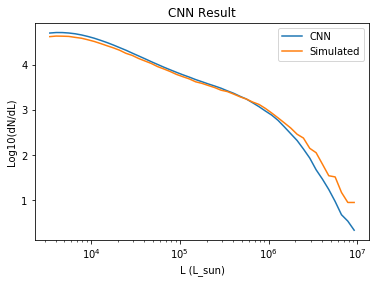

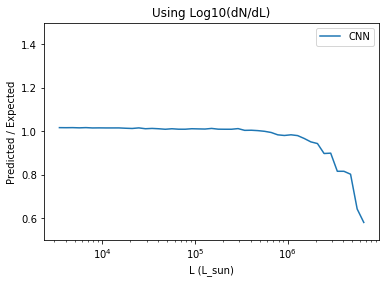

In [72]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
# for i in range(6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

2870 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_0__Li_1.230e-02_1.376e+00_-2.269e+00_2.906e-01_2.918e-01 ----------------------------
Error and MSE for the given base_number:
[0.17552104592323303, 0.40280872583389282]


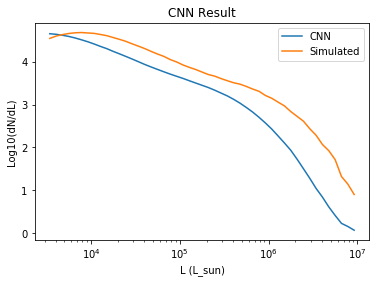

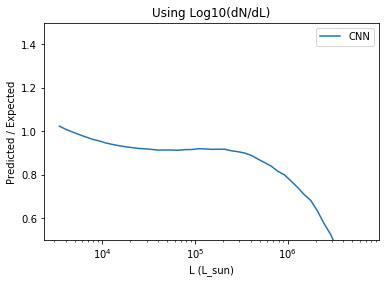

3516 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13847_rotate_0_subfield_29__Li_4.314e-02_1.415e+00_-1.512e+00_3.098e-01_3.172e-01 ----------------------------
Error and MSE for the given base_number:
[0.14551955461502075, 0.33355841040611267]


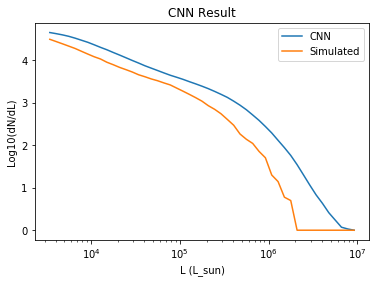

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:286: RuntimeWarning: divide by zero encountered in true_divide
  # plt.semilogx(lumLogBinCents[2:-(end_cut_off)], ratio_smooth[2:-(end_cut_off)], label='Smoothed CNN')
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:286: RuntimeWarning: invalid value encountered in true_divide
  # plt.semilogx(lumLogBinCents[2:-(end_cut_off)], ratio_smooth[2:-(end_cut_off)], label='Smoothed CNN')


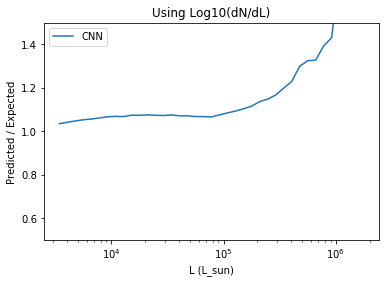

2385 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13843_rotate_0_subfield_6__Li_-2.185e-02_1.383e+00_-1.628e+00_3.120e-01_3.092e-01 ----------------------------
Error and MSE for the given base_number:
[0.017951870337128639, 0.037346281111240387]


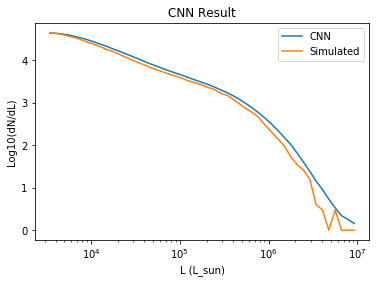

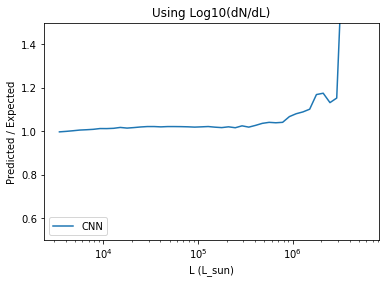

5260 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13827_rotate_0_subfield_1__Li_3.273e-02_1.346e+00_-2.040e+00_3.077e-01_2.958e-01 ----------------------------
Error and MSE for the given base_number:
[0.1596221923828125, 0.36741408705711365]


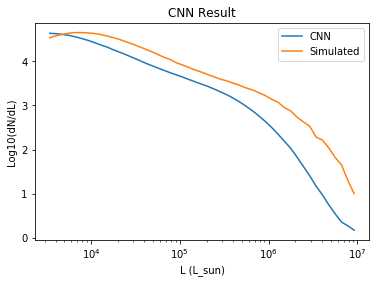

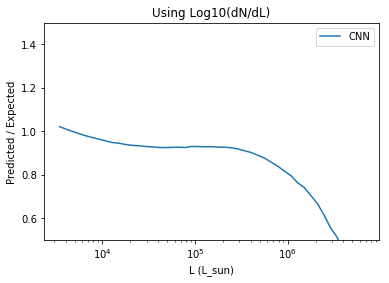

1944 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13591_rotate_0_subfield_22__Li_-5.566e-03_1.381e+00_-2.016e+00_3.025e-01_3.055e-01 ----------------------------
Error and MSE for the given base_number:
[0.0094190202653408051, 0.01909341849386692]


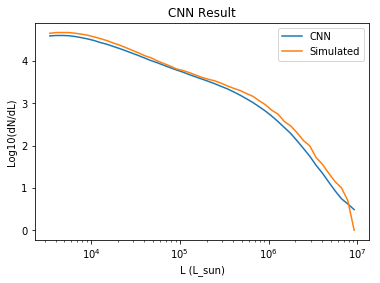

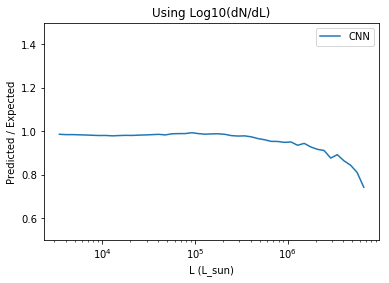

517 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13613_rotate_0_subfield_22__Li_-1.041e-02_1.460e+00_-1.576e+00_2.941e-01_3.040e-01 ----------------------------
Error and MSE for the given base_number:
[0.44549641013145447, 1.2212820053100586]


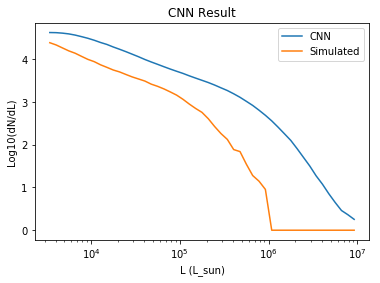

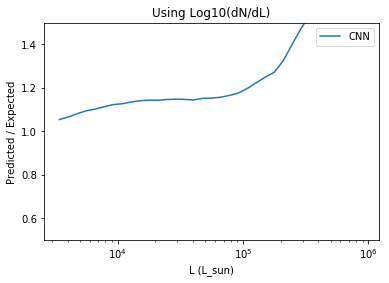

In [73]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(bigger_input_z, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=1, lum_func_size=lum_func_size)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

3680 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13883_rotate_0_subfield_3__Li_-1.626e-02_1.434e+00_-1.859e+00_3.019e-01_2.842e-01 ----------------------------
Error and MSE for the given base_number:
[0.0080150328576564789, 0.016203537583351135]


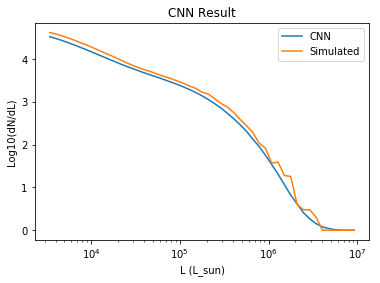

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


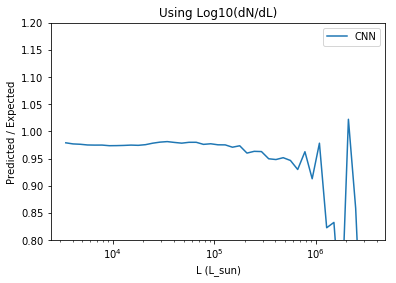

3177 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13797_rotate_0_subfield_10__Li_1.452e-02_1.359e+00_-1.679e+00_2.927e-01_3.067e-01 ----------------------------
Error and MSE for the given base_number:
[0.025113103911280632, 0.051489699631929398]


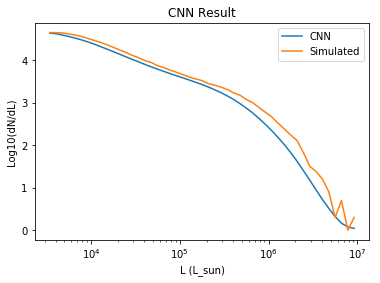

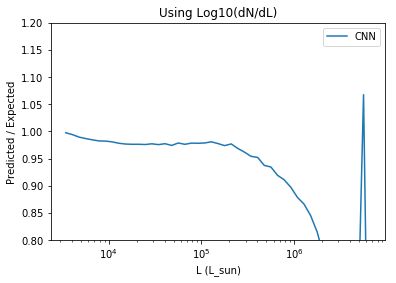

66 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13665_rotate_0_subfield_27__Li_-4.427e-03_1.377e+00_-1.598e+00_2.927e-01_2.779e-01 ----------------------------
Error and MSE for the given base_number:
[0.0069684470072388649, 0.014021769165992737]


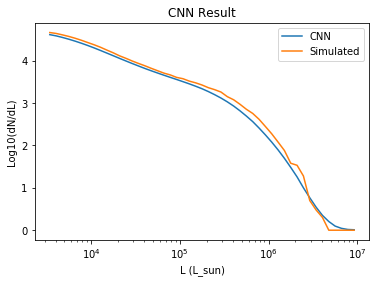

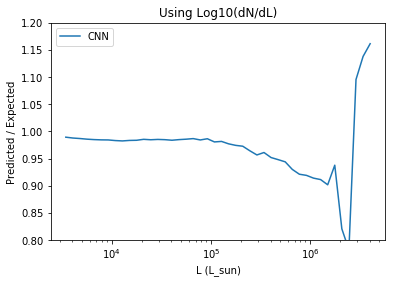

111 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13643_rotate_0_subfield_18__Li_2.569e-02_1.372e+00_-2.350e+00_2.915e-01_3.147e-01 ----------------------------
Error and MSE for the given base_number:
[0.0092335222288966179, 0.018702158704400063]


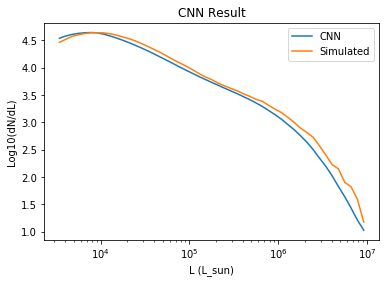

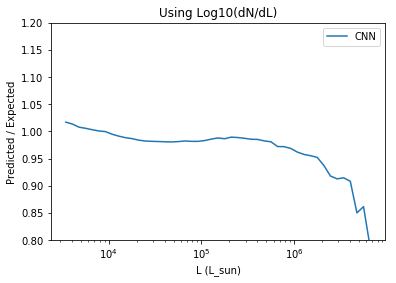

1666 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13771_rotate_0_subfield_2__Li_-1.949e-02_1.383e+00_-1.477e+00_3.043e-01_2.939e-01 ----------------------------
Error and MSE for the given base_number:
[0.012239384464919567, 0.024825232103466988]


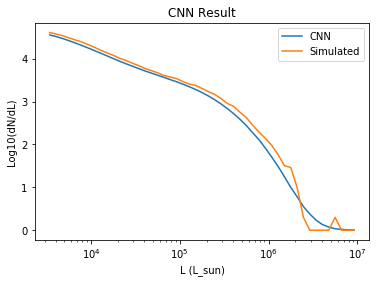

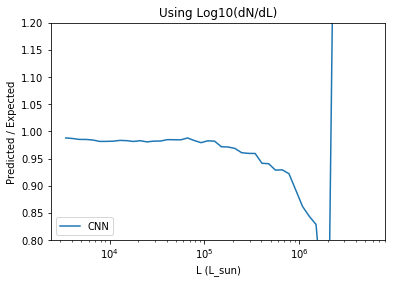

1822 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13685_rotate_0_subfield_5__Li_-1.753e-02_1.376e+00_-9.403e-01_3.127e-01_2.978e-01 ----------------------------
Error and MSE for the given base_number:
[0.026669891551136971, 0.055165912955999374]


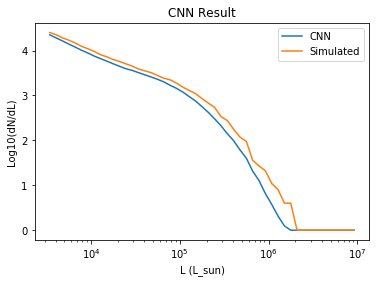

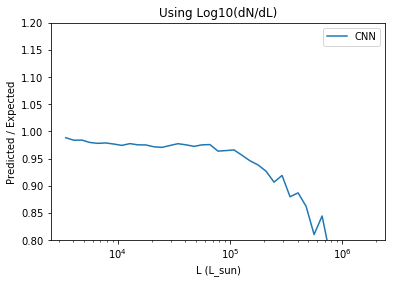

2153 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13645_rotate_0_subfield_25__Li_-1.528e-02_1.358e+00_-1.242e+00_3.113e-01_2.916e-01 ----------------------------
Error and MSE for the given base_number:
[0.014167607761919498, 0.028899827972054482]


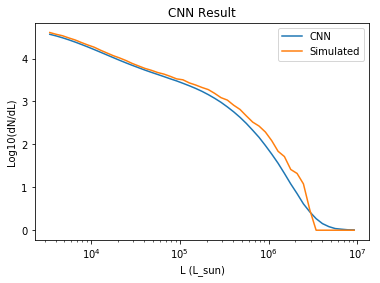

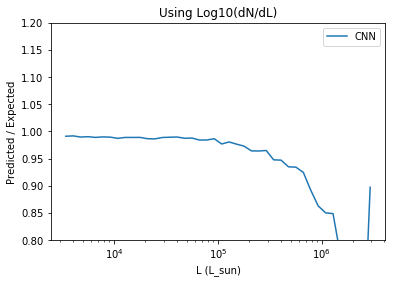

2571 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13765_rotate_0_subfield_28__Li_1.769e-02_1.389e+00_-1.598e+00_2.959e-01_2.971e-01 ----------------------------
Error and MSE for the given base_number:
[0.0094630206003785133, 0.019106928259134293]


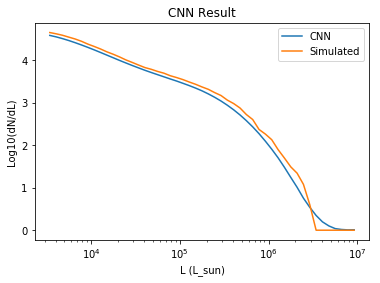

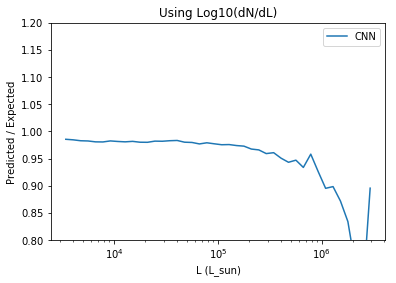

3217 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13653_rotate_0_subfield_4__Li_1.284e-02_1.396e+00_-2.372e+00_2.897e-01_3.155e-01 ----------------------------
Error and MSE for the given base_number:
[0.013659755699336529, 0.02785603329539299]


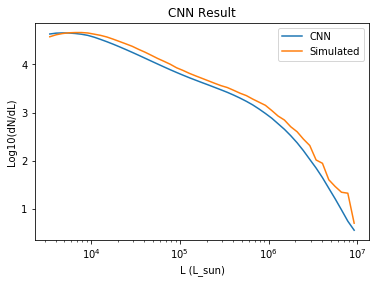

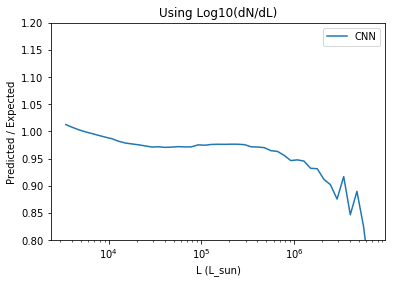

442 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13713_rotate_0_subfield_4__Li_7.487e-03_1.398e+00_-1.176e+00_2.871e-01_3.050e-01 ----------------------------
Error and MSE for the given base_number:
[0.018936056643724442, 0.038518644869327545]


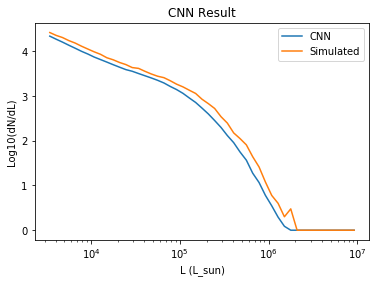

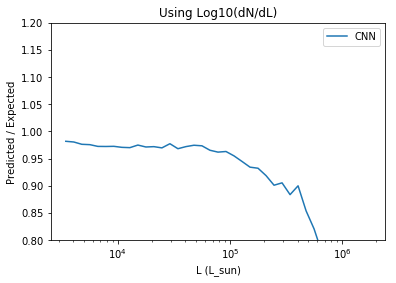

In [28]:
for numb in np.random.choice(range(len(random_small_Li_base)), 10):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(full_train_basic_adam, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

653 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13833_rotate_0_subfield_12__Li_4.548e-02_1.452e+00_-1.924e+00_3.065e-01_3.131e-01 ----------------------------
Error and MSE for the given base_number:
[0.002617282560095191, 0.0052551832050085068]


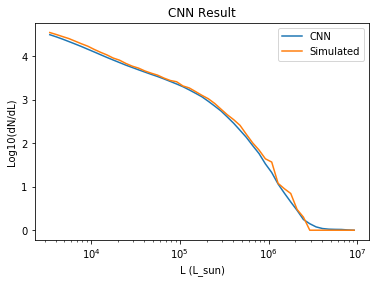

Error and MSE for the given base_number:
[0.29802292585372925, 0.74831515550613403]


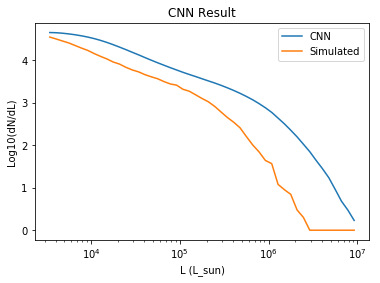

Error and MSE for the given base_number:
[0.0017115254886448383, 0.0034333434887230396]


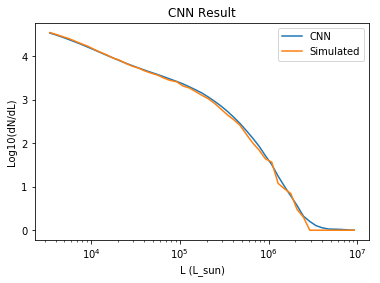

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


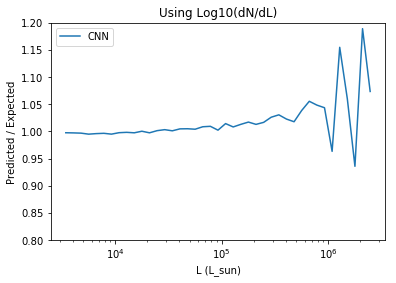

4401 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13701_rotate_0_subfield_34__Li_4.380e-02_1.294e+00_-1.810e+00_3.025e-01_3.128e-01 ----------------------------
Error and MSE for the given base_number:
[0.020981358364224434, 0.04299796000123024]


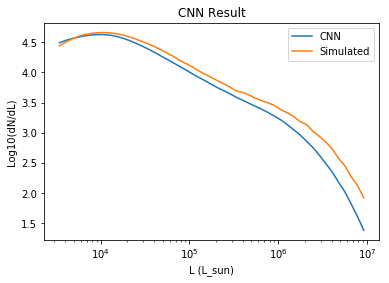

Error and MSE for the given base_number:
[0.04852721095085144, 0.10228614509105682]


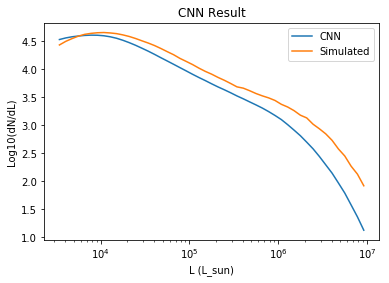

Error and MSE for the given base_number:
[0.018142880871891975, 0.036942772567272186]


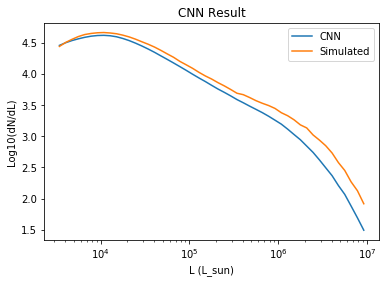

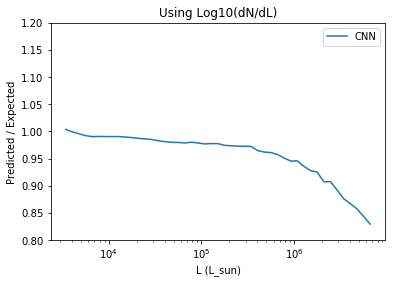

5635 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_28__Li_3.855e-02_1.308e+00_-1.779e+00_2.879e-01_3.020e-01 ----------------------------
Error and MSE for the given base_number:
[0.023401448503136635, 0.04794953390955925]


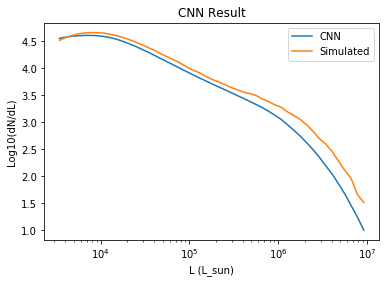

Error and MSE for the given base_number:
[0.007921513170003891, 0.015976184979081154]


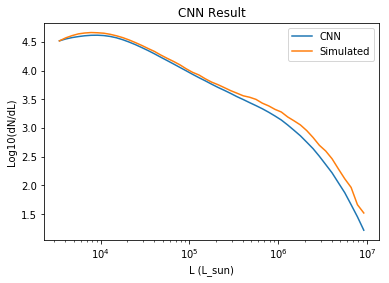

Error and MSE for the given base_number:
[0.017666401341557503, 0.035959921777248383]


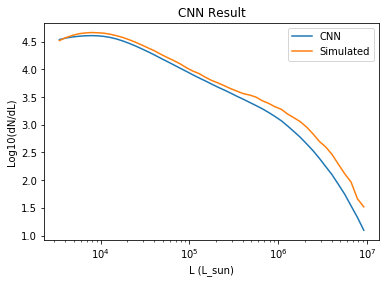

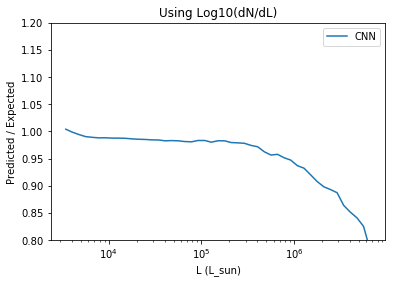

1192 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13879_rotate_0_subfield_13__Li_-2.991e-02_1.464e+00_-1.688e+00_3.135e-01_3.014e-01 ----------------------------
Error and MSE for the given base_number:
[0.027243375778198242, 0.055694464594125748]


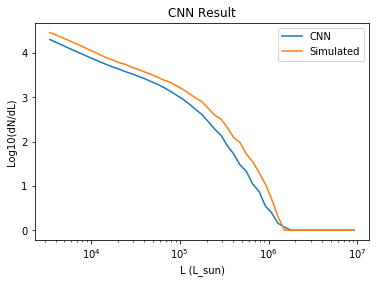

Error and MSE for the given base_number:
[0.44522535800933838, 1.2333352565765381]


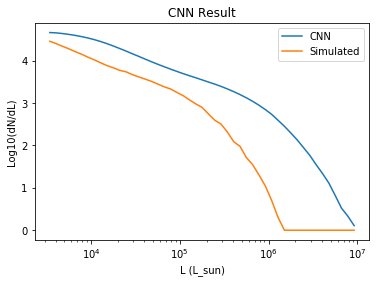

Error and MSE for the given base_number:
[0.027912411838769913, 0.058560851961374283]


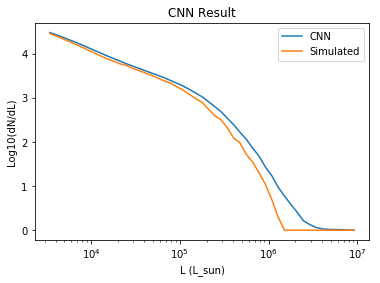

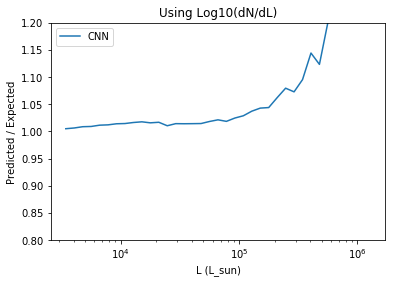

5089 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13705_rotate_0_subfield_2__Li_-1.386e-02_1.318e+00_-2.277e+00_3.040e-01_2.926e-01 ----------------------------
Error and MSE for the given base_number:
[0.0048050200566649437, 0.0096709728240966797]


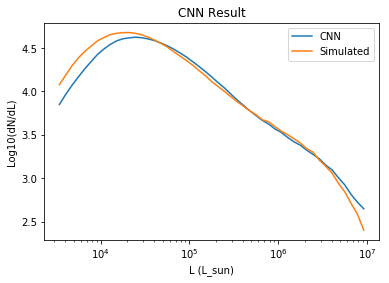

Error and MSE for the given base_number:
[0.064503036439418793, 0.13563749194145203]


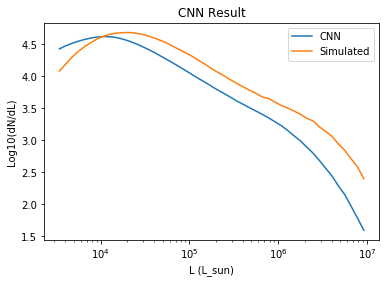

Error and MSE for the given base_number:
[0.014031998813152313, 0.028329096734523773]


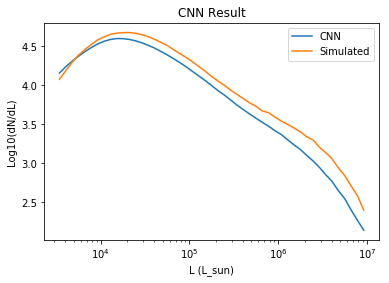

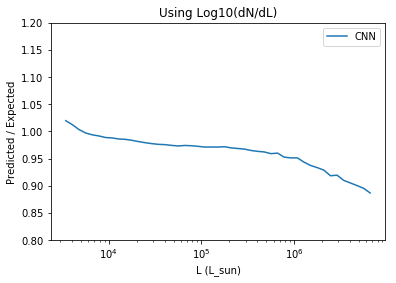

5303 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13747_rotate_0_subfield_2__Li_4.501e-02_1.368e+00_-9.637e-01_3.083e-01_2.842e-01 ----------------------------
Error and MSE for the given base_number:
[0.043630365282297134, 0.09147142618894577]


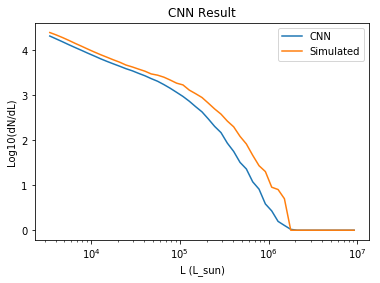

Error and MSE for the given base_number:
[0.40215024352073669, 1.0607898235321045]


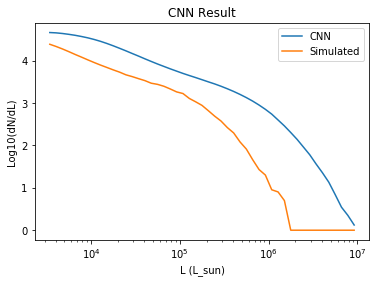

Error and MSE for the given base_number:
[0.0085386596620082855, 0.017468877136707306]


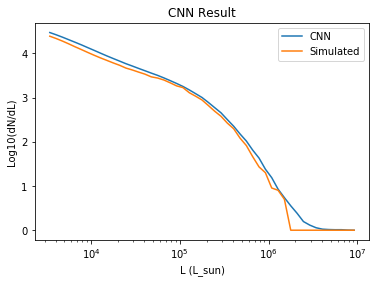

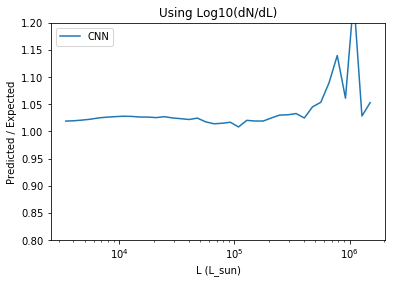

1765 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13891_rotate_0_subfield_26__Li_-2.353e-02_1.393e+00_-1.916e+00_2.952e-01_2.804e-01 ----------------------------
Error and MSE for the given base_number:
[0.0037953793071210384, 0.0076279593631625175]


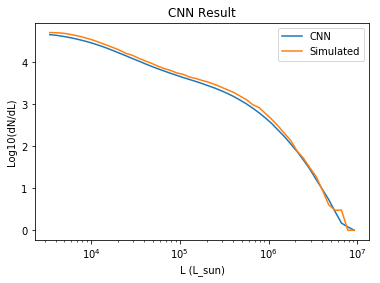

Error and MSE for the given base_number:
[0.011324646882712841, 0.02319486066699028]


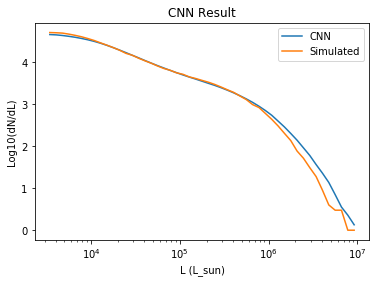

Error and MSE for the given base_number:
[0.0028172610327601433, 0.0056652333587408066]


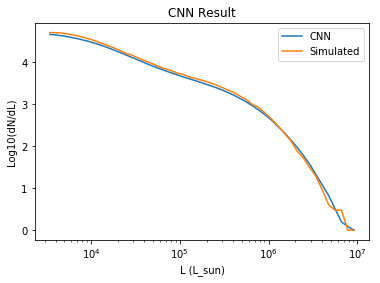

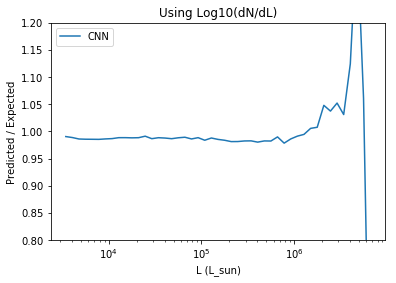

4086 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13593_rotate_0_subfield_18__Li_3.668e-02_1.344e+00_-1.430e+00_3.105e-01_2.994e-01 ----------------------------
Error and MSE for the given base_number:
[0.020133016631007195, 0.041940122842788696]


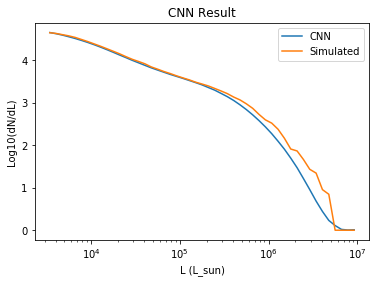

Error and MSE for the given base_number:
[0.040645107626914978, 0.085724107921123505]


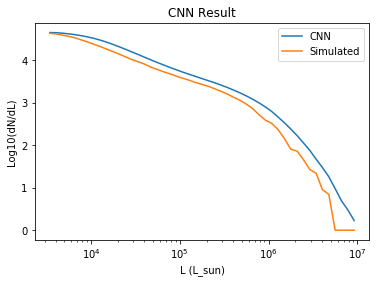

Error and MSE for the given base_number:
[0.0045710424892604351, 0.0092483693733811378]


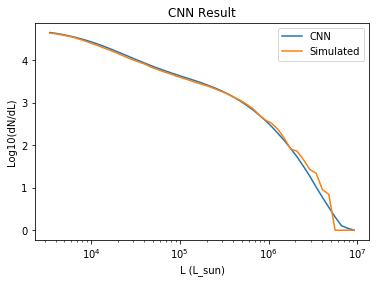

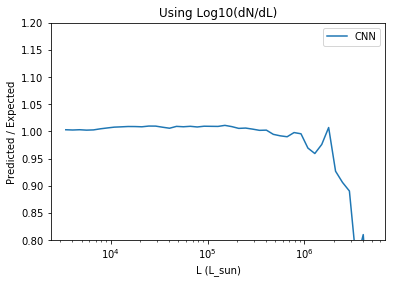

4026 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13597_rotate_0_subfield_0__Li_1.329e-02_1.333e+00_-1.260e+00_2.911e-01_2.939e-01 ----------------------------
Error and MSE for the given base_number:
[0.015008472837507725, 0.031022399663925171]


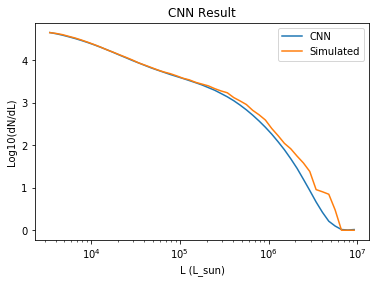

Error and MSE for the given base_number:
[0.042807240039110184, 0.088809609413146973]


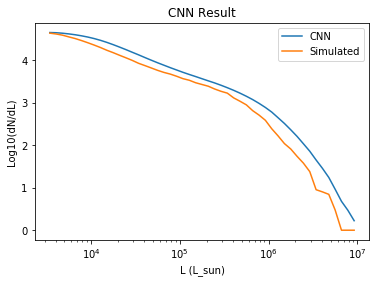

Error and MSE for the given base_number:
[0.0040601915679872036, 0.0082413647323846817]


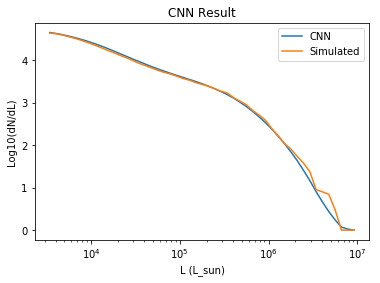

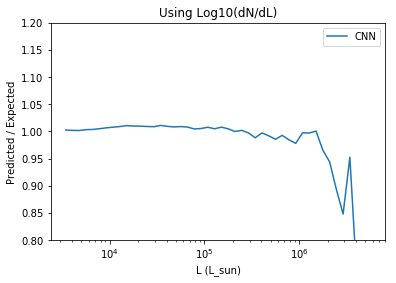

2271 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13727_rotate_0_subfield_4__Li_1.392e-02_1.302e+00_-1.959e+00_2.998e-01_3.156e-01 ----------------------------
Error and MSE for the given base_number:
[0.0088143516331911087, 0.017839677631855011]


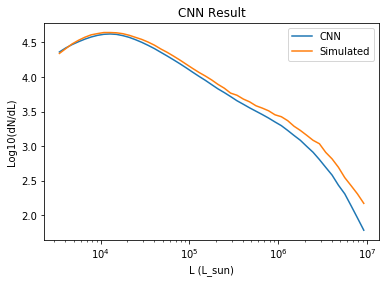

Error and MSE for the given base_number:
[0.083724617958068848, 0.18363767862319946]


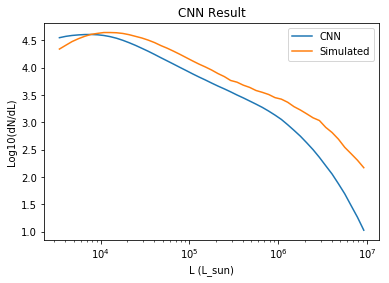

Error and MSE for the given base_number:
[0.018461465835571289, 0.037685718387365341]


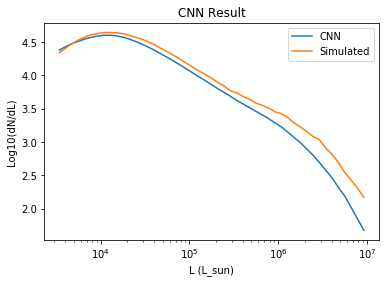

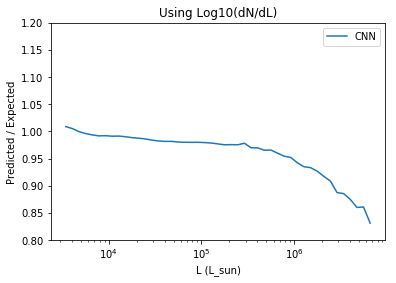

In [32]:
for numb in np.random.choice(range(len(random_small_Li_base)), 10):
# for i in range(len(random_small_Li_base[int(len(random_small_Li_base)*.8):])):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_zero, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=0)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_zero, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=5)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_zero, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

5162 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13683_rotate_0_subfield_1__Li_5.207e-02_1.339e+00_-1.540e+00_3.150e-01_2.917e-01 ----------------------------
Error and MSE for the given base_number:
[0.10094820708036423, 0.22343617677688599]


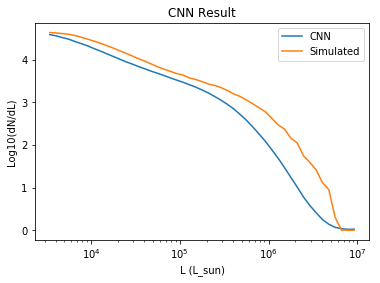

Error and MSE for the given base_number:
[0.03845498338341713, 0.080794990062713623]


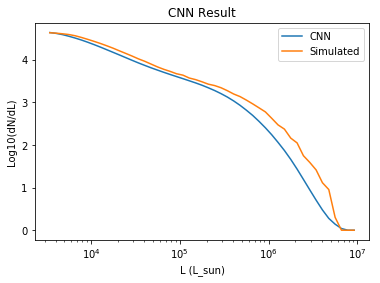

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


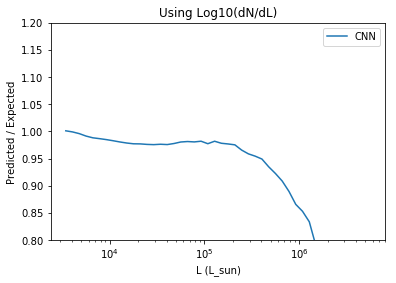

4229 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13717_rotate_0_subfield_29__Li_-2.805e-04_1.338e+00_-1.353e+00_3.014e-01_2.849e-01 ----------------------------
Error and MSE for the given base_number:
[0.10121370851993561, 0.22098439931869507]


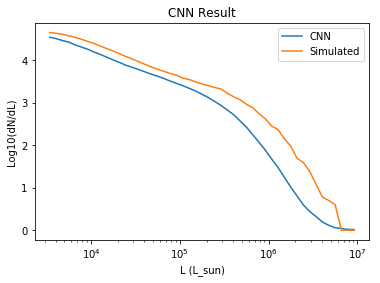

Error and MSE for the given base_number:
[0.074805103242397308, 0.1606605052947998]


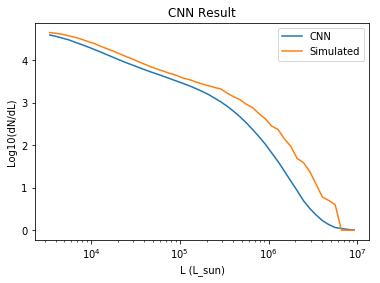

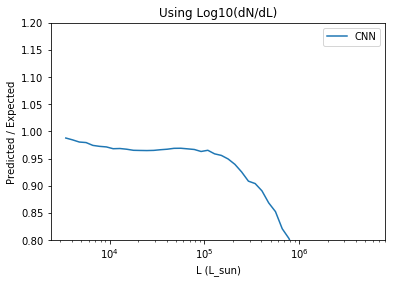

5436 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13645_rotate_0_subfield_23__Li_-2.663e-02_1.390e+00_-1.581e+00_2.903e-01_2.974e-01 ----------------------------
Error and MSE for the given base_number:
[0.17314936220645905, 0.39725428819656372]


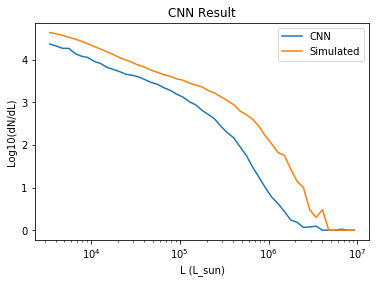

Error and MSE for the given base_number:
[0.081397160887718201, 0.17455673217773438]


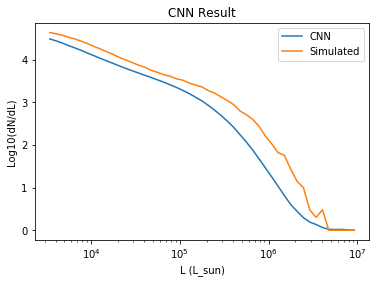

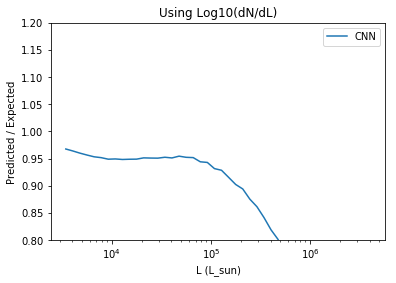

5592 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13747_rotate_0_subfield_1__Li_1.482e-03_1.349e+00_-1.600e+00_2.931e-01_3.076e-01 ----------------------------
Error and MSE for the given base_number:
[0.076018840074539185, 0.16482783854007721]


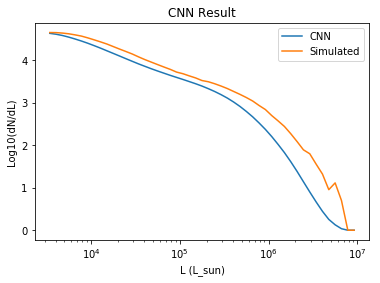

Error and MSE for the given base_number:
[0.043881382793188095, 0.092985950410366058]


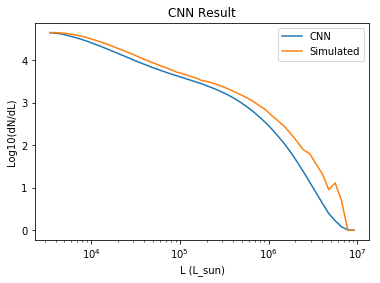

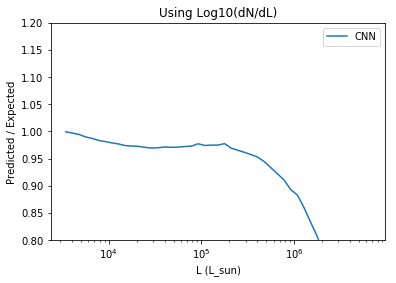

5701 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13783_rotate_0_subfield_25__Li_2.263e-02_1.360e+00_-1.575e+00_3.073e-01_3.005e-01 ----------------------------
Error and MSE for the given base_number:
[0.12568081915378571, 0.27963617444038391]


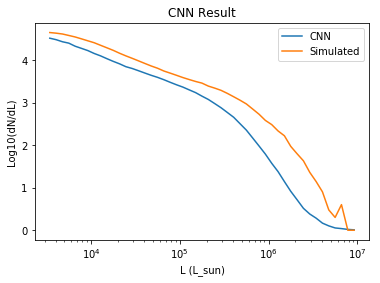

Error and MSE for the given base_number:
[0.093555852770805359, 0.20408530533313751]


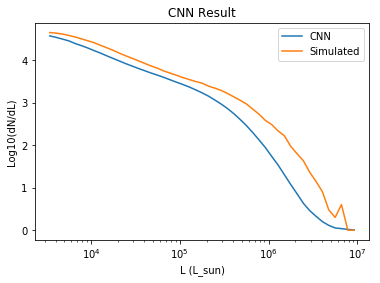

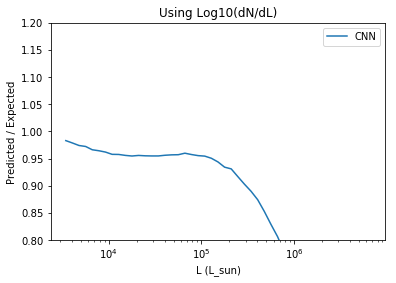

701 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13879_rotate_0_subfield_17__Li_1.503e-02_1.419e+00_-1.743e+00_3.122e-01_3.150e-01 ----------------------------
Error and MSE for the given base_number:
[0.15194770693778992, 0.34637930989265442]


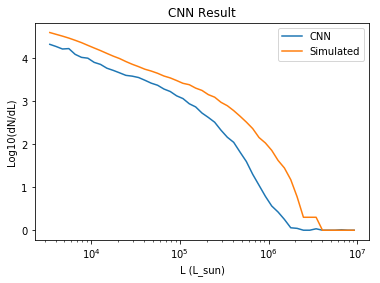

Error and MSE for the given base_number:
[0.036632969975471497, 0.076041929423809052]


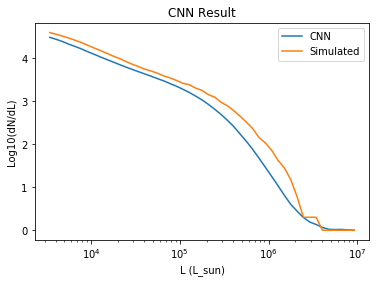

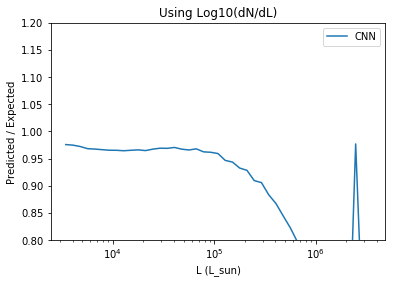

382 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_7__Li_1.750e-02_1.346e+00_-1.361e+00_3.070e-01_3.083e-01 ----------------------------
Error and MSE for the given base_number:
[0.15293730795383453, 0.34699732065200806]


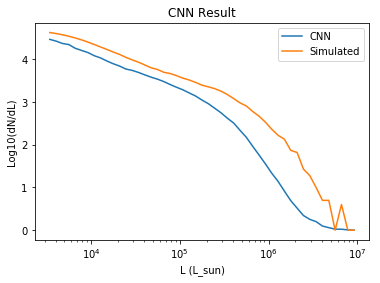

Error and MSE for the given base_number:
[0.17412903904914856, 0.40222126245498657]


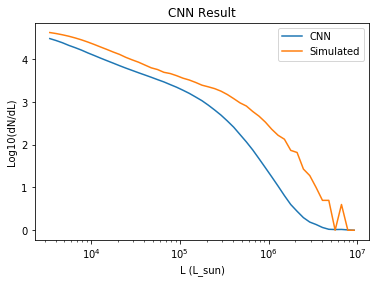

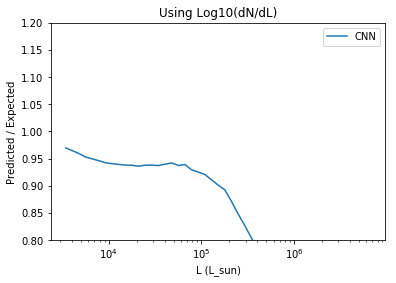

1422 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13865_rotate_0_subfield_32__Li_9.090e-03_1.339e+00_-2.525e+00_2.869e-01_2.830e-01 ----------------------------
Error and MSE for the given base_number:
[0.011119890958070755, 0.022385384887456894]


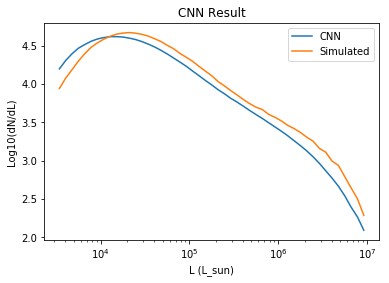

Error and MSE for the given base_number:
[0.017408397048711777, 0.035180062055587769]


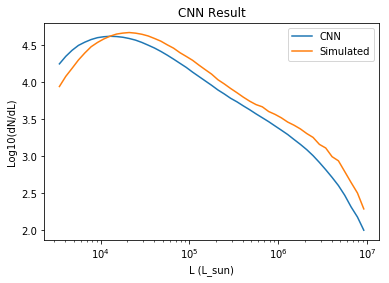

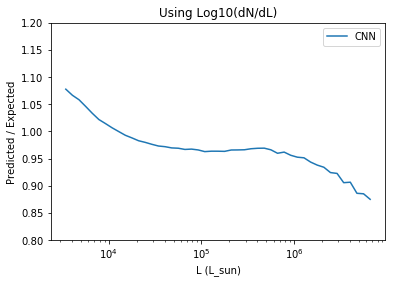

3620 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13625_rotate_0_subfield_24__Li_-8.326e-03_1.373e+00_-1.598e+00_2.979e-01_2.952e-01 ----------------------------
Error and MSE for the given base_number:
[0.037885114550590515, 0.078803576529026031]


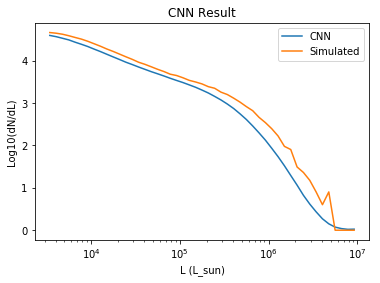

Error and MSE for the given base_number:
[0.16920284926891327, 0.38491970300674438]


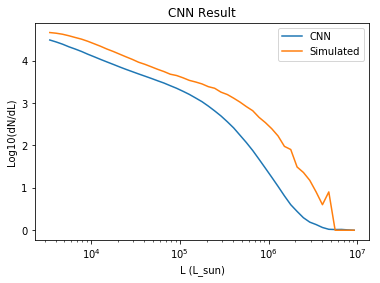

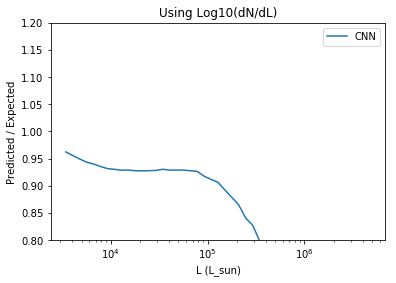

3145 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13775_rotate_0_subfield_33__Li_2.891e-02_1.330e+00_-1.299e+00_3.087e-01_3.004e-01 ----------------------------
Error and MSE for the given base_number:
[0.09624142199754715, 0.21120552718639374]


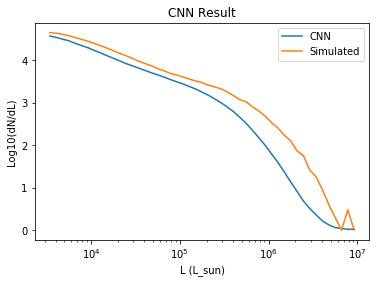

Error and MSE for the given base_number:
[0.089423909783363342, 0.19579850137233734]


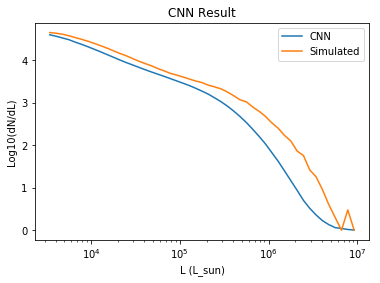

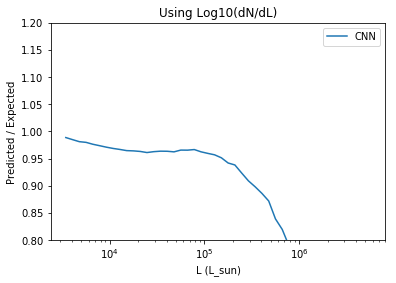

In [30]:
for numb in np.random.choice(range(len(random_small_Li_base)), 10):
# for i in range(6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=0)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

5599 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13825_rotate_0_subfield_21__Li_-1.590e-02_1.415e+00_-1.516e+00_2.996e-01_3.097e-01 ----------------------------
Error and MSE for the given base_number:
[0.015062849968671799, 0.031055914238095284]


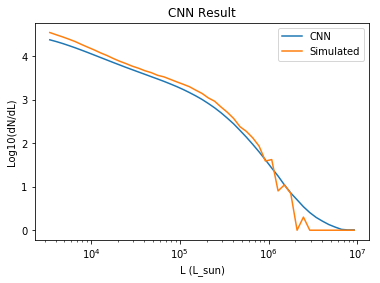

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


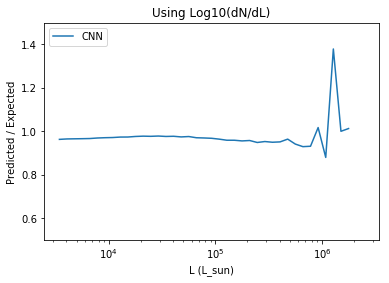

2956 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13667_rotate_0_subfield_31__Li_7.085e-03_1.390e+00_-1.918e+00_3.066e-01_2.773e-01 ----------------------------
Error and MSE for the given base_number:
[0.072388686239719391, 0.1522638201713562]


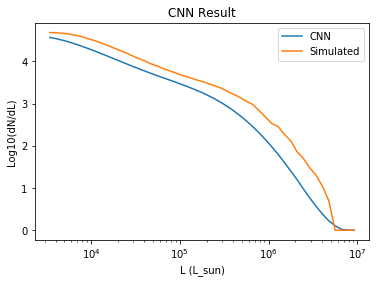

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


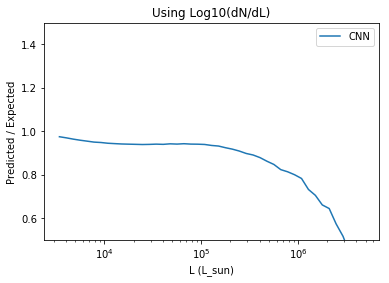

1198 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13685_rotate_0_subfield_15__Li_1.726e-02_1.413e+00_-1.930e+00_3.002e-01_3.042e-01 ----------------------------
Error and MSE for the given base_number:
[0.071657761931419373, 0.14934869110584259]


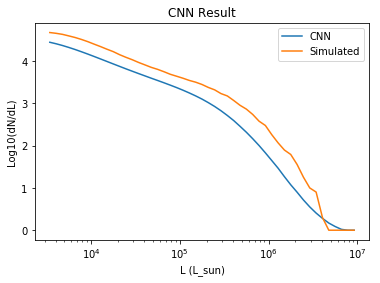

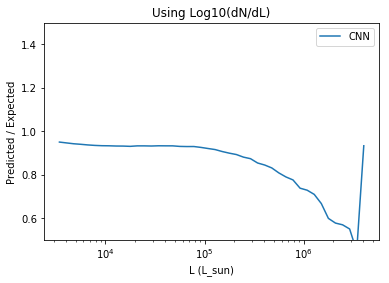

1626 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13703_rotate_0_subfield_13__Li_-4.253e-03_1.387e+00_-1.604e+00_3.041e-01_2.984e-01 ----------------------------
Error and MSE for the given base_number:
[0.069973759353160858, 0.14603456854820251]


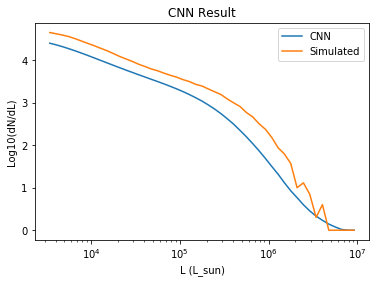

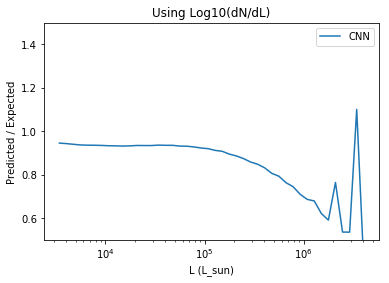

4955 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13579_rotate_0_subfield_24__Li_-1.847e-02_1.321e+00_-2.061e+00_3.111e-01_2.869e-01 ----------------------------
Error and MSE for the given base_number:
[0.046830937266349792, 0.097974546253681183]


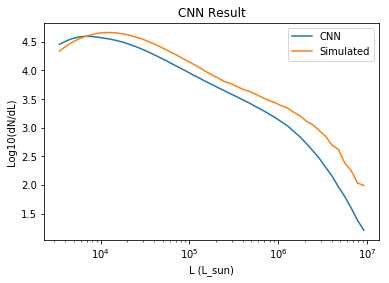

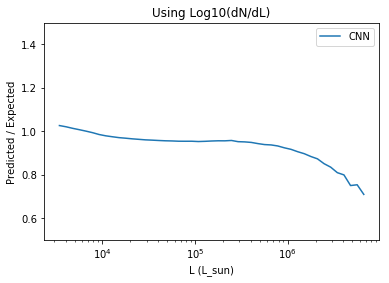

4594 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13721_rotate_0_subfield_20__Li_1.255e-02_1.398e+00_-1.255e+00_2.935e-01_3.068e-01 ----------------------------
Error and MSE for the given base_number:
[0.016646642237901688, 0.034262895584106445]


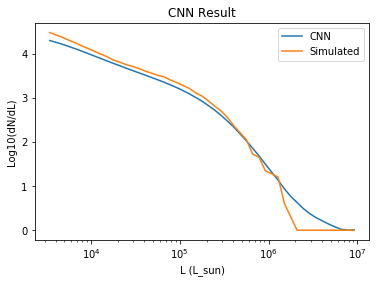

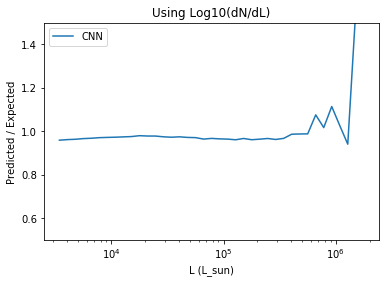

5714 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13579_rotate_0_subfield_19__Li_-1.336e-02_1.421e+00_-1.290e+00_3.033e-01_3.056e-01 ----------------------------
Error and MSE for the given base_number:
[0.034527353942394257, 0.073726192116737366]


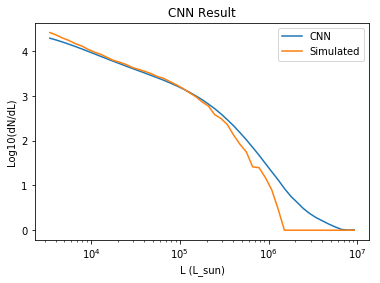

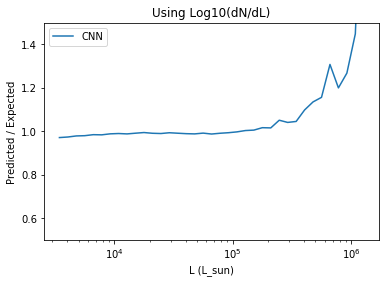

2030 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13807_rotate_0_subfield_6__Li_-1.044e-02_1.438e+00_-1.393e+00_2.682e-01_2.781e-01 ----------------------------
Error and MSE for the given base_number:
[0.073527857661247253, 0.16323854029178619]


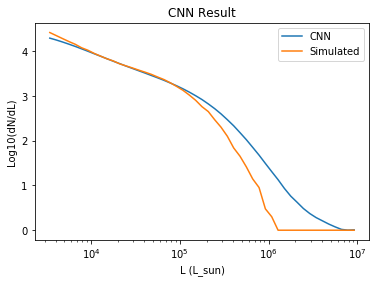

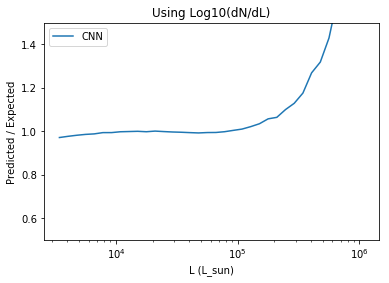

3518 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13893_rotate_0_subfield_28__Li_2.427e-02_1.407e+00_-9.603e-01_2.977e-01_2.934e-01 ----------------------------
Error and MSE for the given base_number:
[0.13409124314785004, 0.32154551148414612]


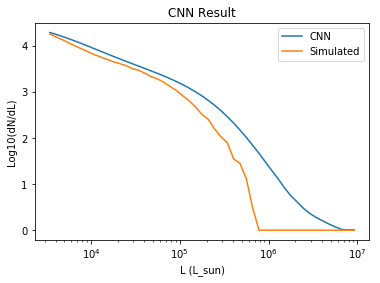

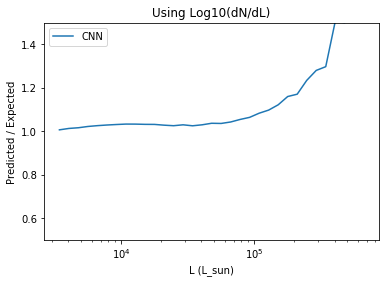

3576 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13621_rotate_0_subfield_17__Li_-1.821e-03_1.374e+00_-2.486e+00_3.041e-01_2.968e-01 ----------------------------
Error and MSE for the given base_number:
[0.052626796066761017, 0.10942119359970093]


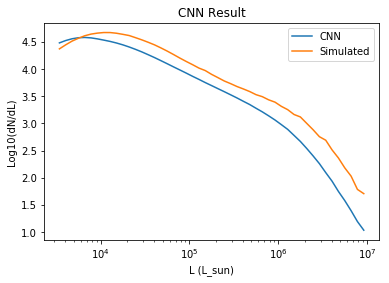

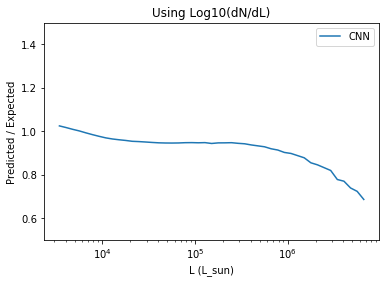

In [12]:
for numb in np.random.choice(range(len(random_small_Li_base)), 10):
# for i in range(2):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(augmentation_adam_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

In [17]:
%autoreload

4136 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13845_rotate_0_subfield_32__Li_-2.970e-02_1.384e+00_-1.536e+00_3.023e-01_3.135e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.036241557449102402, 0.075377926230430603]


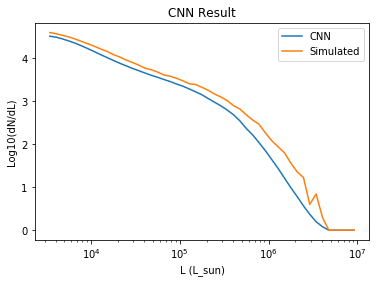

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:295: RuntimeWarning: invalid value encountered in true_divide
  # ratio_smooth = avg/cur_lum


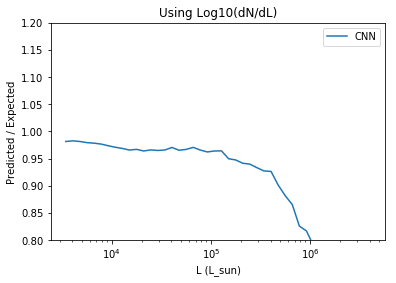

650 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13779_rotate_0_subfield_33__Li_7.457e-03_1.378e+00_-1.277e+00_2.958e-01_2.951e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.013245701789855957, 0.026821287348866463]


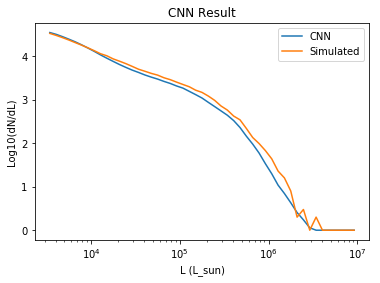

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:295: RuntimeWarning: divide by zero encountered in true_divide
  # ratio_smooth = avg/cur_lum


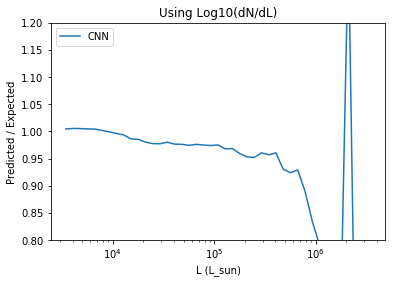

3719 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13743_rotate_0_subfield_22__Li_2.476e-02_1.361e+00_-1.414e+00_2.802e-01_2.980e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.035634204745292664, 0.074269145727157593]


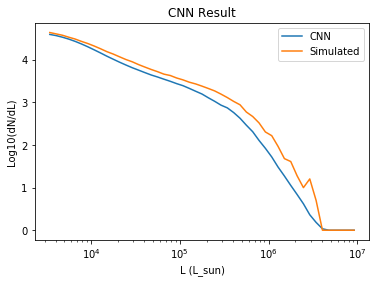

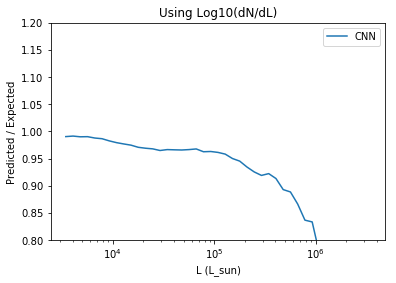

2512 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13583_rotate_0_subfield_8__Li_-2.473e-02_1.375e+00_-1.399e+00_2.863e-01_2.957e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0094877434894442558, 0.019319189712405205]


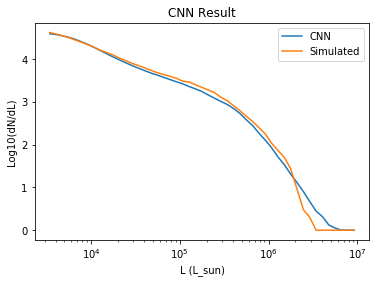

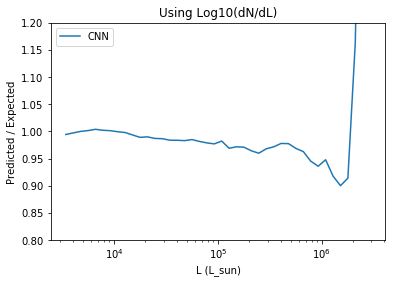

1629 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13801_rotate_0_subfield_35__Li_-3.044e-02_1.337e+00_-2.213e+00_3.186e-01_3.179e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.0071227769367396832, 0.014327629469335079]


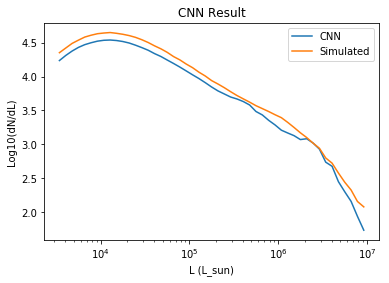

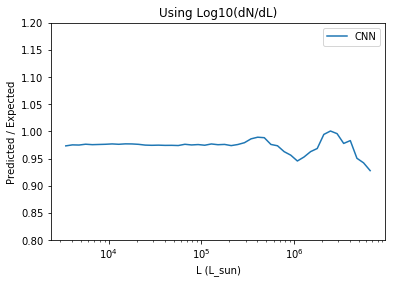

4349 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13663_rotate_0_subfield_0__Li_1.921e-03_1.333e+00_-1.885e+00_2.961e-01_3.031e-01 ----------------------------
current
Error and MSE for the given base_number:
[0.015316266566514969, 0.031131388619542122]


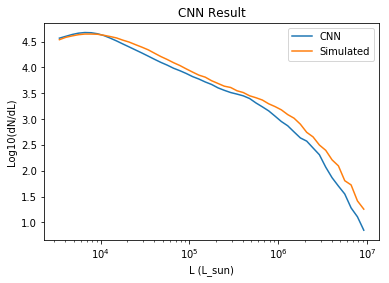

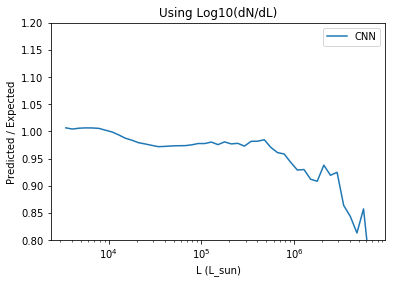

In [18]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_resnet, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

388 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13833_rotate_0_subfield_21__Li_3.212e-02_1.436e+00_-1.925e+00_3.060e-01_2.887e-01 ----------------------------
Error and MSE for the given base_number:
[0.0087722782045602798, 0.017759360373020172]


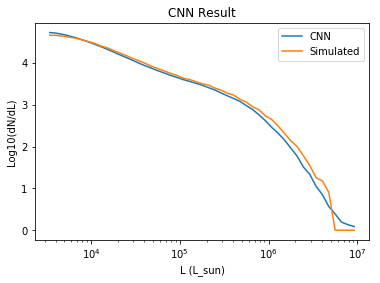

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/visualize.py:211: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


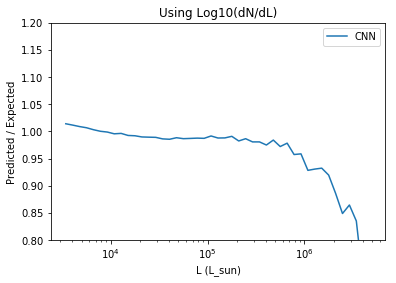

971 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13811_rotate_0_subfield_3__Li_-1.636e-02_1.487e+00_-2.049e+00_3.132e-01_3.074e-01 ----------------------------
Error and MSE for the given base_number:
[0.0083420965820550919, 0.016879098489880562]


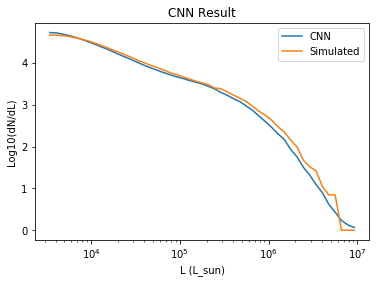

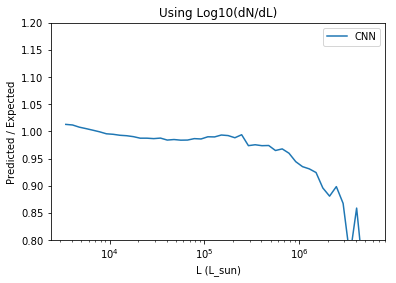

2132 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13857_rotate_0_subfield_15__Li_2.097e-03_1.440e+00_-1.747e+00_2.991e-01_2.912e-01 ----------------------------
Error and MSE for the given base_number:
[0.011507235467433929, 0.023288741707801819]


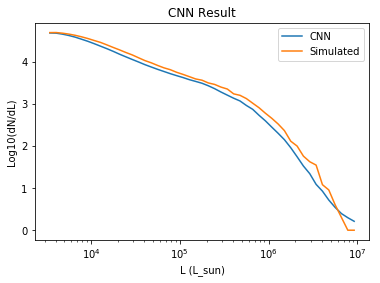

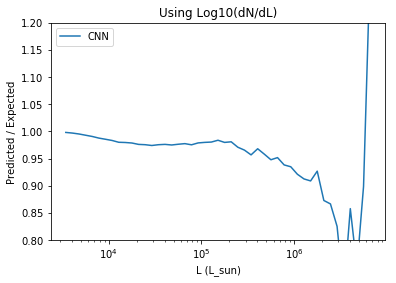

3591 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13813_rotate_0_subfield_10__Li_-3.503e-02_1.344e+00_-1.279e+00_3.018e-01_2.946e-01 ----------------------------
Error and MSE for the given base_number:
[0.011017456650733948, 0.022271204739809036]


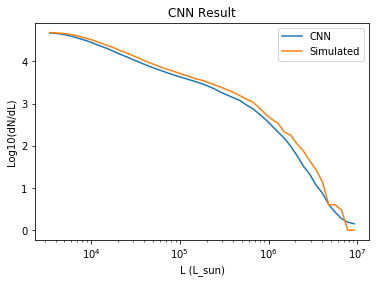

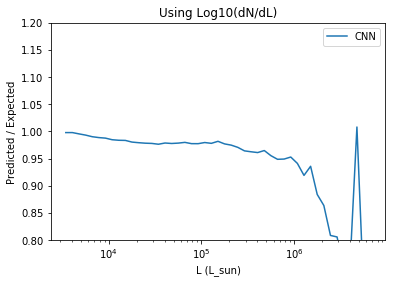

5473 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13857_rotate_0_subfield_25__Li_6.255e-04_1.394e+00_-2.322e+00_2.859e-01_3.054e-01 ----------------------------
Error and MSE for the given base_number:
[0.0043072556145489216, 0.0087107298895716667]


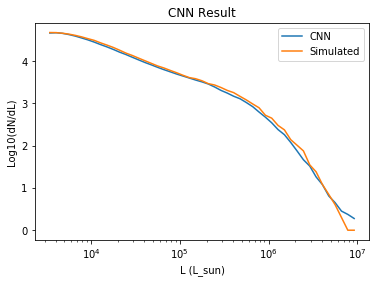

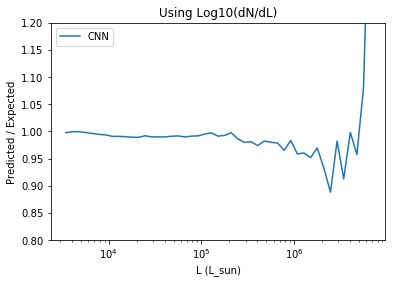

2112 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13775_rotate_0_subfield_30__Li_1.627e-02_1.374e+00_-6.437e-01_2.962e-01_3.230e-01 ----------------------------
Error and MSE for the given base_number:
[0.01218358613550663, 0.024705944582819939]


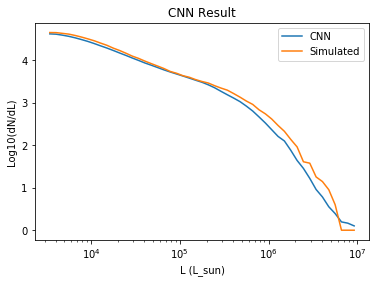

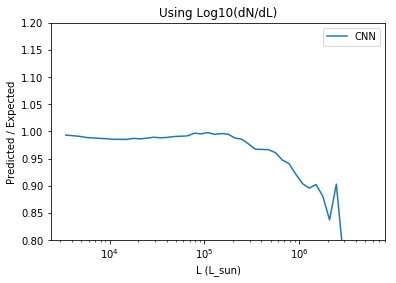

In [11]:
for numb in np.random.choice(range(len(base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_resnet_full_train, base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

1026 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13851_rotate_0_subfield_27__Li_3.025e-03_1.420e+00_-1.978e+00_2.940e-01_2.920e-01 ----------------------------
Error and MSE for the given base_number:
[0.012544523924589157, 0.025398656725883484]


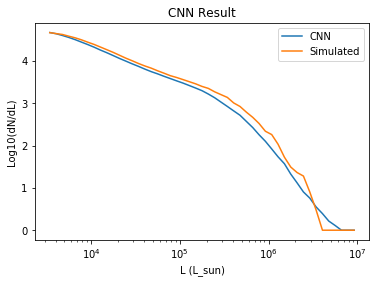

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/visualize.py:211: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/visualize.py:211: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


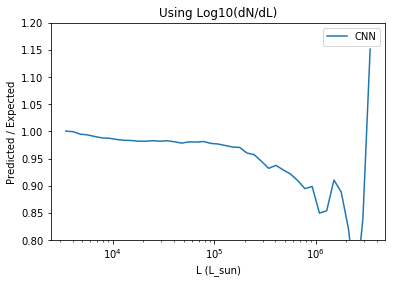

3365 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13727_rotate_0_subfield_8__Li_-2.797e-02_1.378e+00_-1.177e+00_2.945e-01_3.232e-01 ----------------------------
Error and MSE for the given base_number:
[0.0054051987826824188, 0.01091834157705307]


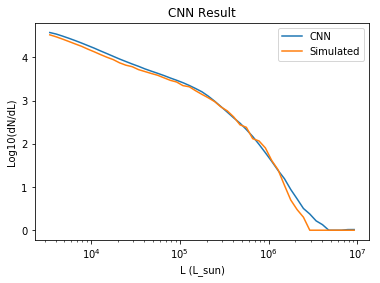

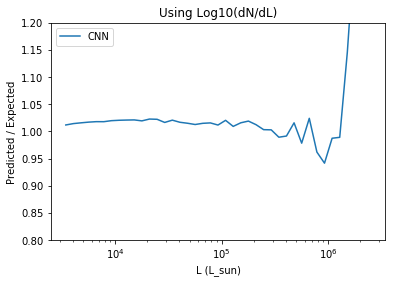

4679 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13633_rotate_0_subfield_4__Li_-6.407e-03_1.368e+00_-2.165e+00_3.290e-01_3.009e-01 ----------------------------
Error and MSE for the given base_number:
[0.073516182601451874, 0.1664661169052124]


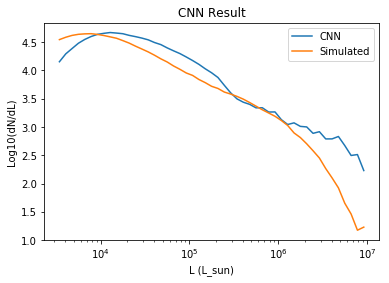

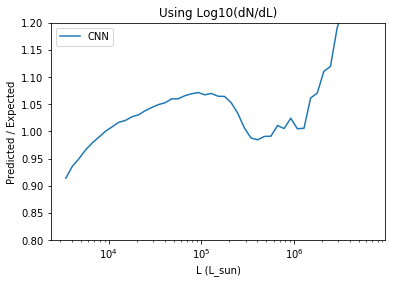

4590 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13755_rotate_0_subfield_4__Li_-2.108e-02_1.423e+00_-1.524e+00_3.007e-01_2.931e-01 ----------------------------
Error and MSE for the given base_number:
[0.013840301893651485, 0.028725989162921906]


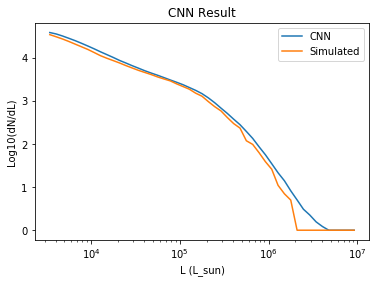

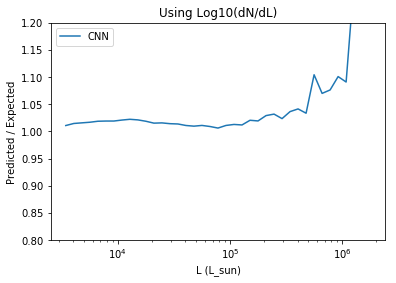

3996 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13609_rotate_0_subfield_32__Li_2.375e-02_1.337e+00_-2.054e+00_2.996e-01_2.970e-01 ----------------------------
Error and MSE for the given base_number:
[0.0096069406718015671, 0.019305994734168053]


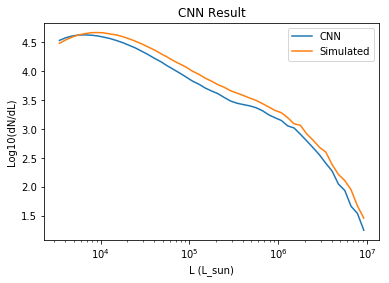

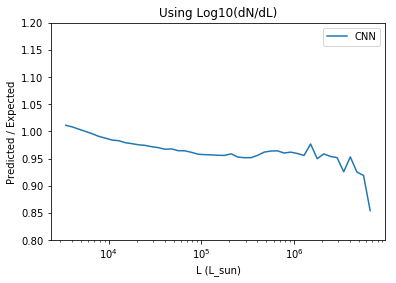

2642 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13889_rotate_0_subfield_21__Li_-2.136e-02_1.416e+00_-1.642e+00_2.954e-01_2.904e-01 ----------------------------
Error and MSE for the given base_number:
[0.0043031242676079273, 0.0086583420634269714]


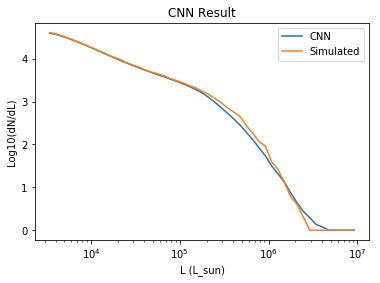

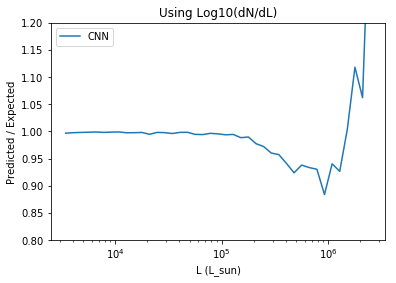

In [12]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_resnet_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

In [8]:
%autoreload

5033 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13865_rotate_0_subfield_22__Li_-2.884e-02_1.412e+00_-1.251e+00_2.971e-01_3.086e-01 ----------------------------
Error and MSE for the given base_number:
[0.01403370313346386, 0.028865694999694824]


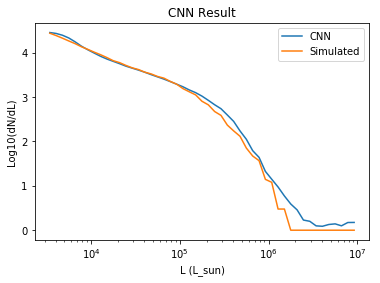

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:301: RuntimeWarning: divide by zero encountered in true_divide
  return()


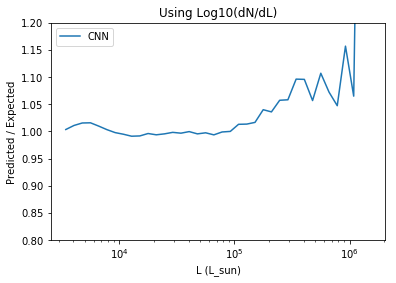

1787 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13715_rotate_0_subfield_30__Li_3.866e-02_1.367e+00_-1.681e+00_2.997e-01_2.928e-01 ----------------------------
Error and MSE for the given base_number:
[0.018774768337607384, 0.038013588637113571]


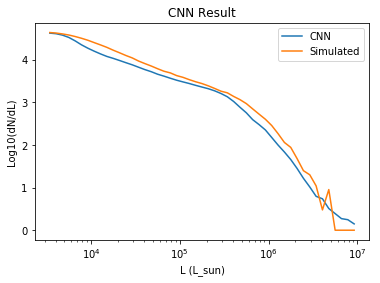

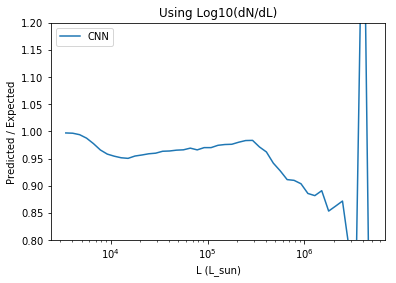

3633 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13867_rotate_0_subfield_34__Li_-2.423e-02_1.321e+00_-1.777e+00_2.993e-01_3.103e-01 ----------------------------
Error and MSE for the given base_number:
[0.016966665163636208, 0.034336373209953308]


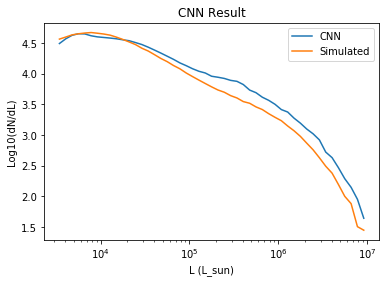

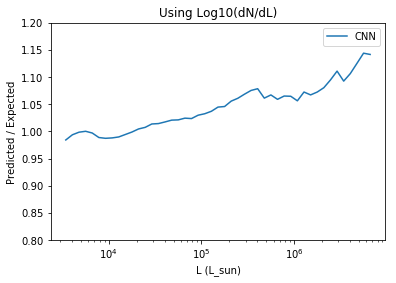

1374 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13589_rotate_0_subfield_13__Li_1.112e-03_1.460e+00_-1.513e+00_2.997e-01_2.874e-01 ----------------------------
Error and MSE for the given base_number:
[0.068202346563339233, 0.14481763541698456]


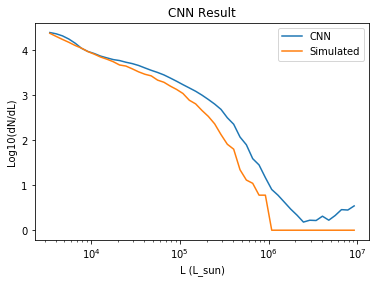

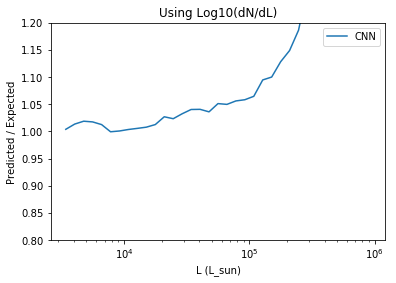

4610 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13715_rotate_0_subfield_35__Li_1.249e-02_1.450e+00_-1.068e+00_2.970e-01_3.024e-01 ----------------------------
Error and MSE for the given base_number:
[0.068406745791435242, 0.14789719879627228]


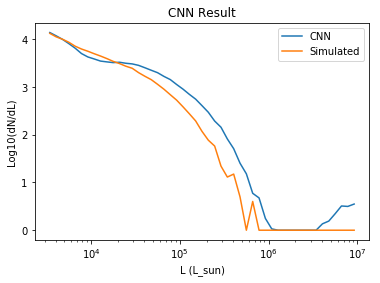

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:301: RuntimeWarning: invalid value encountered in true_divide
  return()


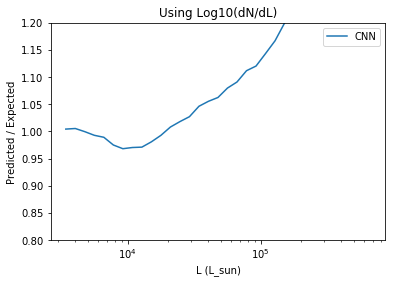

4766 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13839_rotate_0_subfield_26__Li_-8.752e-03_1.351e+00_-1.202e+00_2.855e-01_2.940e-01 ----------------------------
Error and MSE for the given base_number:
[0.02899879589676857, 0.060056127607822418]


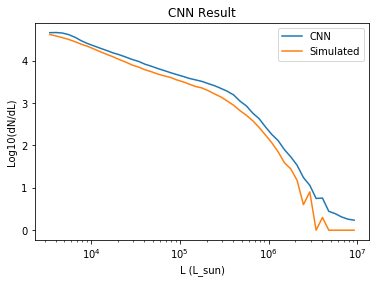

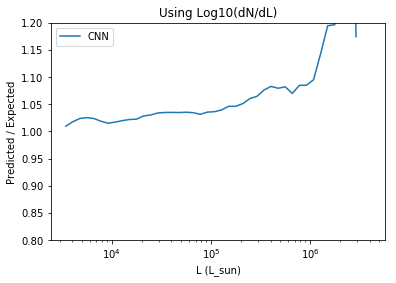

In [35]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(foreground_resnet, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=0, add_foregrounds=True)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

2596 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13805_rotate_0_subfield_7__Li_-3.133e-02_1.316e+00_-2.078e+00_3.126e-01_3.055e-01 ----------------------------
Error and MSE for the given base_number:
[0.021317269653081894, 0.04321809858083725]


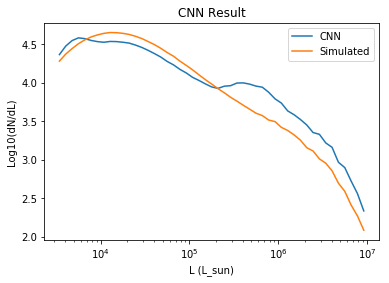

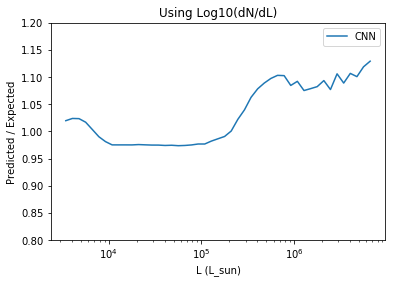

2322 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13637_rotate_0_subfield_15__Li_2.588e-02_1.398e+00_-1.843e+00_3.111e-01_2.961e-01 ----------------------------
Error and MSE for the given base_number:
[0.02655445784330368, 0.055447816848754883]


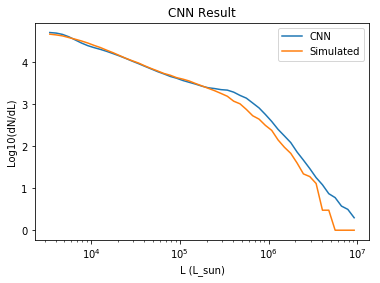

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:301: RuntimeWarning: divide by zero encountered in true_divide
  return()


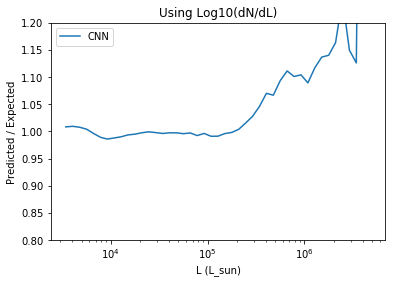

2871 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13795_rotate_0_subfield_34__Li_2.382e-02_1.372e+00_-2.146e+00_3.051e-01_3.077e-01 ----------------------------
Error and MSE for the given base_number:
[0.0063667749054729939, 0.012785008177161217]


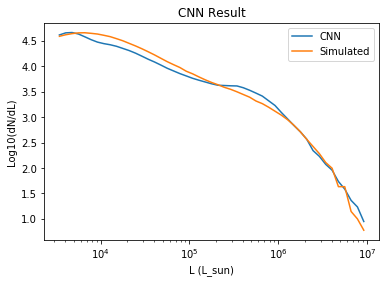

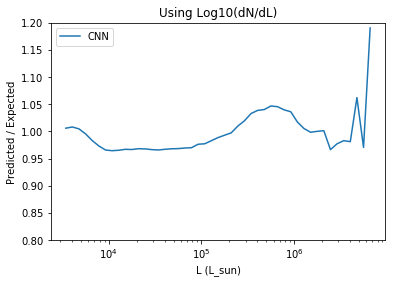

1395 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13729_rotate_0_subfield_6__Li_5.360e-02_1.373e+00_-1.078e+00_3.000e-01_2.987e-01 ----------------------------
Error and MSE for the given base_number:
[0.11799822747707367, 0.26081722974777222]


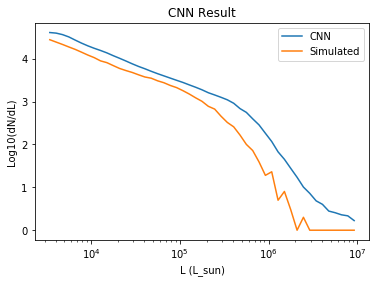

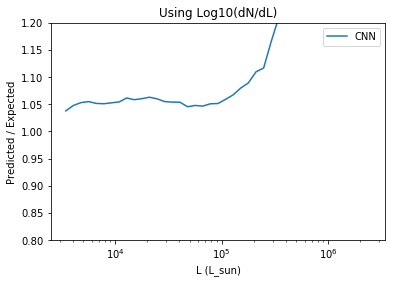

1264 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13833_rotate_0_subfield_13__Li_6.706e-02_1.376e+00_-1.774e+00_2.865e-01_2.929e-01 ----------------------------
Error and MSE for the given base_number:
[0.035494592040777206, 0.072671562433242798]


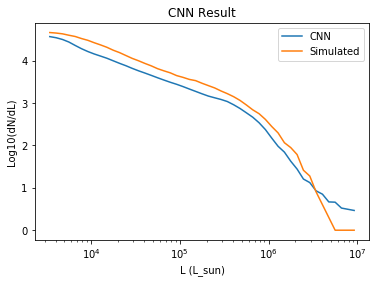

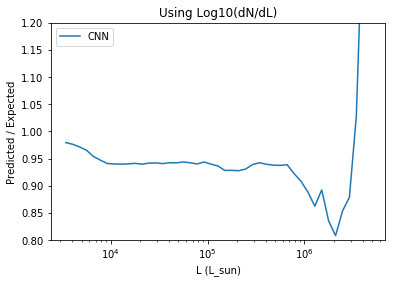

3356 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13707_rotate_0_subfield_15__Li_-2.348e-02_1.326e+00_-2.018e+00_2.978e-01_3.049e-01 ----------------------------
Error and MSE for the given base_number:
[0.030002275481820107, 0.061546504497528076]


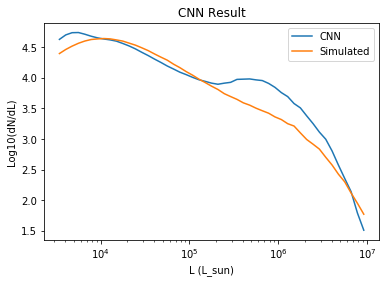

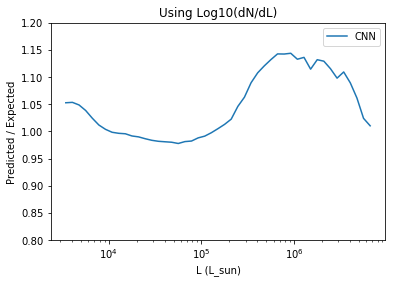

In [36]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_foreground_resnet, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11, add_foregrounds=True)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

3949 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13755_rotate_0_subfield_27__Li_-4.343e-02_1.337e+00_-1.417e+00_3.058e-01_3.027e-01 ----------------------------
Error and MSE for the given base_number:
[0.016377750784158707, 0.033330976963043213]


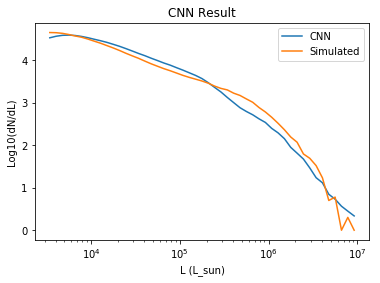

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:301: RuntimeWarning: divide by zero encountered in true_divide
  return()


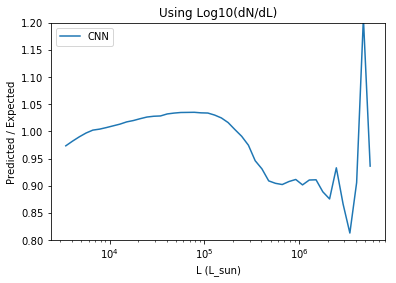

1515 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13879_rotate_0_subfield_17__Li_1.503e-02_1.419e+00_-1.743e+00_3.122e-01_3.150e-01 ----------------------------
Error and MSE for the given base_number:
[0.034798182547092438, 0.071964077651500702]


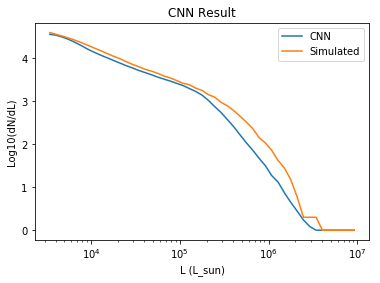

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:301: RuntimeWarning: invalid value encountered in true_divide
  return()


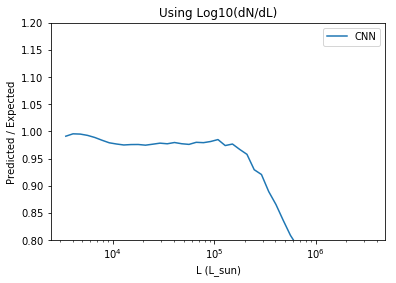

2839 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13863_rotate_0_subfield_13__Li_-2.824e-02_1.377e+00_-2.123e+00_3.133e-01_2.969e-01 ----------------------------
Error and MSE for the given base_number:
[0.08133985847234726, 0.17246837913990021]


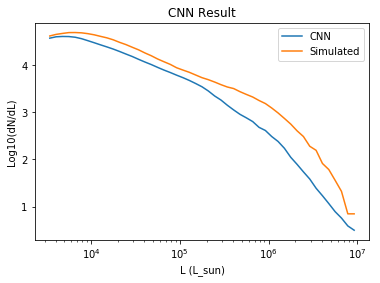

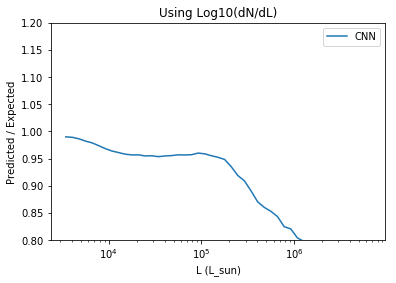

718 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13897_rotate_0_subfield_34__Li_4.598e-02_1.341e+00_-1.478e+00_2.992e-01_2.936e-01 ----------------------------
Error and MSE for the given base_number:
[0.012028999626636505, 0.024634892120957375]


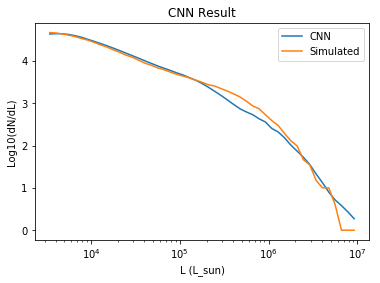

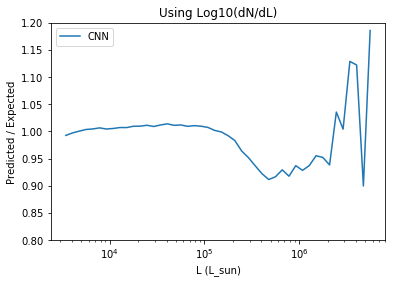

1788 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13769_rotate_0_subfield_19__Li_7.671e-03_1.351e+00_-2.000e+00_3.042e-01_3.101e-01 ----------------------------
Error and MSE for the given base_number:
[0.056453783065080643, 0.11816898733377457]


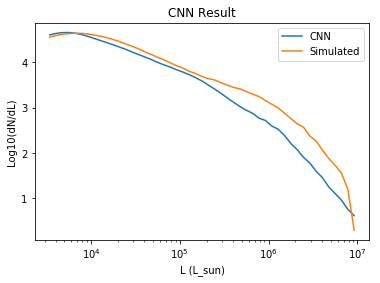

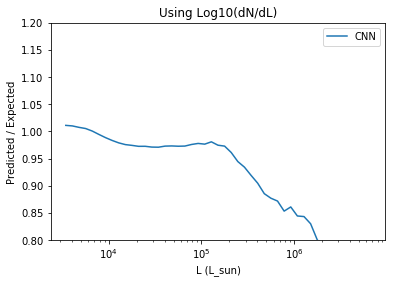

1010 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13583_rotate_0_subfield_16__Li_-4.946e-02_1.349e+00_-1.800e+00_2.889e-01_3.089e-01 ----------------------------
Error and MSE for the given base_number:
[0.0286380834877491, 0.058869749307632446]


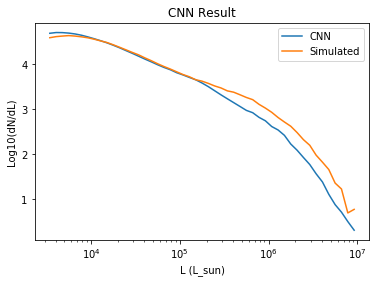

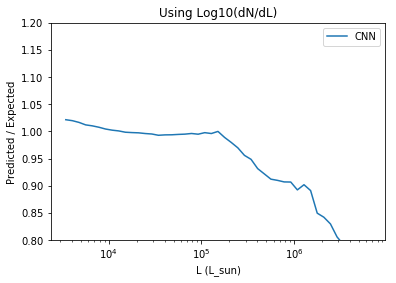

In [38]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_foreground_resnet_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11, add_foregrounds=True)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

2874 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13791_rotate_0_subfield_26__Li_-6.366e-02_1.401e+00_-1.733e+00_2.815e-01_3.063e-01 ----------------------------
Error and MSE for the given base_number:
[0.040847796946763992, 0.084724359214305878]


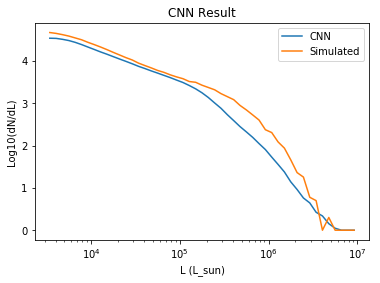

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/visualize.py:211: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/visualize.py:211: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


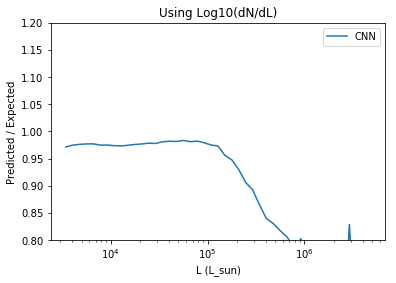

2678 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13651_rotate_0_subfield_35__Li_-1.621e-02_1.404e+00_-1.211e+00_3.016e-01_3.056e-01 ----------------------------
Error and MSE for the given base_number:
[0.067432314157485962, 0.14933775365352631]


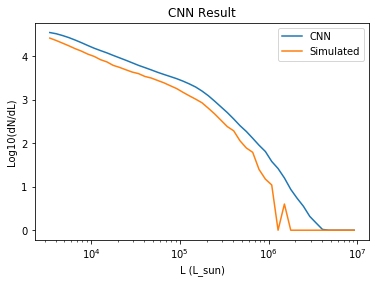

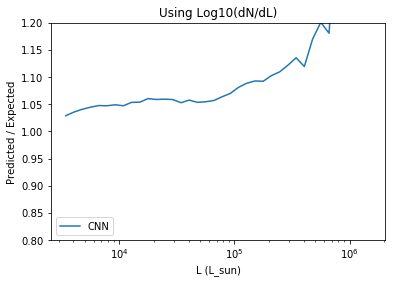

5200 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13727_rotate_0_subfield_23__Li_-1.025e-02_1.380e+00_-1.193e+00_2.956e-01_3.014e-01 ----------------------------
Error and MSE for the given base_number:
[0.016806568950414658, 0.035338319838047028]


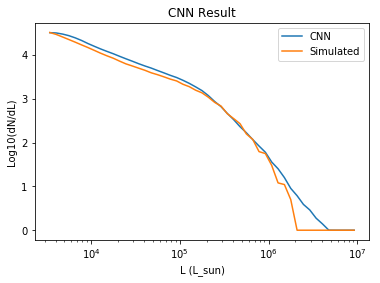

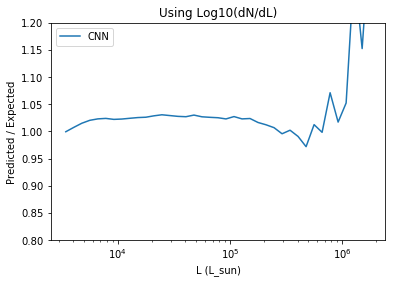

2520 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13715_rotate_0_subfield_22__Li_-5.799e-02_1.450e+00_-1.841e+00_3.101e-01_2.933e-01 ----------------------------
Error and MSE for the given base_number:
[0.023137735202908516, 0.049157299101352692]


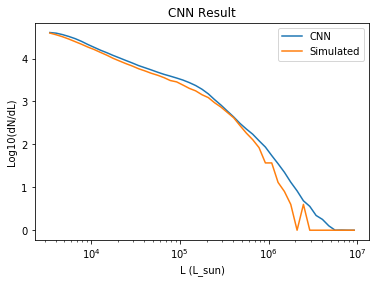

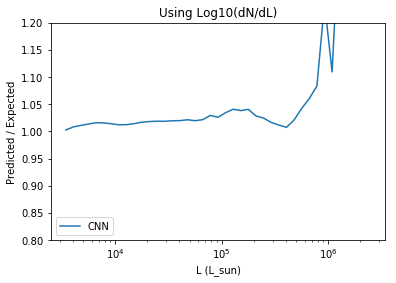

4837 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13825_rotate_0_subfield_30__Li_-5.071e-03_1.385e+00_-1.805e+00_3.010e-01_2.900e-01 ----------------------------
Error and MSE for the given base_number:
[0.013406817801296711, 0.027191096916794777]


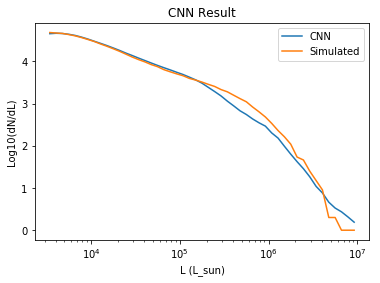

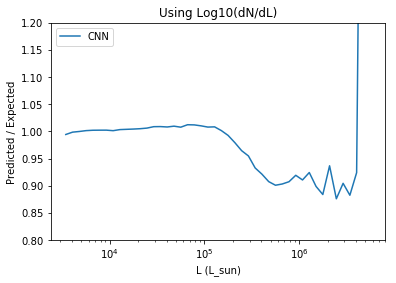

190 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13685_rotate_0_subfield_12__Li_-4.103e-03_1.359e+00_-2.077e+00_3.115e-01_2.998e-01 ----------------------------
Error and MSE for the given base_number:
[0.03619825467467308, 0.075032033026218414]


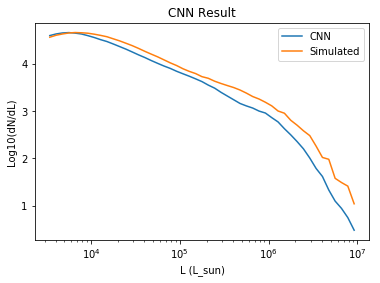

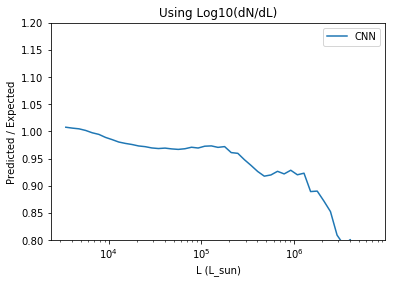

In [9]:
for numb in np.random.choice(range(len(random_small_Li_base)), 6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_foreground_resnet_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                           make_map_noisy=11, add_foregrounds=True)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

1877 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13737_rotate_0_subfield_24__Li_4.775e-03_1.369e+00_-1.950e+00_2.785e-01_3.086e-01 ----------------------------
Error and MSE for the given base_number:
[0.031857121735811234, 0.065454483032226562]


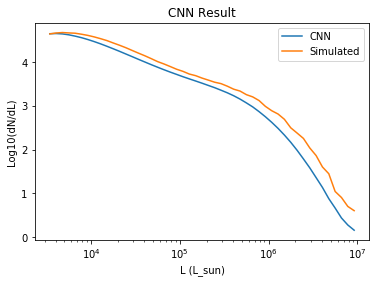

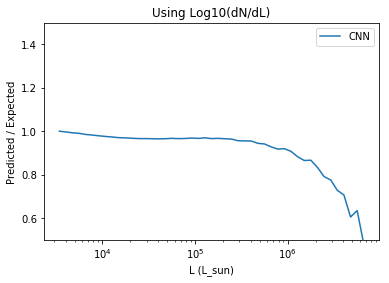

5694 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13883_rotate_0_subfield_32__Li_1.593e-02_1.344e+00_-2.028e+00_2.705e-01_3.014e-01 ----------------------------
Error and MSE for the given base_number:
[0.019413111731410027, 0.039575565606355667]


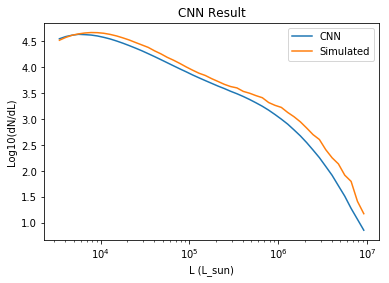

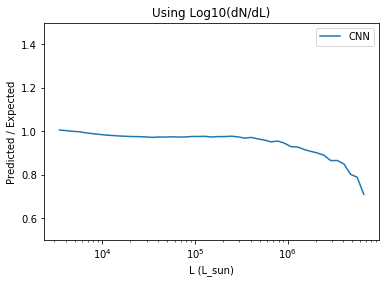

2604 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13857_rotate_0_subfield_6__Li_-4.325e-02_1.404e+00_-1.610e+00_2.813e-01_3.003e-01 ----------------------------
Error and MSE for the given base_number:
[0.053731177002191544, 0.11271053552627563]


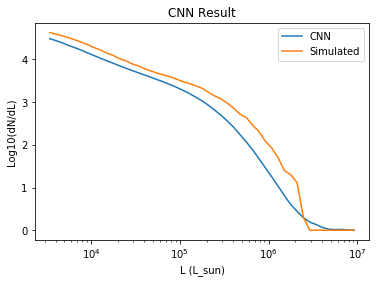

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:289: RuntimeWarning: divide by zero encountered in true_divide
  ratio = cnn_lum[0]/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:289: RuntimeWarning: invalid value encountered in true_divide
  ratio = cnn_lum[0]/cur_lum


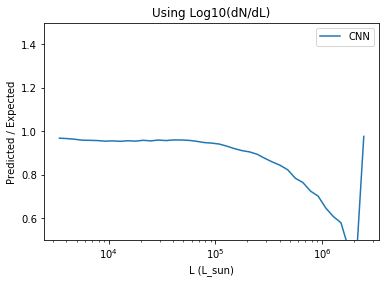

2973 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13803_rotate_0_subfield_12__Li_-3.623e-02_1.381e+00_-1.453e+00_2.938e-01_2.889e-01 ----------------------------
Error and MSE for the given base_number:
[0.079356223344802856, 0.1695820540189743]


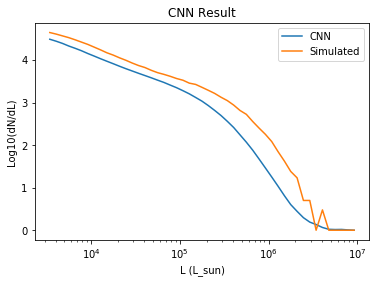

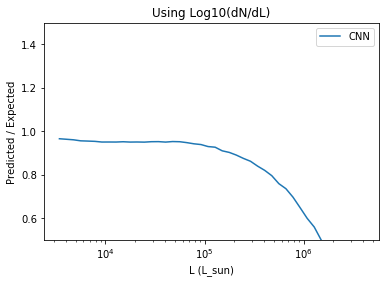

1308 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13835_rotate_0_subfield_30__Li_-1.974e-02_1.370e+00_-1.358e+00_2.996e-01_2.983e-01 ----------------------------
Error and MSE for the given base_number:
[0.087620660662651062, 0.18930310010910034]


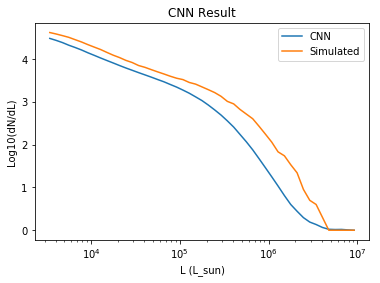

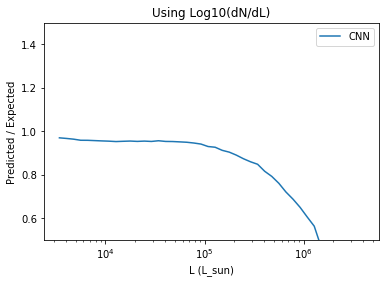

4848 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13679_rotate_0_subfield_16__Li_-1.564e-02_1.386e+00_-1.567e+00_3.028e-01_2.873e-01 ----------------------------
Error and MSE for the given base_number:
[0.090116657316684723, 0.19427034258842468]


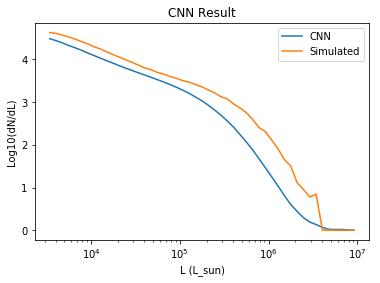

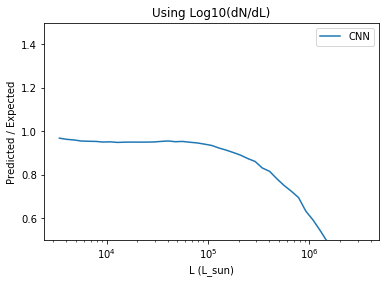

2339 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13847_rotate_0_subfield_12__Li_3.727e-02_1.342e+00_-1.381e+00_2.985e-01_2.964e-01 ----------------------------
Error and MSE for the given base_number:
[0.037192694842815399, 0.077589564025402069]


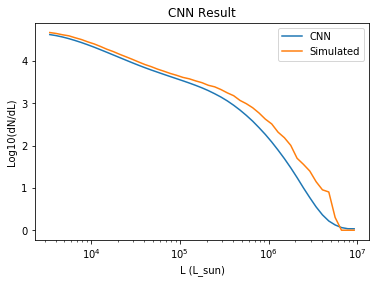

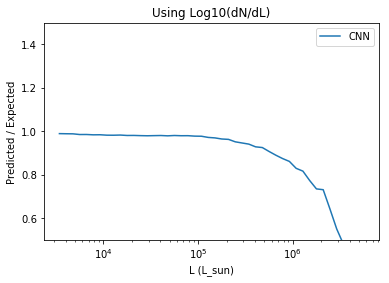

938 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13805_rotate_0_subfield_24__Li_3.779e-03_1.395e+00_-1.922e+00_3.091e-01_2.985e-01 ----------------------------
Error and MSE for the given base_number:
[0.072807110846042633, 0.15619604289531708]


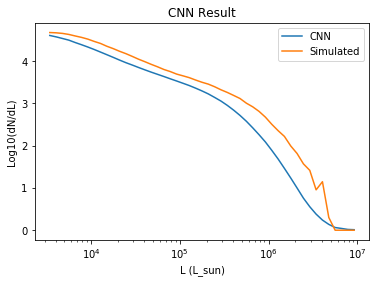

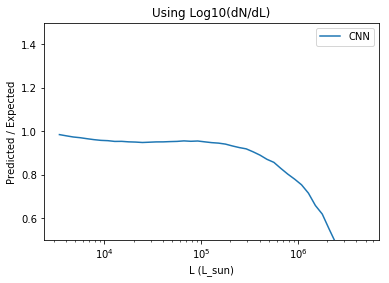

1318 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13849_rotate_0_subfield_12__Li_-1.575e-02_1.393e+00_-2.010e+00_3.116e-01_3.105e-01 ----------------------------
Error and MSE for the given base_number:
[0.028196875005960464, 0.058571461588144302]


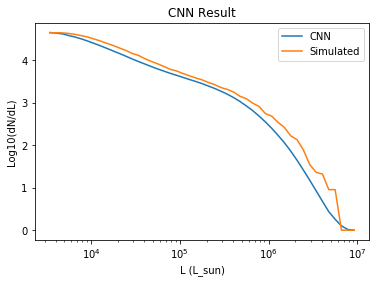

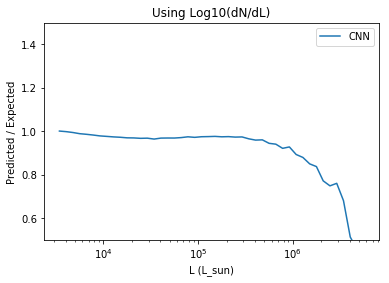

4383 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13871_rotate_0_subfield_21__Li_2.236e-02_1.369e+00_-2.056e+00_3.104e-01_3.083e-01 ----------------------------
Error and MSE for the given base_number:
[0.040393684059381485, 0.084572635591030121]


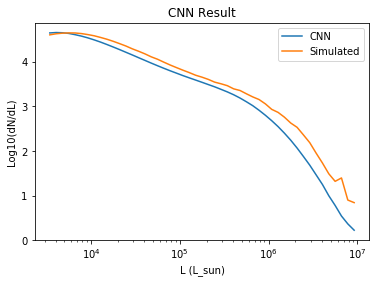

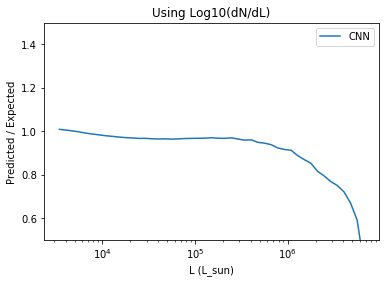

964 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13889_rotate_0_subfield_9__Li_2.872e-02_1.402e+00_-1.826e+00_2.992e-01_2.855e-01 ----------------------------
Error and MSE for the given base_number:
[0.099530667066574097, 0.21680666506290436]


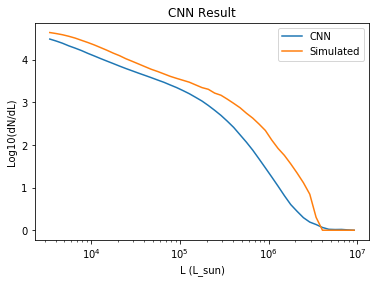

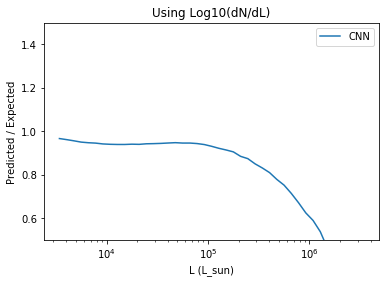

1583 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13893_rotate_0_subfield_20__Li_-1.658e-02_1.378e+00_-1.483e+00_2.803e-01_2.998e-01 ----------------------------
Error and MSE for the given base_number:
[0.089126110076904297, 0.19251136481761932]


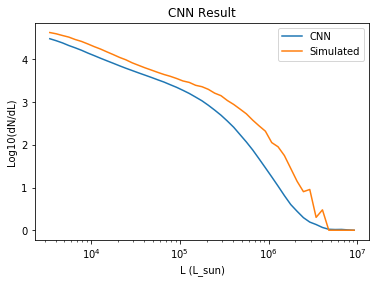

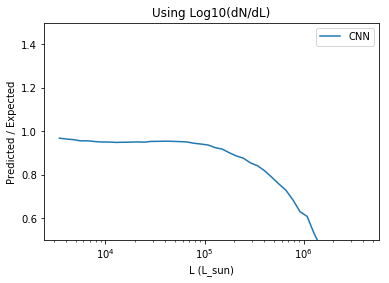

2062 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13675_rotate_0_subfield_3__Li_-2.320e-02_1.328e+00_-1.284e+00_2.891e-01_2.750e-01 ----------------------------
Error and MSE for the given base_number:
[0.051413904875516891, 0.1082453727722168]


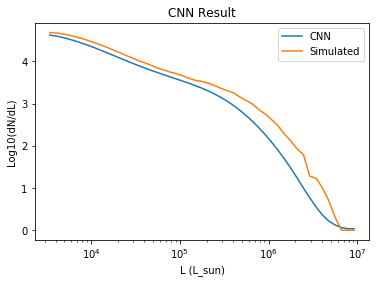

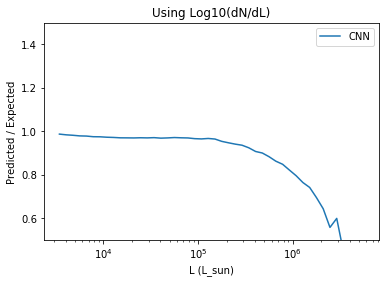

5667 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13613_rotate_0_subfield_16__Li_-1.430e-02_1.341e+00_-1.899e+00_2.923e-01_2.965e-01 ----------------------------
Error and MSE for the given base_number:
[0.037222195416688919, 0.077270776033401489]


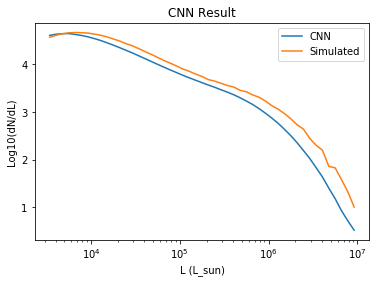

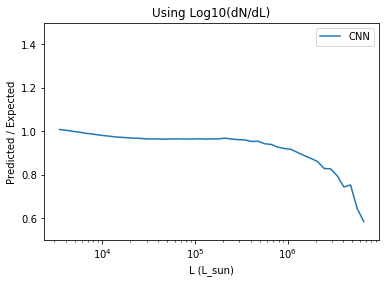

3133 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13583_rotate_0_subfield_7__Li_-3.505e-02_1.466e+00_-1.795e+00_2.982e-01_2.853e-01 ----------------------------
Error and MSE for the given base_number:
[15.785026550292969, 378.9554443359375]


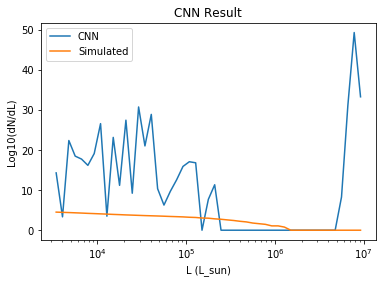

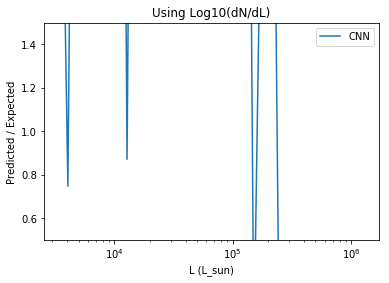

1847 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13735_rotate_0_subfield_24__Li_-2.513e-02_1.448e+00_-1.840e+00_2.826e-01_2.837e-01 ----------------------------
Error and MSE for the given base_number:
[0.3231547474861145, 0.79945075511932373]


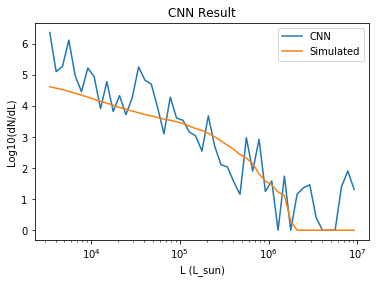

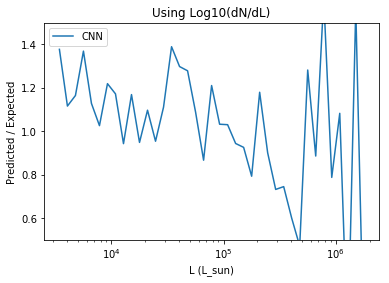

4275 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13893_rotate_0_subfield_33__Li_-2.576e-02_1.361e+00_-2.266e+00_3.076e-01_2.817e-01 ----------------------------
Error and MSE for the given base_number:
[0.022576708346605301, 0.045947939157485962]


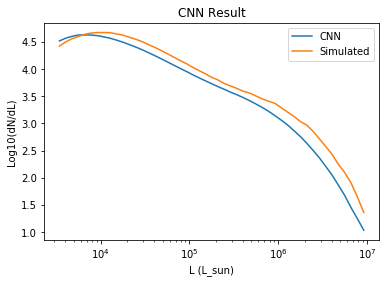

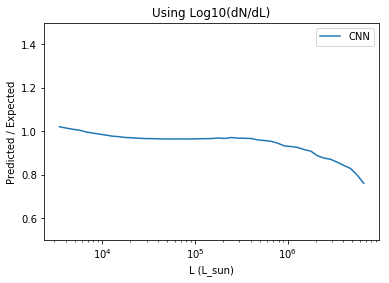

2871 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13795_rotate_0_subfield_8__Li_1.846e-02_1.378e+00_-1.217e+00_2.998e-01_3.020e-01 ----------------------------
Error and MSE for the given base_number:
[0.45078608393669128, 1.2041243314743042]


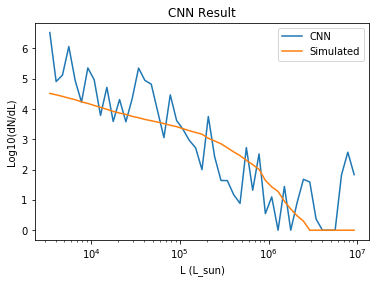

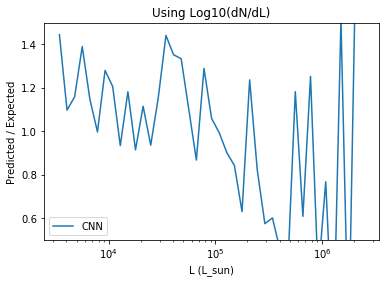

1484 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13595_rotate_0_subfield_10__Li_1.846e-02_1.383e+00_-1.585e+00_3.126e-01_3.056e-01 ----------------------------
Error and MSE for the given base_number:
[0.10799688100814819, 0.23791617155075073]


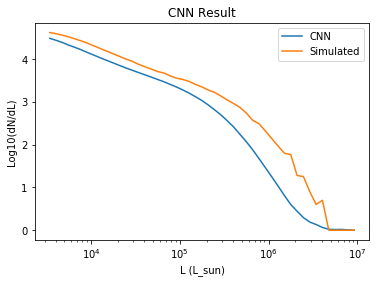

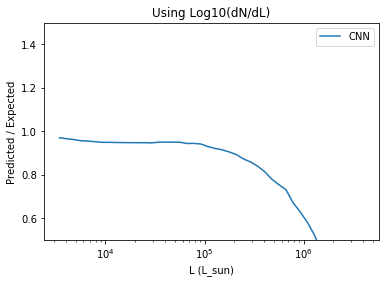

1442 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13823_rotate_0_subfield_23__Li_-2.733e-02_1.392e+00_-1.223e+00_2.969e-01_3.095e-01 ----------------------------
Error and MSE for the given base_number:
[0.012527431361377239, 0.025480339303612709]


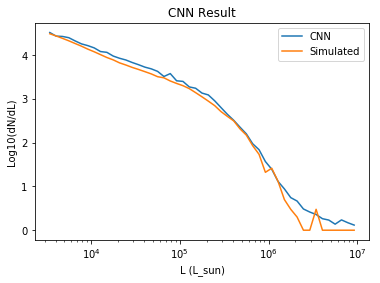

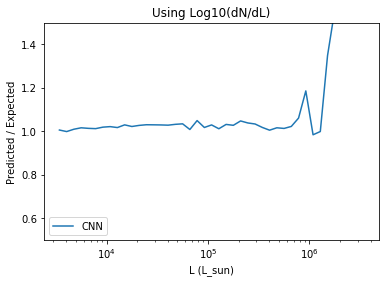

2302 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13739_rotate_0_subfield_25__Li_-4.218e-04_1.354e+00_-2.168e+00_2.822e-01_2.916e-01 ----------------------------
Error and MSE for the given base_number:
[0.018160555511713028, 0.036846958100795746]


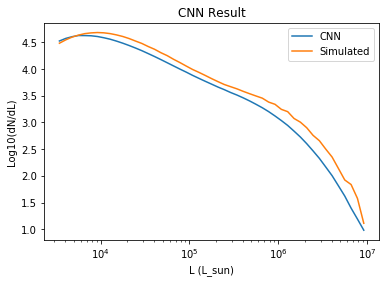

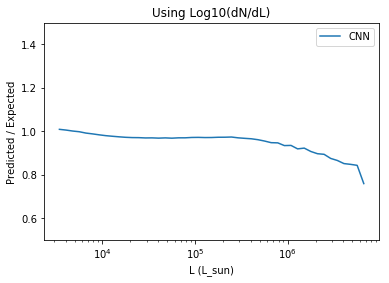

4823 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13855_rotate_0_subfield_22__Li_2.563e-02_1.394e+00_-1.469e+00_2.864e-01_2.960e-01 ----------------------------
Error and MSE for the given base_number:
[0.091763556003570557, 0.19581495225429535]


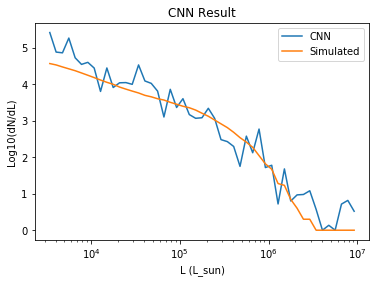

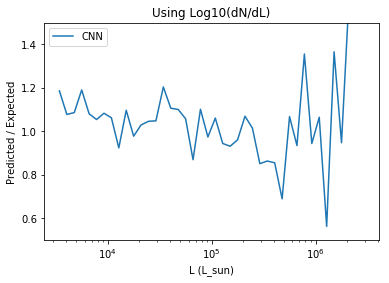

1723 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13749_rotate_0_subfield_6__Li_6.018e-03_1.354e+00_-1.322e+00_2.938e-01_3.088e-01 ----------------------------
Error and MSE for the given base_number:
[0.12359708547592163, 0.27721542119979858]


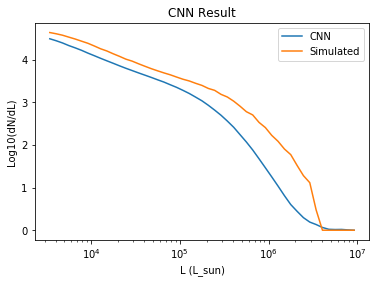

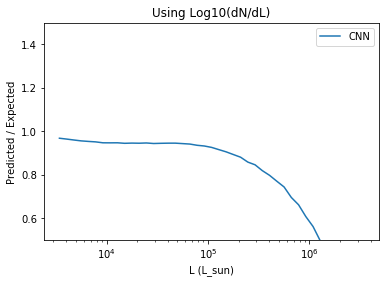

1070 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13869_rotate_0_subfield_33__Li_4.420e-02_1.355e+00_-1.928e+00_2.798e-01_2.996e-01 ----------------------------
Error and MSE for the given base_number:
[0.034430697560310364, 0.071086019277572632]


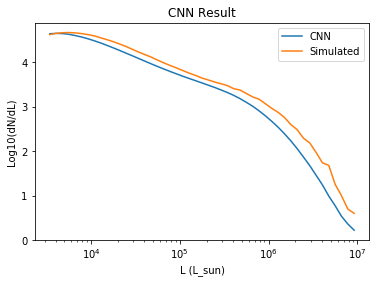

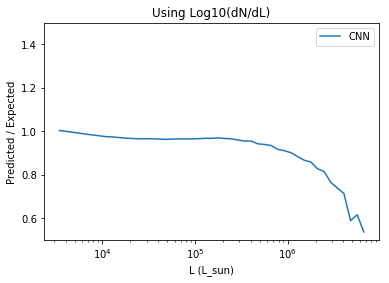

2019 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13619_rotate_0_subfield_15__Li_1.128e-02_1.418e+00_-2.066e+00_2.936e-01_2.877e-01 ----------------------------
Error and MSE for the given base_number:
[0.16714063286781311, 0.37875661253929138]


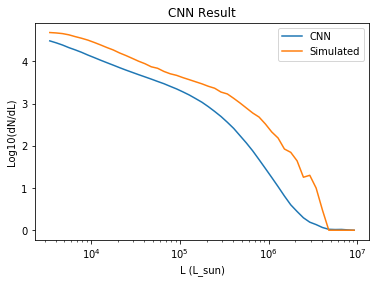

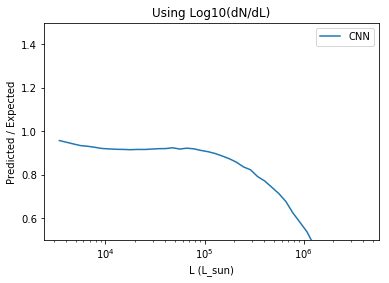

5259 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13829_rotate_0_subfield_20__Li_-1.921e-02_1.311e+00_-1.986e+00_2.766e-01_2.886e-01 ----------------------------
Error and MSE for the given base_number:
[0.0067859911359846592, 0.013646599836647511]


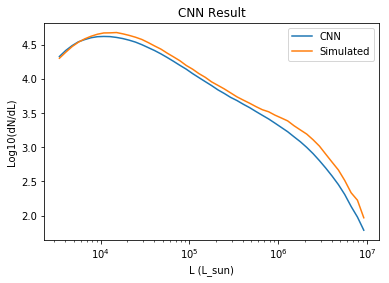

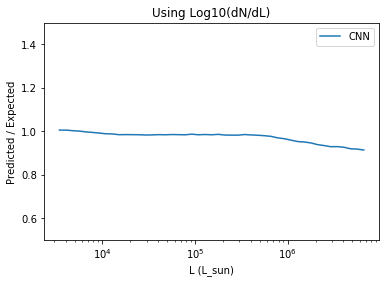

2003 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13787_rotate_0_subfield_14__Li_-1.036e-02_1.331e+00_-1.585e+00_2.863e-01_3.010e-01 ----------------------------
Error and MSE for the given base_number:
[0.033562548458576202, 0.069631345570087433]


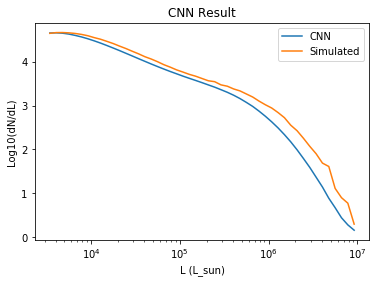

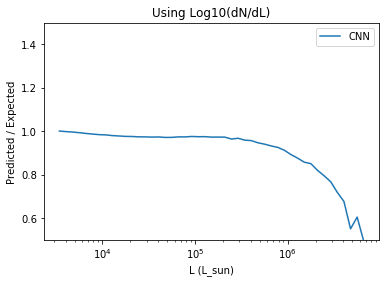

2470 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13745_rotate_0_subfield_11__Li_-2.444e-02_1.403e+00_-1.710e+00_3.020e-01_3.090e-01 ----------------------------
Error and MSE for the given base_number:
[0.099833041429519653, 0.21700111031532288]


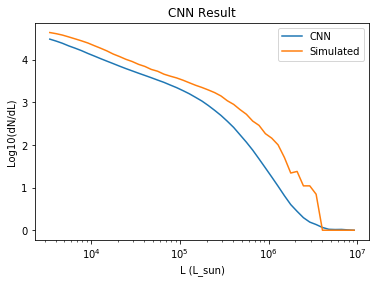

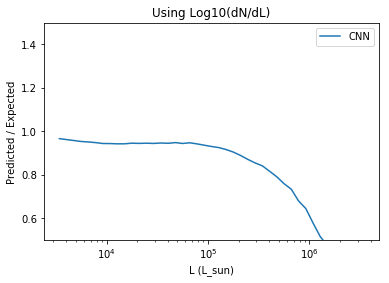

2228 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13673_rotate_0_subfield_3__Li_-4.592e-03_1.356e+00_-1.929e+00_2.973e-01_2.951e-01 ----------------------------
Error and MSE for the given base_number:
[0.019192749634385109, 0.039257112890481949]


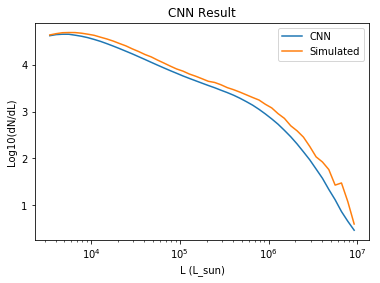

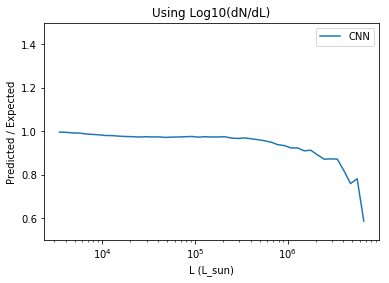

4041 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13825_rotate_0_subfield_13__Li_-2.262e-02_1.430e+00_-1.821e+00_2.915e-01_3.051e-01 ----------------------------
Error and MSE for the given base_number:
[1.0819622278213501, 3.9122498035430908]


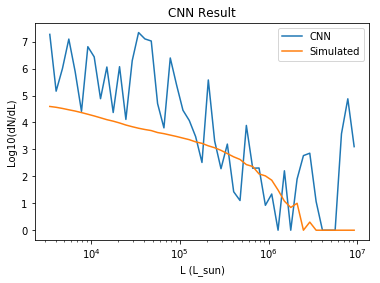

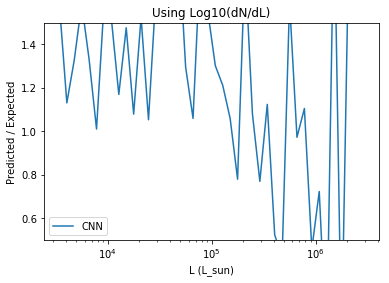

4838 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13625_rotate_0_subfield_28__Li_-2.284e-02_1.402e+00_-1.409e+00_2.915e-01_2.969e-01 ----------------------------
Error and MSE for the given base_number:
[0.0094959661364555359, 0.019167214632034302]


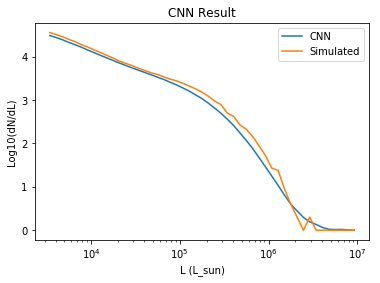

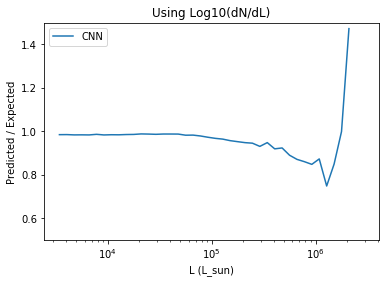

5362 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13831_rotate_0_subfield_1__Li_-2.811e-02_1.348e+00_-1.802e+00_3.006e-01_2.993e-01 ----------------------------
Error and MSE for the given base_number:
[0.027500560507178307, 0.056553632020950317]


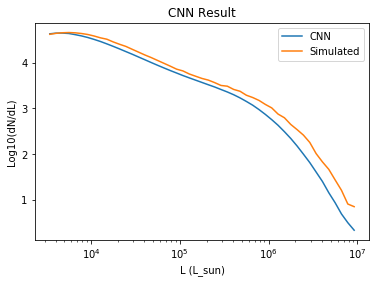

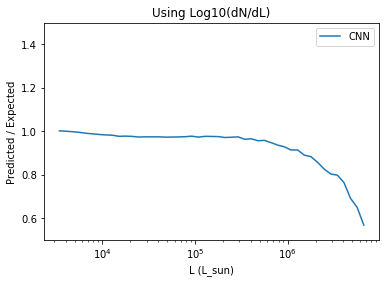

636 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13771_rotate_0_subfield_22__Li_-3.057e-02_1.378e+00_-1.866e+00_3.271e-01_2.958e-01 ----------------------------
Error and MSE for the given base_number:
[0.067074500024318695, 0.14334879815578461]


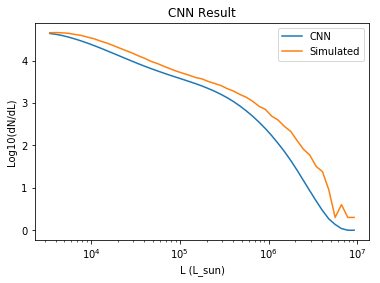

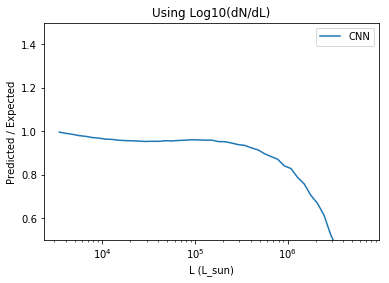

602 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13739_rotate_0_subfield_6__Li_1.328e-02_1.342e+00_-1.501e+00_2.961e-01_2.991e-01 ----------------------------
Error and MSE for the given base_number:
[101.11080169677734, 16327.89453125]


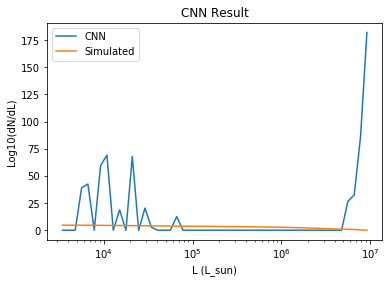

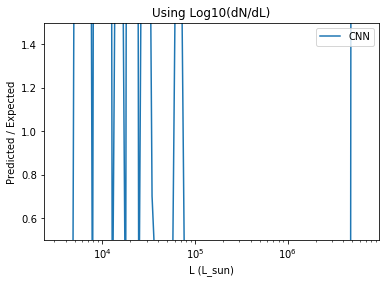

4166 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13579_rotate_0_subfield_25__Li_3.128e-02_1.412e+00_-1.674e+00_3.000e-01_2.784e-01 ----------------------------
Error and MSE for the given base_number:
[0.031246326863765717, 0.064037919044494629]


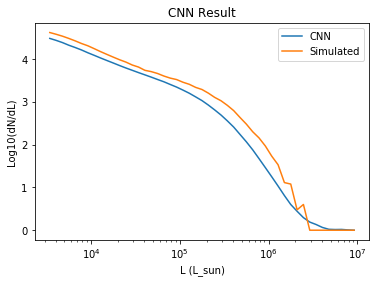

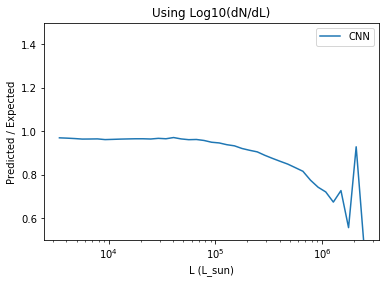

3695 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13695_rotate_0_subfield_4__Li_-1.600e-02_1.284e+00_-1.595e+00_2.931e-01_3.039e-01 ----------------------------
Error and MSE for the given base_number:
[0.018743187189102173, 0.038421150296926498]


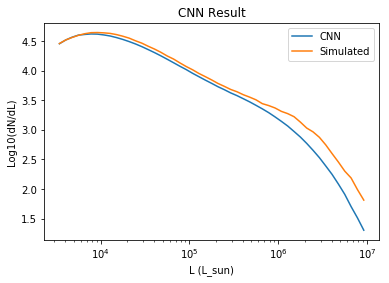

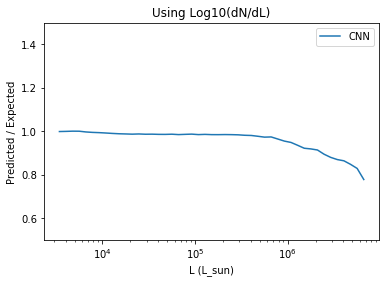

5360 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13841_rotate_0_subfield_10__Li_3.522e-02_1.387e+00_-1.285e+00_2.935e-01_3.205e-01 ----------------------------
Error and MSE for the given base_number:
[2.5437440872192383, 14.323929786682129]


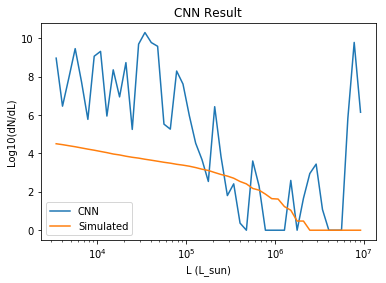

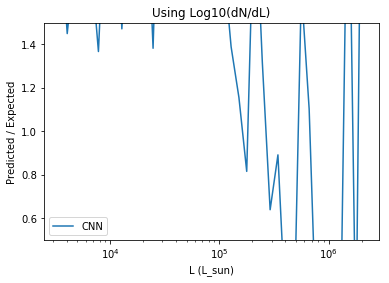

1501 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13863_rotate_0_subfield_11__Li_1.034e-02_1.409e+00_-2.786e+00_2.949e-01_3.006e-01 ----------------------------
Error and MSE for the given base_number:
[0.015295903198421001, 0.030880380421876907]


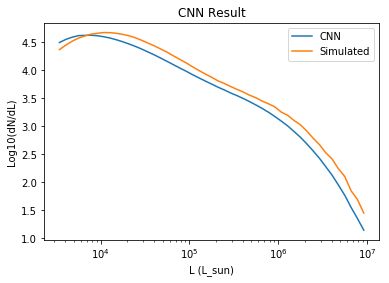

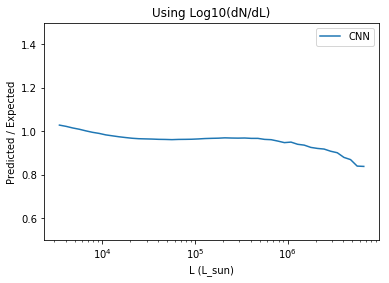

23 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13605_rotate_0_subfield_26__Li_-1.777e-02_1.404e+00_-1.985e+00_2.859e-01_3.071e-01 ----------------------------
Error and MSE for the given base_number:
[0.046180322766304016, 0.096098050475120544]


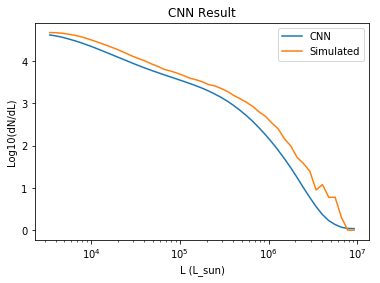

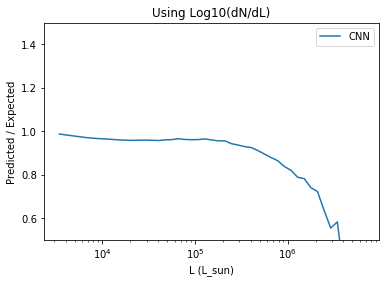

2016 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13637_rotate_0_subfield_10__Li_3.595e-02_1.296e+00_-1.106e+00_2.977e-01_3.025e-01 ----------------------------
Error and MSE for the given base_number:
[0.027833417057991028, 0.057444307953119278]


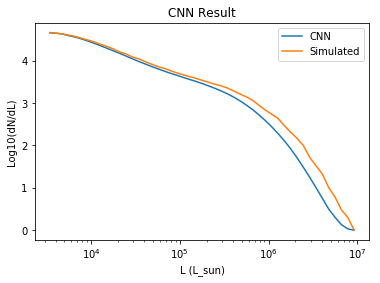

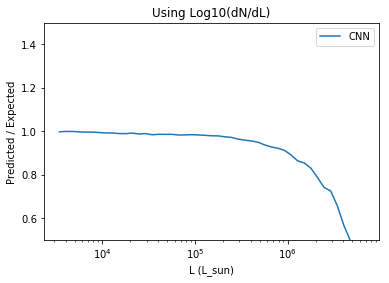

3438 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13799_rotate_0_subfield_13__Li_-3.251e-02_1.371e+00_-1.734e+00_2.901e-01_2.977e-01 ----------------------------
Error and MSE for the given base_number:
[0.027339044958353043, 0.056389931589365005]


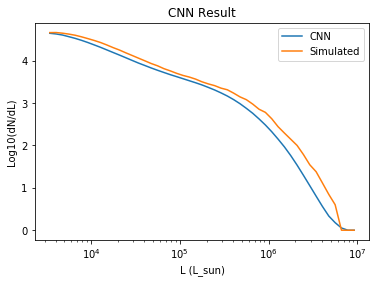

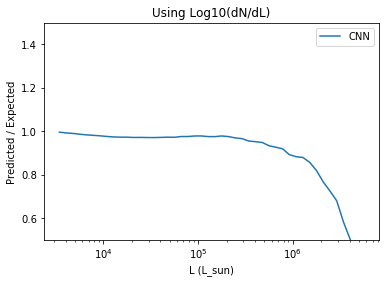

3605 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13725_rotate_0_subfield_2__Li_5.704e-02_1.382e+00_-1.755e+00_3.005e-01_3.103e-01 ----------------------------
Error and MSE for the given base_number:
[0.18097585439682007, 0.41724702715873718]


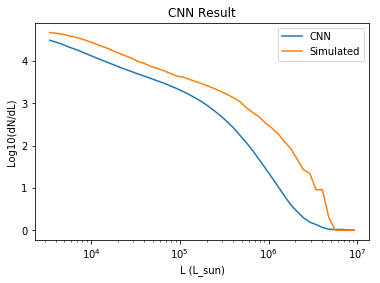

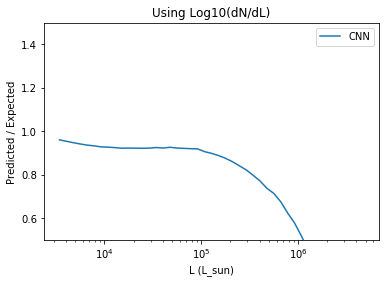

1128 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13621_rotate_0_subfield_3__Li_1.957e-02_1.308e+00_-1.538e+00_3.081e-01_3.040e-01 ----------------------------
Error and MSE for the given base_number:
[0.025344055145978928, 0.052457910031080246]


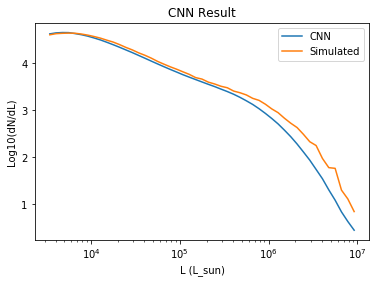

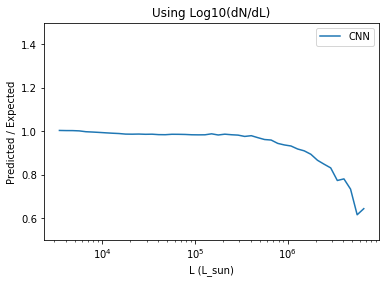

2645 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13751_rotate_0_subfield_15__Li_-1.824e-02_1.386e+00_-2.317e+00_3.011e-01_3.069e-01 ----------------------------
Error and MSE for the given base_number:
[0.025516059249639511, 0.052065514028072357]


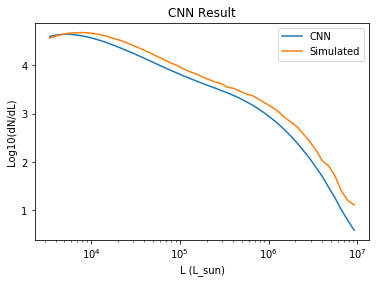

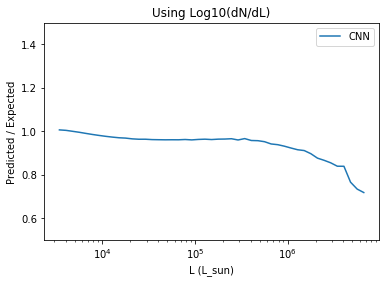

3984 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13779_rotate_0_subfield_10__Li_2.014e-02_1.406e+00_-1.928e+00_3.087e-01_2.897e-01 ----------------------------
Error and MSE for the given base_number:
[0.15325868129730225, 0.34438401460647583]


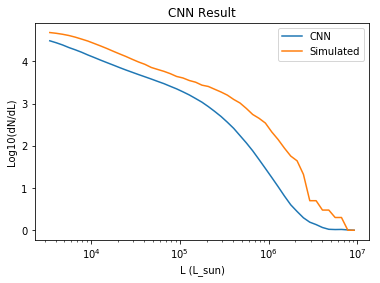

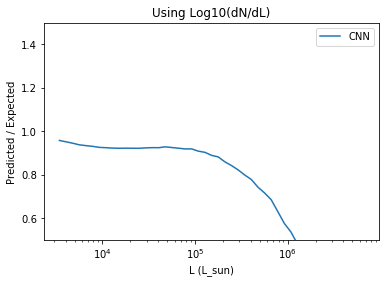

5405 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13683_rotate_0_subfield_0__Li_-8.770e-03_1.394e+00_-1.708e+00_2.925e-01_3.011e-01 ----------------------------
Error and MSE for the given base_number:
[0.10614874213933945, 0.23292757570743561]


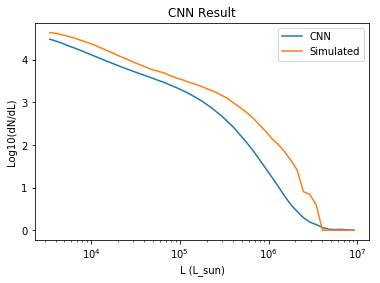

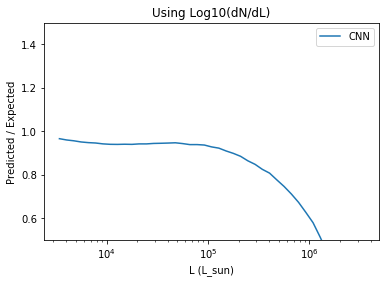

3788 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13637_rotate_0_subfield_31__Li_-4.586e-03_1.406e+00_-1.443e+00_2.902e-01_3.015e-01 ----------------------------
Error and MSE for the given base_number:
[2.4313716888427734, 13.362053871154785]


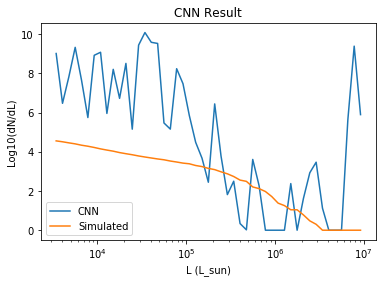

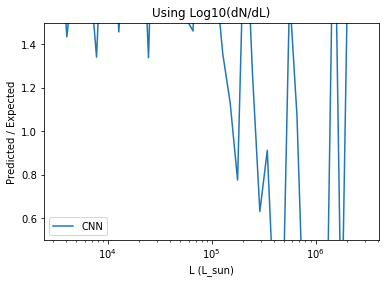

2283 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13633_rotate_0_subfield_25__Li_3.123e-02_1.411e+00_-1.490e+00_2.954e-01_2.800e-01 ----------------------------
Error and MSE for the given base_number:
[0.0040882937610149384, 0.0082544200122356415]


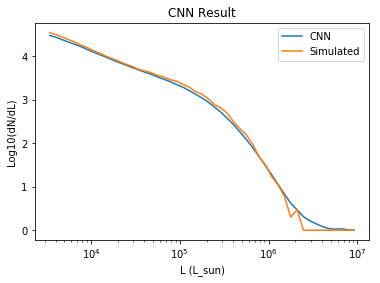

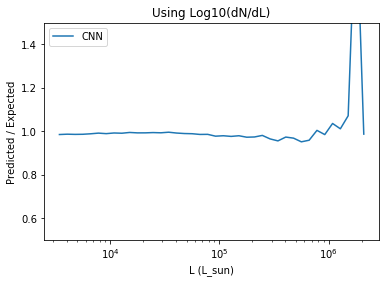

1364 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13737_rotate_0_subfield_28__Li_-4.579e-02_1.323e+00_-1.884e+00_2.938e-01_3.135e-01 ----------------------------
Error and MSE for the given base_number:
[0.032878778874874115, 0.068017221987247467]


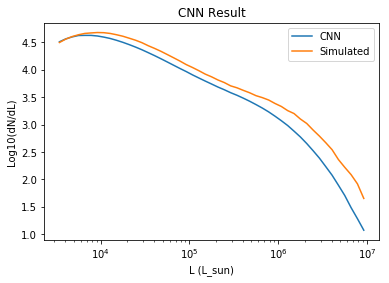

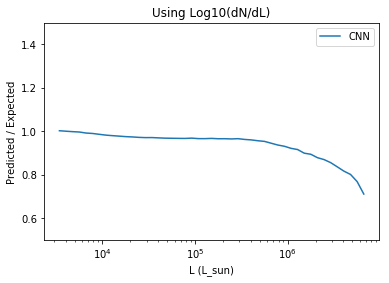

3532 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13707_rotate_0_subfield_1__Li_-7.704e-03_1.316e+00_-2.028e+00_2.986e-01_2.826e-01 ----------------------------
Error and MSE for the given base_number:
[0.020632384344935417, 0.042113859206438065]


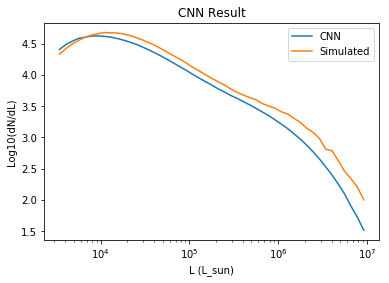

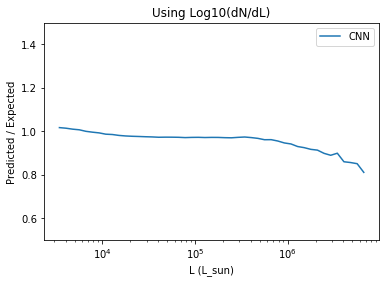

2217 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13813_rotate_0_subfield_29__Li_1.929e-02_1.377e+00_-1.294e+00_2.894e-01_2.964e-01 ----------------------------
Error and MSE for the given base_number:
[0.018673194572329521, 0.038138814270496368]


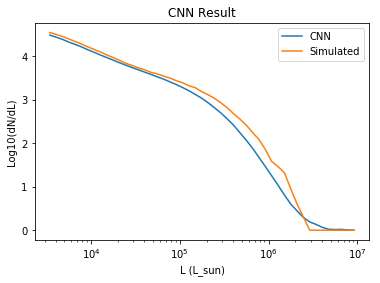

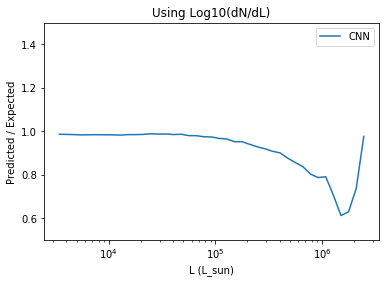

2465 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13617_rotate_0_subfield_6__Li_4.736e-02_1.295e+00_-1.954e+00_2.985e-01_3.043e-01 ----------------------------
Error and MSE for the given base_number:
[0.017839055508375168, 0.036402627825737]


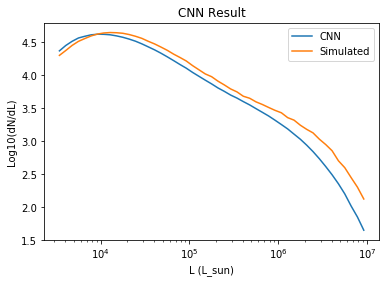

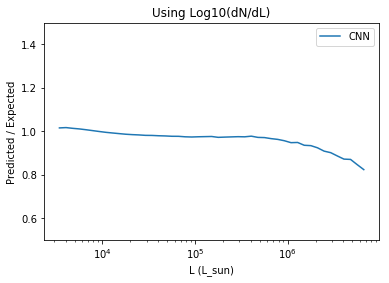

5240 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13787_rotate_0_subfield_4__Li_1.482e-02_1.352e+00_-2.215e+00_2.884e-01_3.012e-01 ----------------------------
Error and MSE for the given base_number:
[0.015518990345299244, 0.031521283090114594]


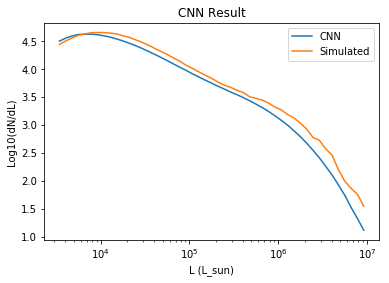

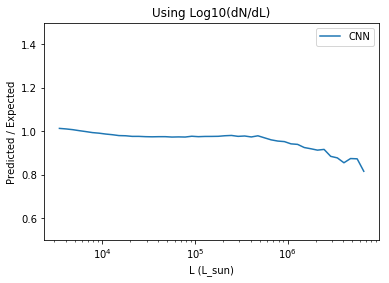

1183 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13635_rotate_0_subfield_22__Li_-1.421e-02_1.307e+00_-1.825e+00_2.977e-01_3.021e-01 ----------------------------
Error and MSE for the given base_number:
[0.026674319058656693, 0.05506332591176033]


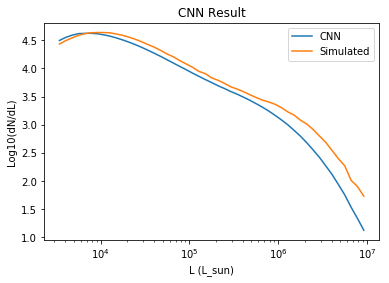

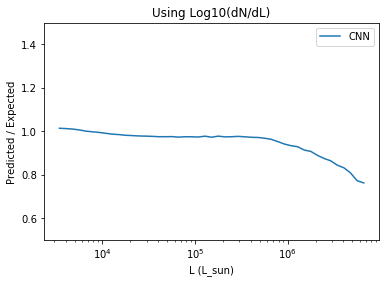

4813 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13831_rotate_0_subfield_29__Li_-2.448e-02_1.418e+00_-1.761e+00_3.038e-01_3.083e-01 ----------------------------
Error and MSE for the given base_number:
[0.052206609398126602, 0.10992123931646347]


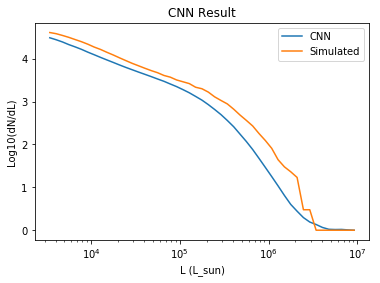

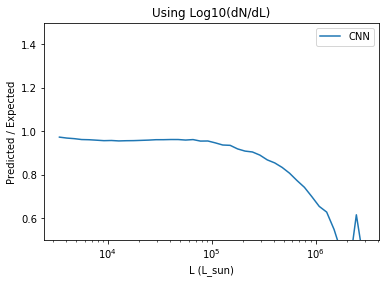

3806 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13629_rotate_0_subfield_23__Li_2.104e-03_1.352e+00_-2.388e+00_2.896e-01_2.841e-01 ----------------------------
Error and MSE for the given base_number:
[0.0098470216616988182, 0.019811421632766724]


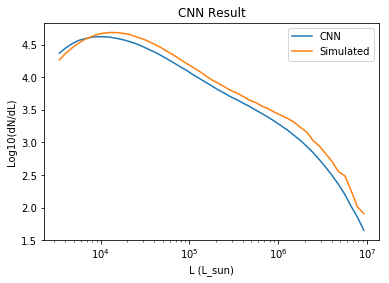

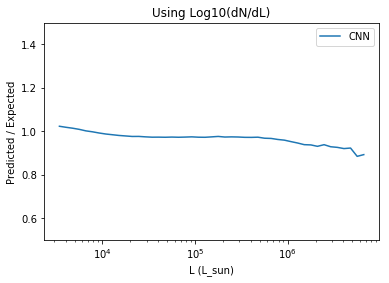

2712 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13651_rotate_0_subfield_8__Li_1.759e-02_1.334e+00_-1.791e+00_2.924e-01_2.979e-01 ----------------------------
Error and MSE for the given base_number:
[0.024976238608360291, 0.05125432088971138]


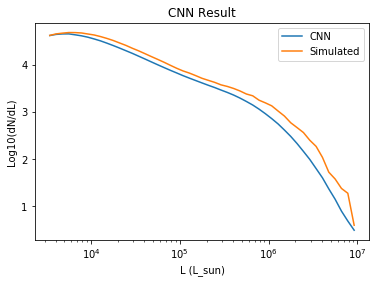

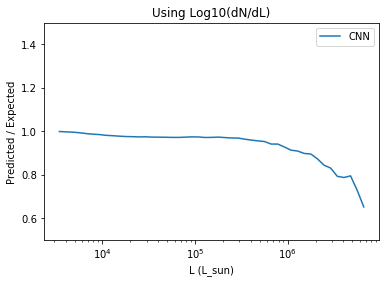

4779 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13753_rotate_0_subfield_12__Li_2.114e-02_1.363e+00_-1.637e+00_2.966e-01_2.891e-01 ----------------------------
Error and MSE for the given base_number:
[0.045388512313365936, 0.09483085572719574]


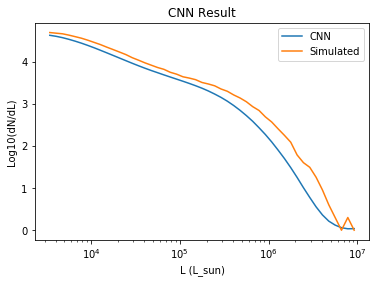

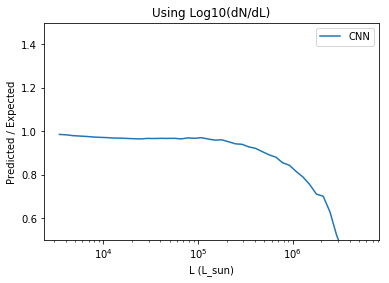

1210 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13607_rotate_0_subfield_27__Li_-5.134e-02_1.411e+00_-1.655e+00_3.033e-01_3.065e-01 ----------------------------
Error and MSE for the given base_number:
[0.046380266547203064, 0.096697337925434113]


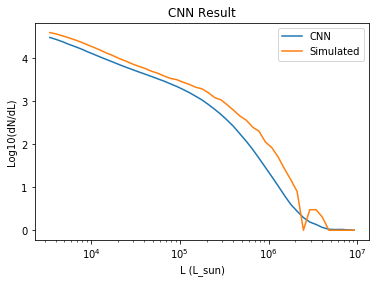

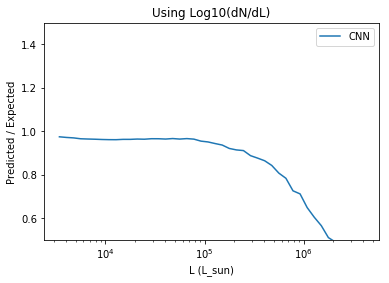

4205 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13689_rotate_0_subfield_29__Li_-1.357e-02_1.359e+00_-1.587e+00_2.938e-01_3.060e-01 ----------------------------
Error and MSE for the given base_number:
[0.029608020558953285, 0.06113627552986145]


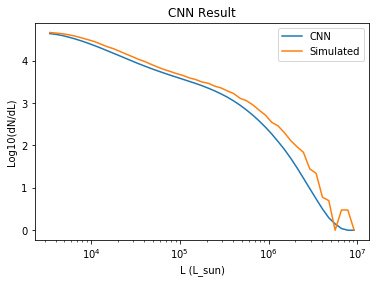

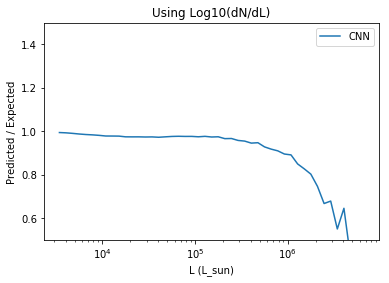

4927 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13849_rotate_0_subfield_0__Li_-1.662e-02_1.356e+00_-1.799e+00_2.964e-01_3.019e-01 ----------------------------
Error and MSE for the given base_number:
[0.028814718127250671, 0.059358041733503342]


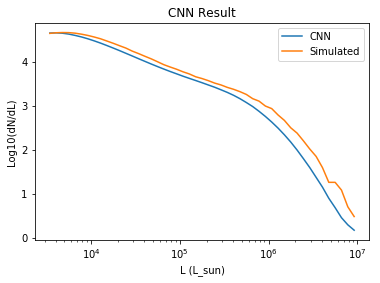

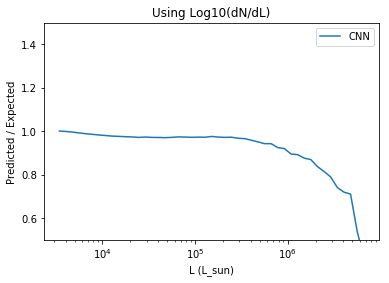

160 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13821_rotate_0_subfield_30__Li_-8.772e-03_1.355e+00_-1.590e+00_3.154e-01_2.981e-01 ----------------------------
Error and MSE for the given base_number:
[0.061402611434459686, 0.13094387948513031]


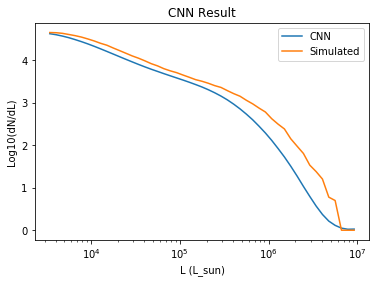

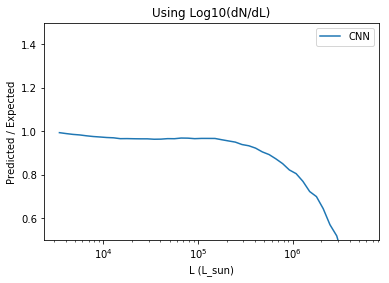

1328 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13883_rotate_0_subfield_35__Li_4.825e-02_1.381e+00_-7.203e-01_2.859e-01_3.072e-01 ----------------------------
Error and MSE for the given base_number:
[25.727903366088867, 1055.5894775390625]


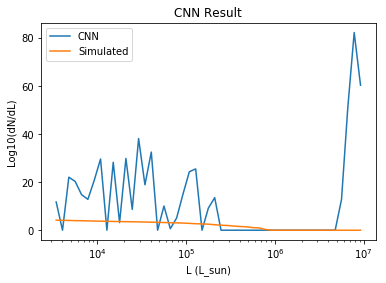

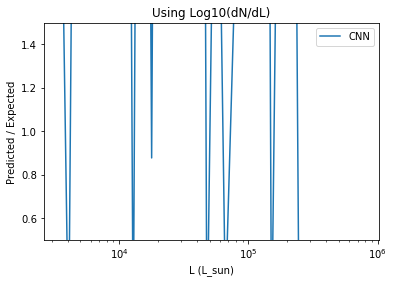

4300 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13757_rotate_0_subfield_6__Li_-3.086e-02_1.369e+00_-2.446e+00_3.080e-01_2.965e-01 ----------------------------
Error and MSE for the given base_number:
[0.013744314201176167, 0.027833085507154465]


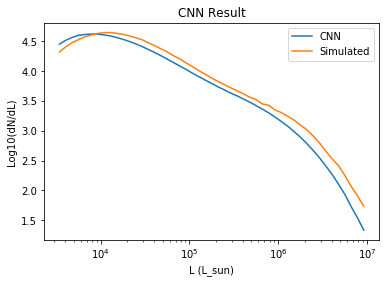

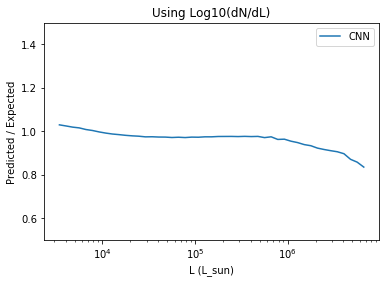

5158 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13729_rotate_0_subfield_5__Li_-9.574e-03_1.345e+00_-1.646e+00_2.895e-01_2.987e-01 ----------------------------
Error and MSE for the given base_number:
[0.026529533788561821, 0.054794609546661377]


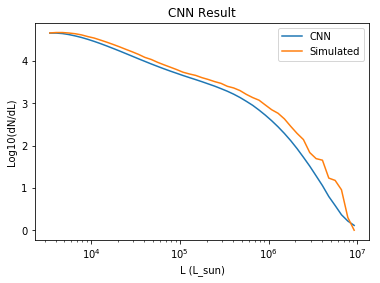

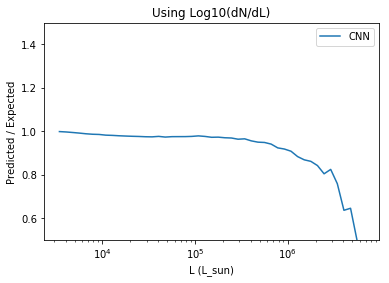

1293 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13865_rotate_0_subfield_20__Li_2.398e-02_1.397e+00_-2.088e+00_2.982e-01_2.989e-01 ----------------------------
Error and MSE for the given base_number:
[0.024280767887830734, 0.049618545919656754]


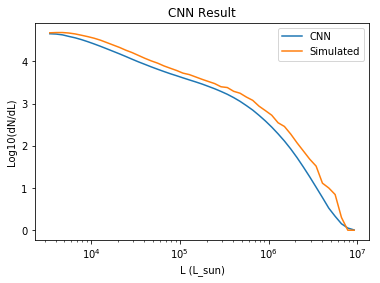

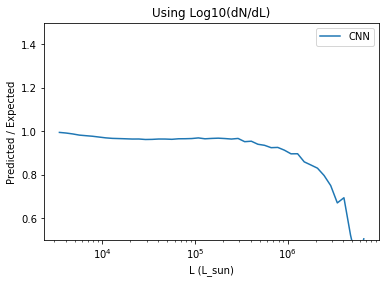

5748 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13899_rotate_0_subfield_12__Li_-9.755e-02_1.390e+00_-2.182e+00_3.062e-01_2.869e-01 ----------------------------
Error and MSE for the given base_number:
[0.028714744374155998, 0.058813571929931641]


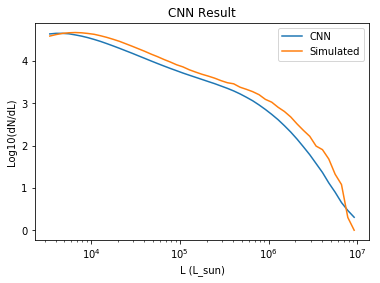

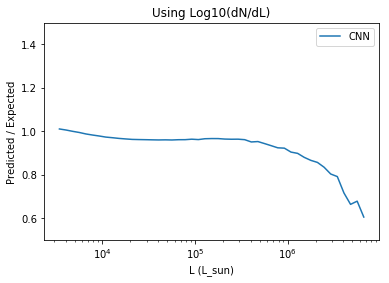

488 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13659_rotate_0_subfield_14__Li_2.985e-02_1.361e+00_-1.642e+00_3.073e-01_2.977e-01 ----------------------------
Error and MSE for the given base_number:
[0.10626918077468872, 0.233295738697052]


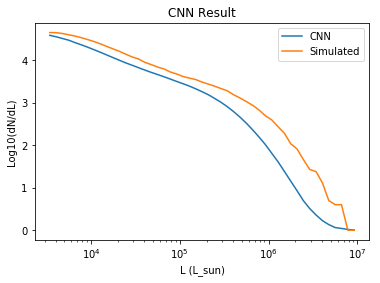

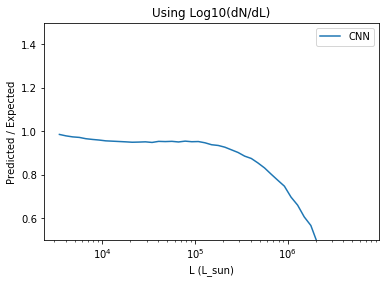

3693 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13751_rotate_0_subfield_4__Li_-2.770e-02_1.400e+00_-2.637e+00_3.063e-01_2.797e-01 ----------------------------
Error and MSE for the given base_number:
[0.020764706656336784, 0.042028710246086121]


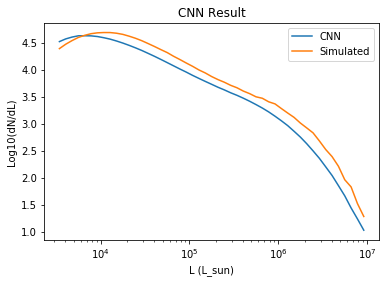

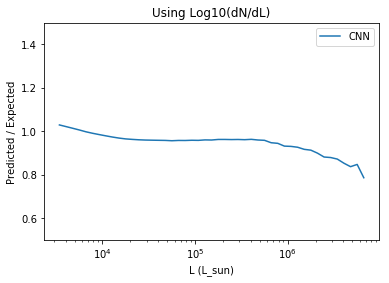

2325 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13859_rotate_0_subfield_24__Li_-5.108e-02_1.347e+00_-1.358e+00_3.098e-01_2.957e-01 ----------------------------
Error and MSE for the given base_number:
[0.08779926598072052, 0.19157430529594421]


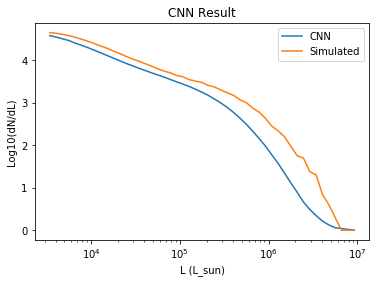

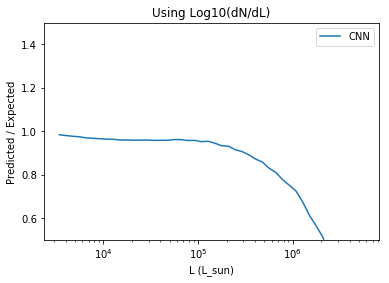

3662 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13801_rotate_0_subfield_10__Li_1.246e-02_1.345e+00_-1.639e+00_3.064e-01_3.116e-01 ----------------------------
Error and MSE for the given base_number:
[0.052149135619401932, 0.11126213520765305]


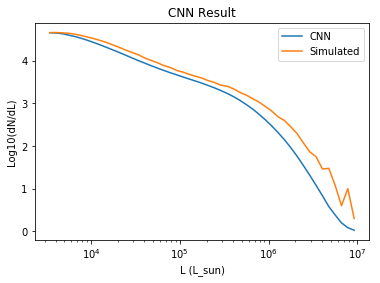

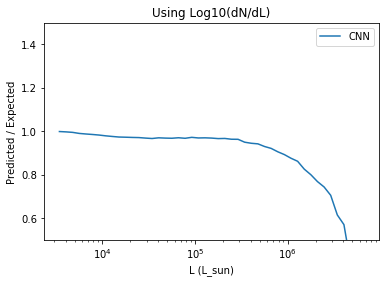

3163 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13651_rotate_0_subfield_33__Li_-1.170e-02_1.416e+00_-1.890e+00_2.867e-01_2.968e-01 ----------------------------
Error and MSE for the given base_number:
[0.09442158043384552, 0.20394212007522583]


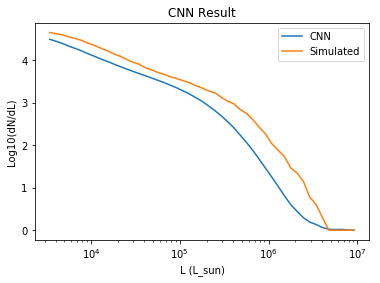

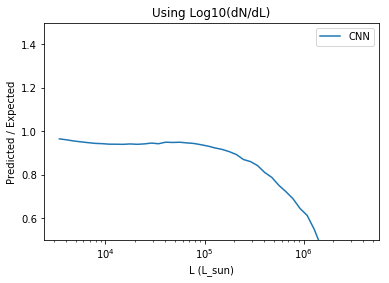

350 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13763_rotate_0_subfield_20__Li_1.730e-02_1.298e+00_-1.292e+00_3.054e-01_3.113e-01 ----------------------------
Error and MSE for the given base_number:
[0.060428444296121597, 0.12910090386867523]


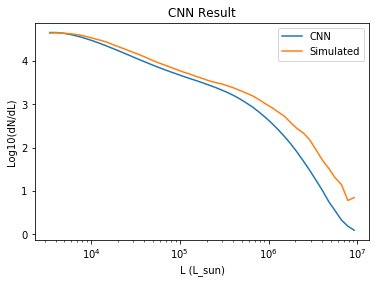

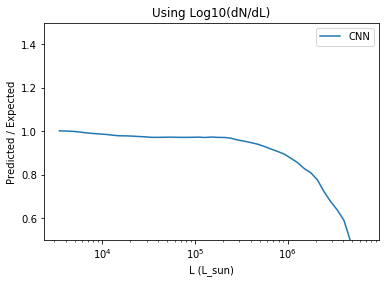

5185 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13605_rotate_0_subfield_17__Li_6.629e-04_1.375e+00_-2.055e+00_3.022e-01_3.017e-01 ----------------------------
Error and MSE for the given base_number:
[0.028149375692009926, 0.057951800525188446]


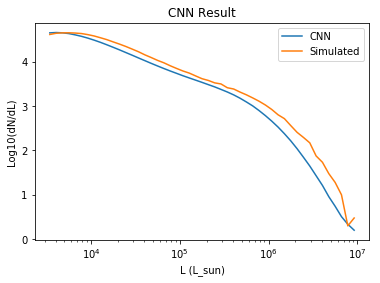

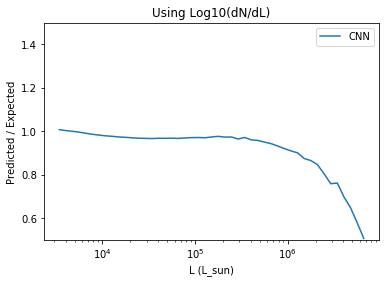

3091 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13671_rotate_0_subfield_27__Li_-7.746e-04_1.329e+00_-2.065e+00_2.898e-01_3.080e-01 ----------------------------
Error and MSE for the given base_number:
[0.016220182180404663, 0.032986614853143692]


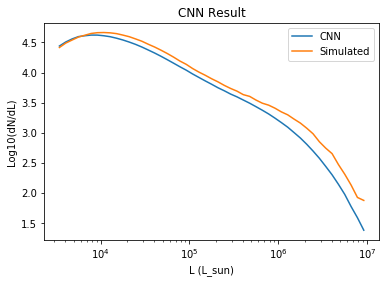

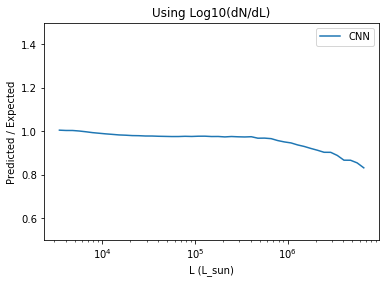

1359 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13831_rotate_0_subfield_21__Li_5.075e-02_1.427e+00_-9.963e-01_3.003e-01_2.992e-01 ----------------------------
Error and MSE for the given base_number:
[25.329059600830078, 1030.9461669921875]


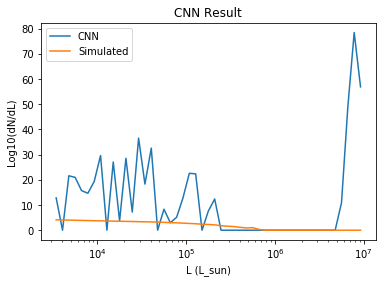

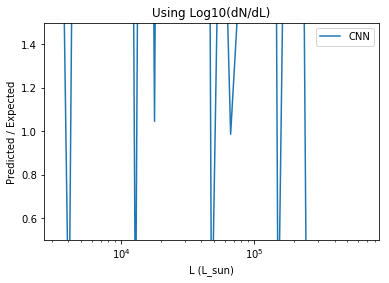

3844 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13827_rotate_0_subfield_8__Li_-7.844e-03_1.367e+00_-1.292e+00_3.041e-01_2.811e-01 ----------------------------
Error and MSE for the given base_number:
[0.04238910973072052, 0.08824535459280014]


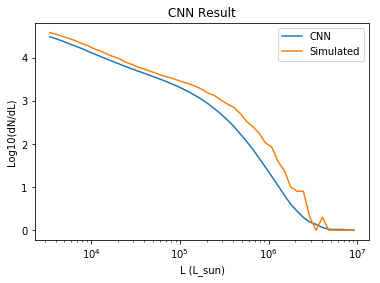

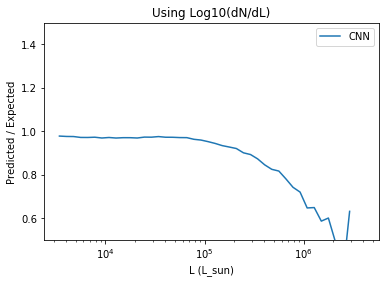

2964 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13645_rotate_0_subfield_12__Li_1.105e-02_1.382e+00_-1.645e+00_3.014e-01_3.023e-01 ----------------------------
Error and MSE for the given base_number:
[0.1322476863861084, 0.29568293690681458]


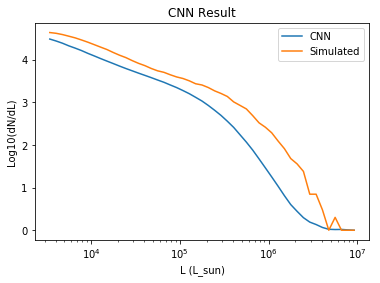

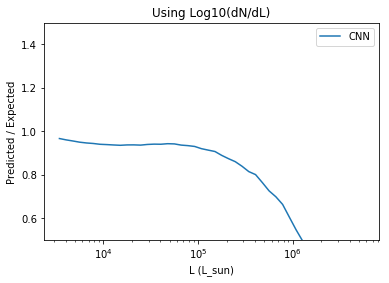

5057 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13631_rotate_0_subfield_30__Li_-3.892e-03_1.308e+00_-2.013e+00_2.961e-01_3.212e-01 ----------------------------
Error and MSE for the given base_number:
[0.018232624977827072, 0.037358555942773819]


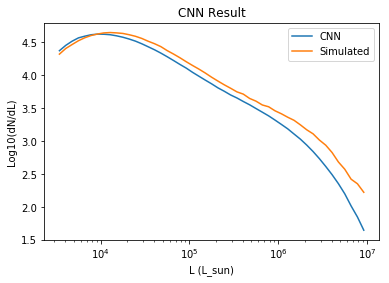

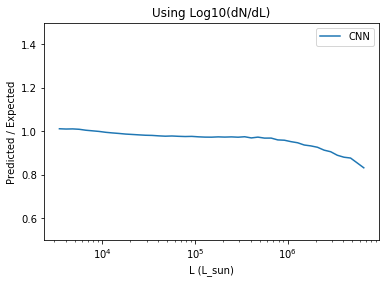

3235 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13861_rotate_0_subfield_21__Li_7.499e-03_1.388e+00_-2.193e+00_3.153e-01_3.038e-01 ----------------------------
Error and MSE for the given base_number:
[0.0323052778840065, 0.066870346665382385]


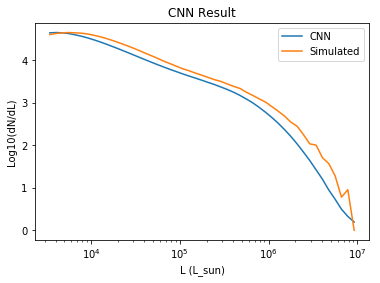

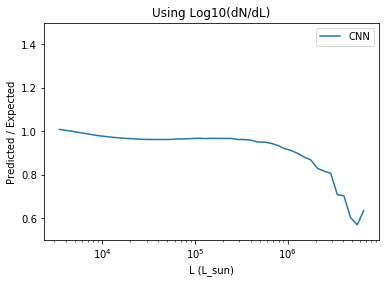

2345 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13811_rotate_0_subfield_21__Li_1.270e-02_1.285e+00_-1.550e+00_3.031e-01_3.096e-01 ----------------------------
Error and MSE for the given base_number:
[0.020297277718782425, 0.041643079370260239]


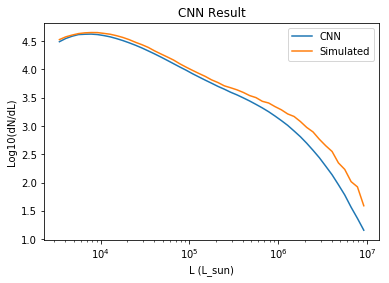

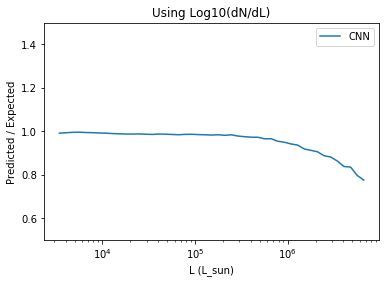

2679 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13779_rotate_0_subfield_28__Li_1.246e-02_1.377e+00_-1.875e+00_3.139e-01_3.063e-01 ----------------------------
Error and MSE for the given base_number:
[0.024783024564385414, 0.051166944205760956]


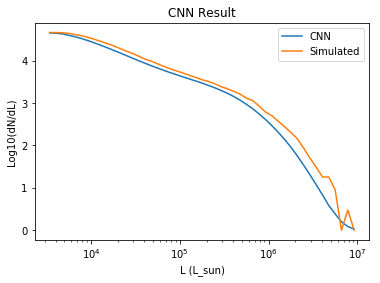

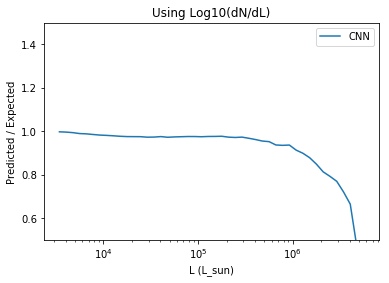

510 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_19__Li_-6.267e-02_1.452e+00_-1.433e+00_3.034e-01_2.907e-01 ----------------------------
Error and MSE for the given base_number:
[19.71537971496582, 608.27960205078125]


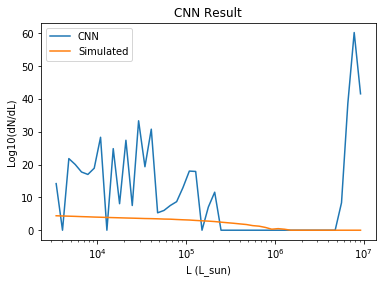

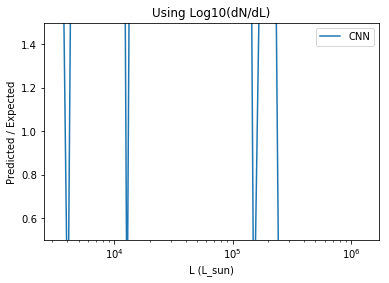

5294 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13823_rotate_0_subfield_5__Li_-3.866e-02_1.360e+00_-2.317e+00_2.932e-01_2.928e-01 ----------------------------
Error and MSE for the given base_number:
[0.025473397225141525, 0.052077341824769974]


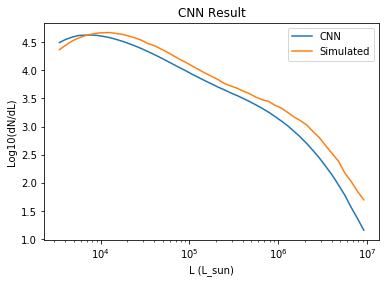

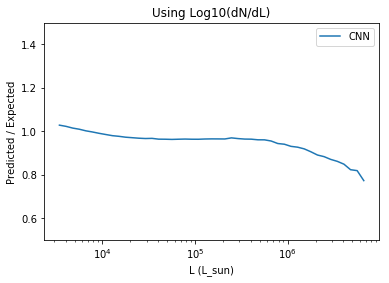

4214 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13585_rotate_0_subfield_28__Li_-2.069e-02_1.361e+00_-1.466e+00_2.901e-01_2.925e-01 ----------------------------
Error and MSE for the given base_number:
[0.071001216769218445, 0.15149600803852081]


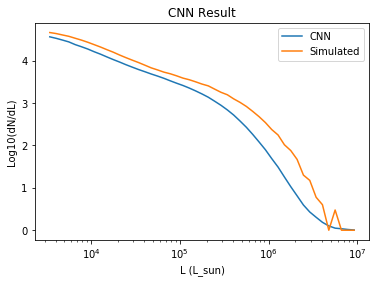

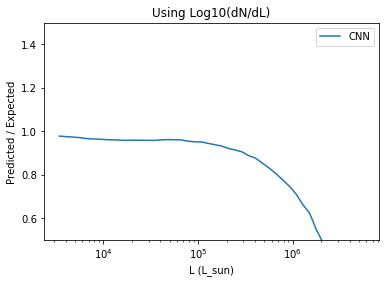

3903 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13633_rotate_0_subfield_18__Li_3.347e-02_1.405e+00_-1.563e+00_2.909e-01_3.198e-01 ----------------------------
Error and MSE for the given base_number:
[0.021584583446383476, 0.044220604002475739]


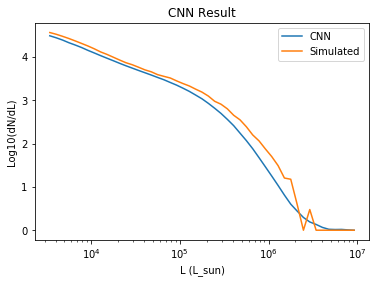

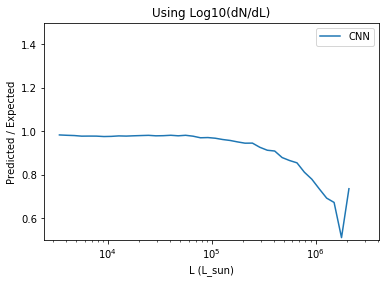

2101 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13881_rotate_0_subfield_22__Li_-3.011e-02_1.405e+00_-1.636e+00_2.967e-01_2.875e-01 ----------------------------
Error and MSE for the given base_number:
[0.056506652384996414, 0.11855239421129227]


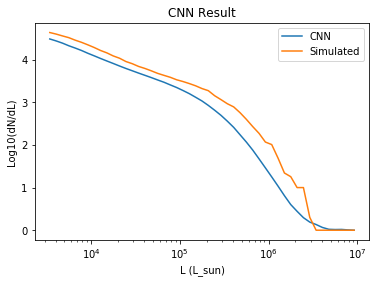

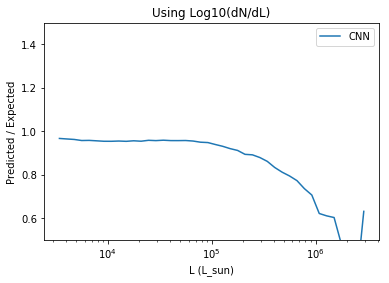

3824 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13819_rotate_0_subfield_20__Li_8.775e-03_1.434e+00_-1.137e+00_3.154e-01_3.090e-01 ----------------------------
Error and MSE for the given base_number:
[27.066726684570312, 1176.969970703125]


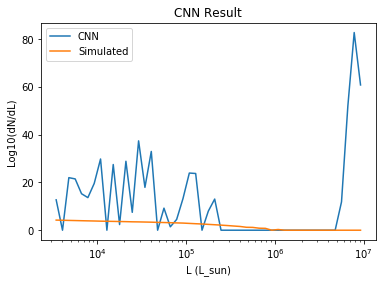

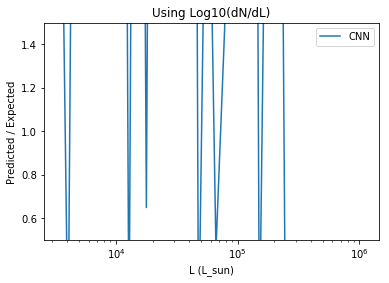

2022 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13613_rotate_0_subfield_8__Li_1.069e-02_1.343e+00_-1.655e+00_2.843e-01_2.879e-01 ----------------------------
Error and MSE for the given base_number:
[0.02811640128493309, 0.057644031941890717]


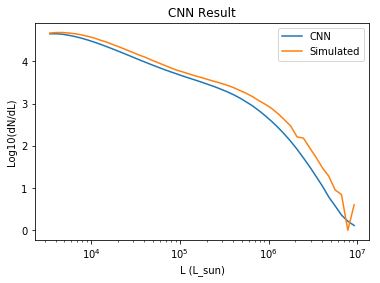

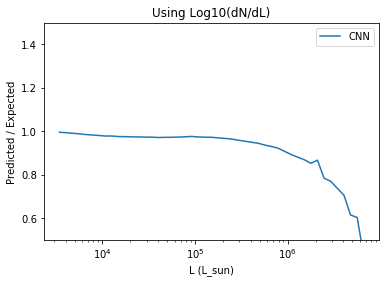

520 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13581_rotate_0_subfield_30__Li_1.932e-03_1.355e+00_-1.638e+00_2.806e-01_3.119e-01 ----------------------------
Error and MSE for the given base_number:
[0.021757569164037704, 0.044603645801544189]


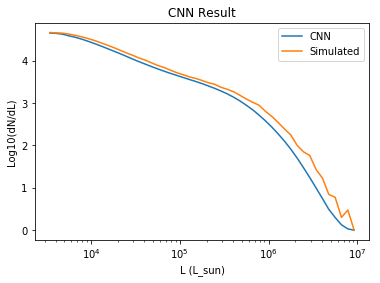

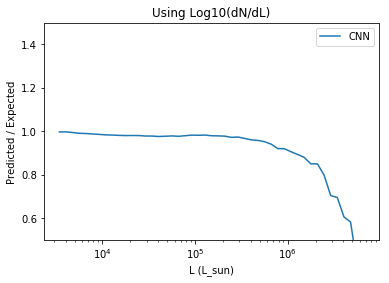

3620 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13625_rotate_0_subfield_24__Li_-8.326e-03_1.373e+00_-1.598e+00_2.979e-01_2.952e-01 ----------------------------
Error and MSE for the given base_number:
[0.16920284926891327, 0.38491970300674438]


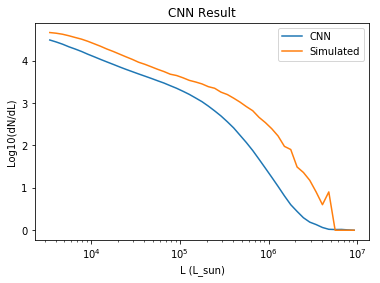

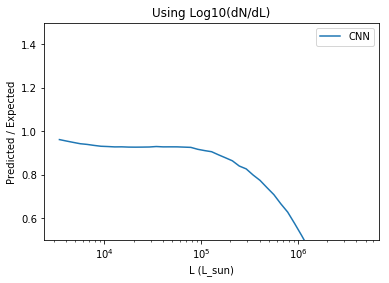

4439 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13871_rotate_0_subfield_17__Li_2.171e-02_1.357e+00_-1.753e+00_3.027e-01_2.945e-01 ----------------------------
Error and MSE for the given base_number:
[0.025563444942235947, 0.052605822682380676]


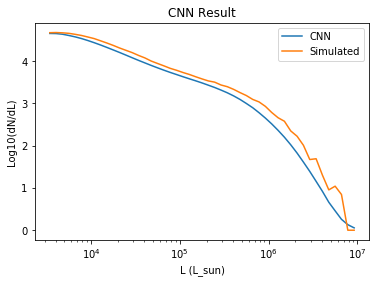

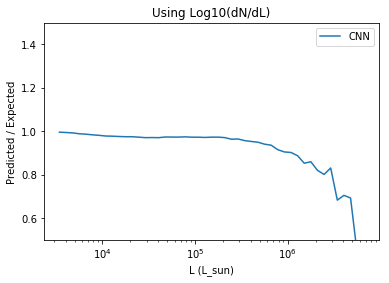

1249 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13621_rotate_0_subfield_5__Li_-3.467e-02_1.404e+00_-2.150e+00_3.033e-01_2.726e-01 ----------------------------
Error and MSE for the given base_number:
[0.018952256068587303, 0.03836856409907341]


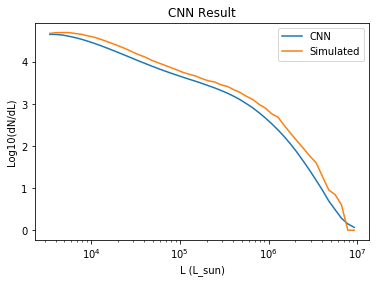

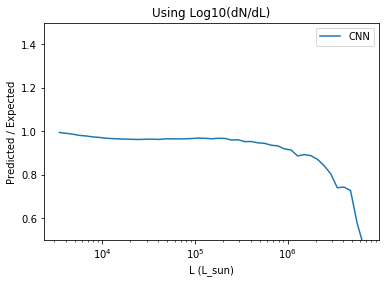

2426 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13791_rotate_0_subfield_25__Li_1.039e-02_1.387e+00_-1.645e+00_2.929e-01_2.948e-01 ----------------------------
Error and MSE for the given base_number:
[0.1160760298371315, 0.25564604997634888]


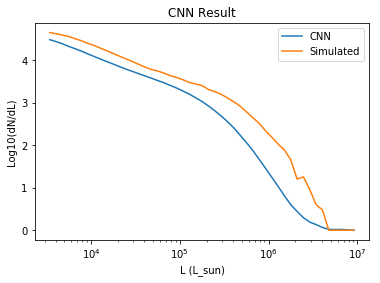

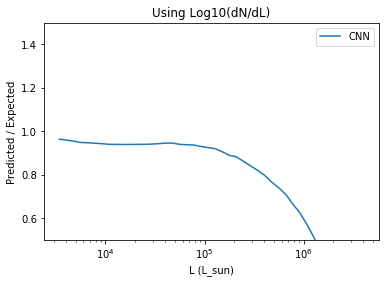

5352 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13809_rotate_0_subfield_18__Li_4.397e-02_1.319e+00_-2.016e+00_2.987e-01_3.089e-01 ----------------------------
Error and MSE for the given base_number:
[0.017450593411922455, 0.035550326108932495]


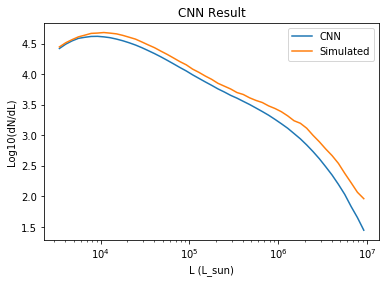

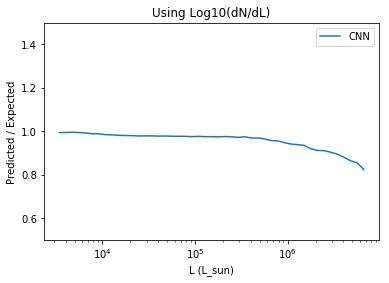

4095 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13737_rotate_0_subfield_10__Li_1.648e-02_1.349e+00_-1.784e+00_3.188e-01_3.052e-01 ----------------------------
Error and MSE for the given base_number:
[0.015145078301429749, 0.030816091224551201]


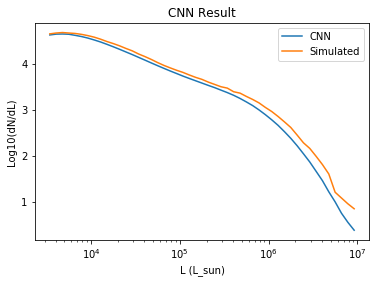

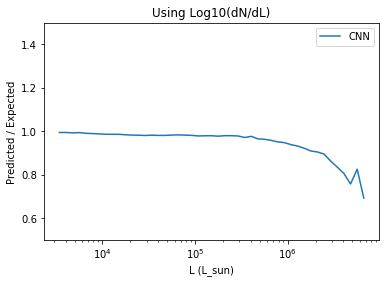

313 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13717_rotate_0_subfield_24__Li_-1.769e-02_1.385e+00_-1.326e+00_3.013e-01_2.993e-01 ----------------------------
Error and MSE for the given base_number:
[0.020988265052437782, 0.042824439704418182]


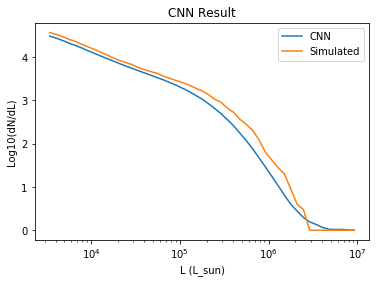

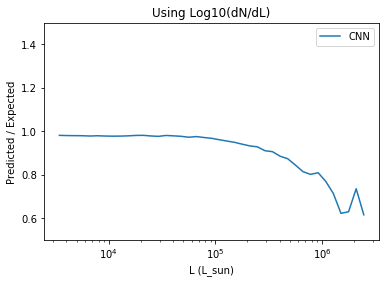

5635 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_28__Li_3.855e-02_1.308e+00_-1.779e+00_2.879e-01_3.020e-01 ----------------------------
Error and MSE for the given base_number:
[0.021128017455339432, 0.043248564004898071]


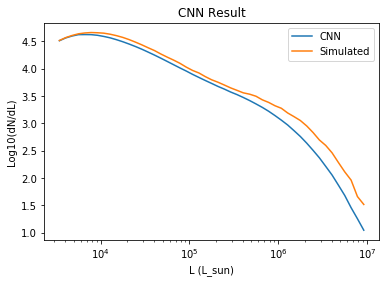

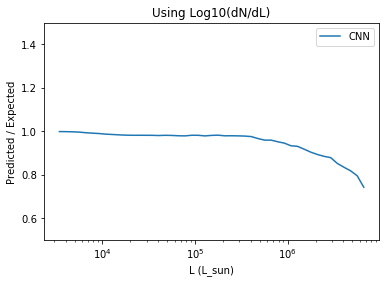

2479 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13889_rotate_0_subfield_23__Li_-4.596e-02_1.373e+00_-1.334e+00_2.959e-01_2.907e-01 ----------------------------
Error and MSE for the given base_number:
[0.052679575979709625, 0.11078649759292603]


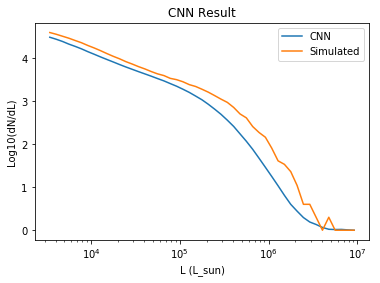

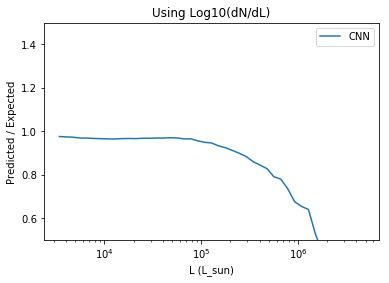

1167 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13783_rotate_0_subfield_0__Li_1.202e-02_1.397e+00_-1.951e+00_3.106e-01_2.737e-01 ----------------------------
Error and MSE for the given base_number:
[0.041214980185031891, 0.085435189306735992]


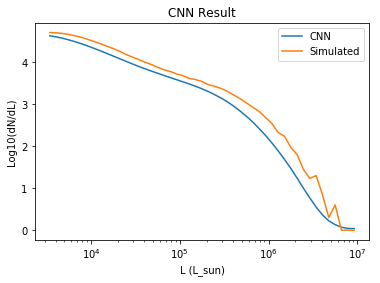

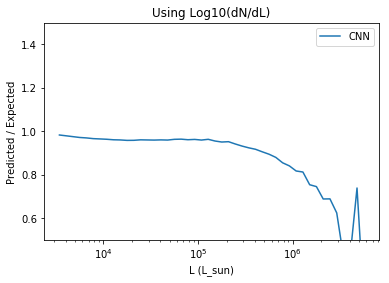

328 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13715_rotate_0_subfield_24__Li_2.105e-02_1.302e+00_-2.125e+00_2.918e-01_2.911e-01 ----------------------------
Error and MSE for the given base_number:
[0.020189769566059113, 0.041115295141935349]


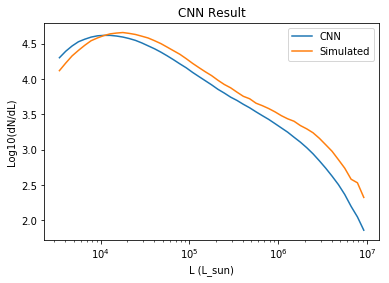

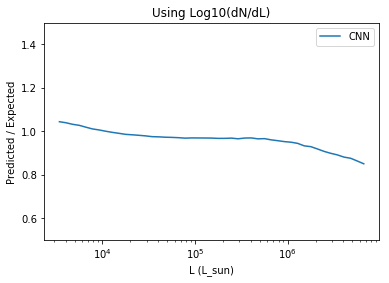

4691 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13789_rotate_0_subfield_21__Li_-4.820e-02_1.407e+00_-1.873e+00_2.851e-01_2.962e-01 ----------------------------
Error and MSE for the given base_number:
[5.1695957183837891, 55.267925262451172]


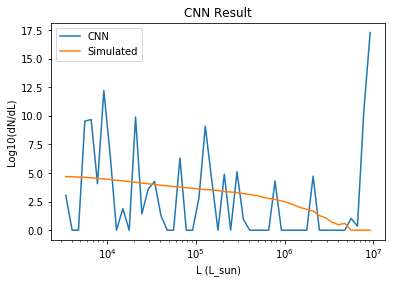

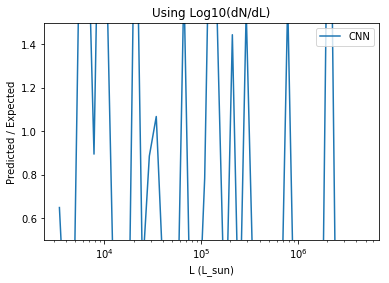

333 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13759_rotate_0_subfield_35__Li_5.973e-03_1.409e+00_-1.690e+00_2.991e-01_2.951e-01 ----------------------------
Error and MSE for the given base_number:
[0.059151183813810349, 0.12439455091953278]


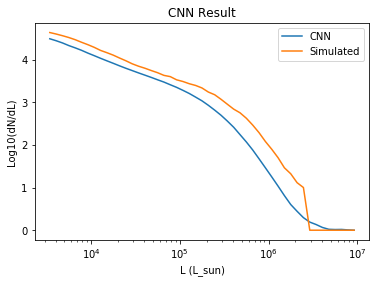

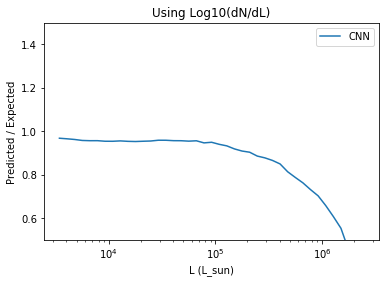

5210 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13611_rotate_0_subfield_5__Li_3.049e-02_1.366e+00_-1.951e+00_2.946e-01_3.149e-01 ----------------------------
Error and MSE for the given base_number:
[0.038228936493396759, 0.079996541142463684]


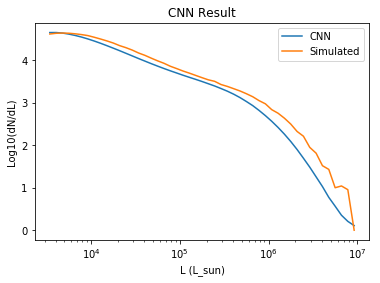

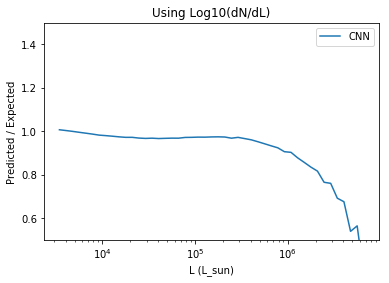

1691 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13849_rotate_0_subfield_22__Li_2.323e-02_1.413e+00_-2.384e+00_2.880e-01_2.824e-01 ----------------------------
Error and MSE for the given base_number:
[0.025331465527415276, 0.051551014184951782]


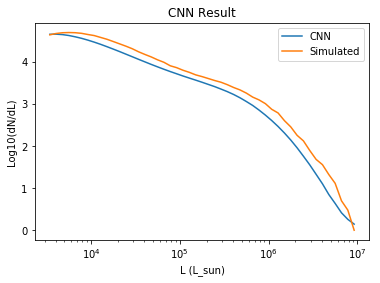

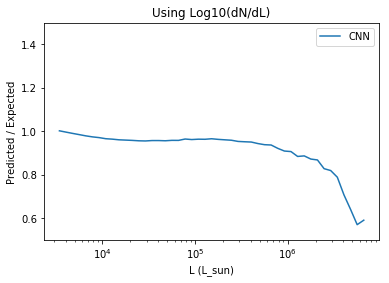

541 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13689_rotate_0_subfield_22__Li_-5.895e-02_1.426e+00_-1.347e+00_3.098e-01_3.084e-01 ----------------------------
Error and MSE for the given base_number:
[13.745358467102051, 281.82772827148438]


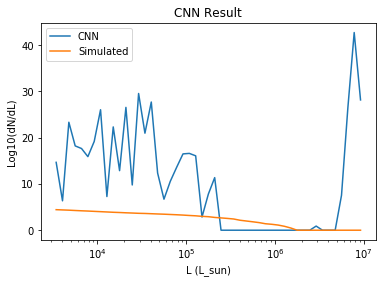

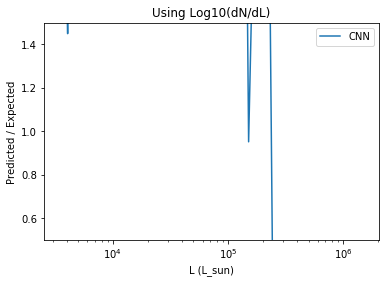

3688 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13771_rotate_0_subfield_19__Li_-5.751e-03_1.353e+00_-1.411e+00_3.046e-01_3.040e-01 ----------------------------
Error and MSE for the given base_number:
[0.16916708648204803, 0.39046302437782288]


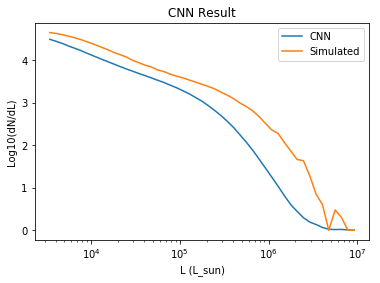

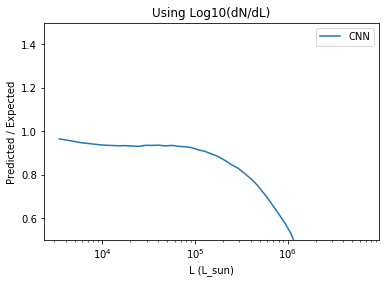

3836 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13747_rotate_0_subfield_6__Li_-2.263e-02_1.358e+00_-2.065e+00_2.822e-01_3.073e-01 ----------------------------
Error and MSE for the given base_number:
[0.016548236832022667, 0.033549182116985321]


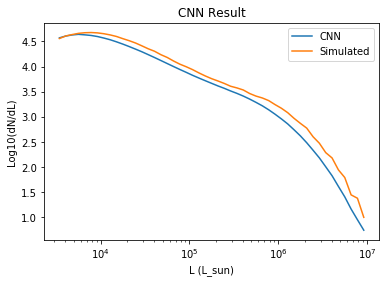

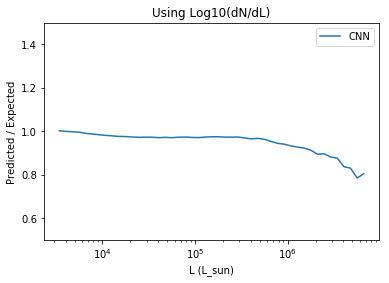

2209 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13669_rotate_0_subfield_12__Li_5.417e-02_1.368e+00_-2.203e+00_3.109e-01_3.048e-01 ----------------------------
Error and MSE for the given base_number:
[0.017645984888076782, 0.035965491086244583]


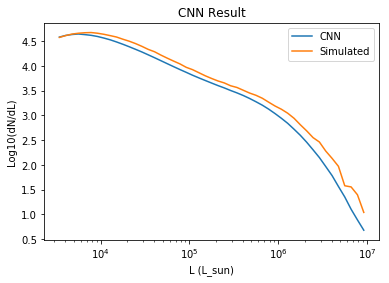

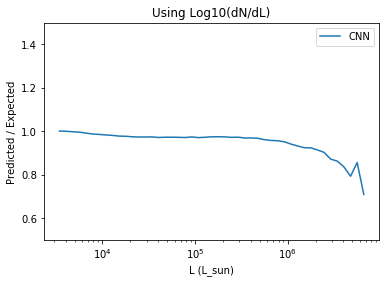

3403 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13661_rotate_0_subfield_31__Li_2.649e-02_1.365e+00_-1.394e+00_2.956e-01_3.128e-01 ----------------------------
Error and MSE for the given base_number:
[0.095247328281402588, 0.20865993201732635]


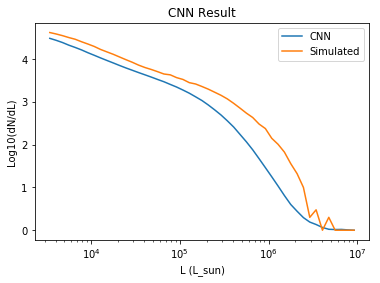

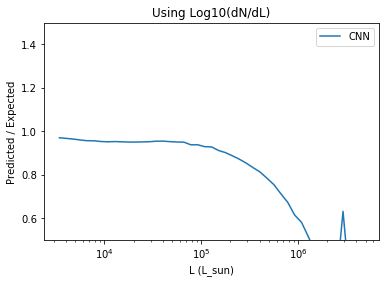

1134 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13811_rotate_0_subfield_14__Li_1.460e-02_1.357e+00_-1.454e+00_2.931e-01_2.989e-01 ----------------------------
Error and MSE for the given base_number:
[0.14761041104793549, 0.33434394001960754]


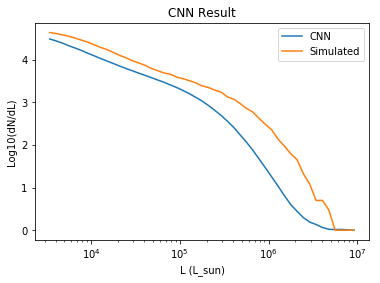

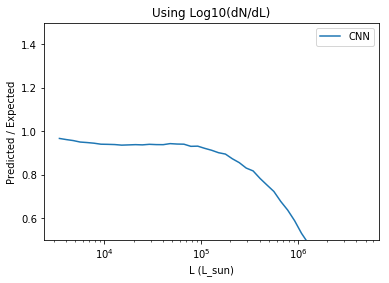

1346 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13827_rotate_0_subfield_10__Li_-2.972e-02_1.411e+00_-2.010e+00_2.931e-01_2.939e-01 ----------------------------
Error and MSE for the given base_number:
[0.18952424824237823, 0.43708434700965881]


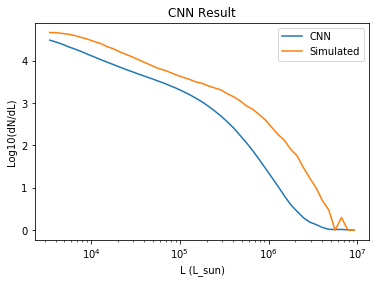

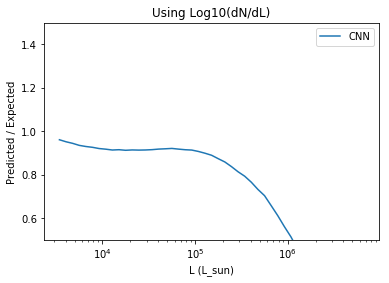

2752 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13585_rotate_0_subfield_21__Li_1.583e-02_1.365e+00_-2.085e+00_2.990e-01_3.098e-01 ----------------------------
Error and MSE for the given base_number:
[0.027427718043327332, 0.05661030113697052]


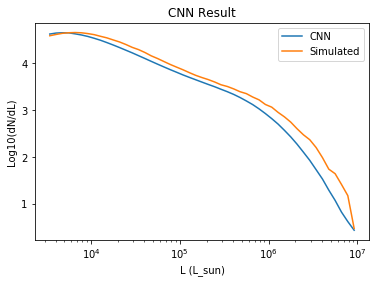

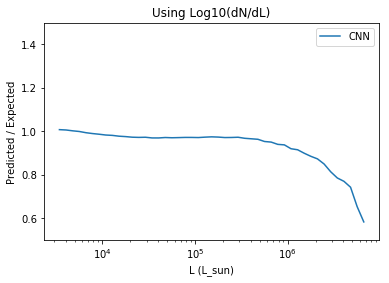

5781 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13631_rotate_0_subfield_7__Li_4.752e-02_1.415e+00_-1.933e+00_2.912e-01_3.026e-01 ----------------------------
Error and MSE for the given base_number:
[0.10768522322177887, 0.23448620736598969]


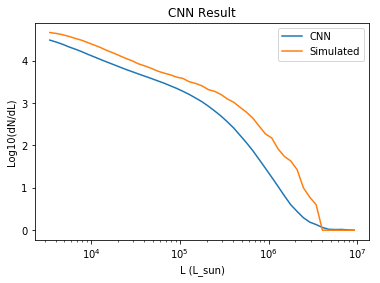

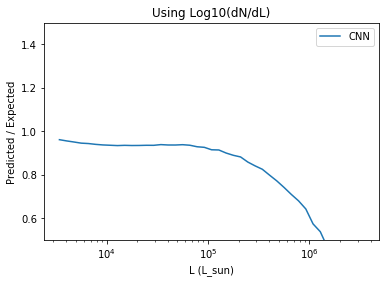

5449 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13751_rotate_0_subfield_1__Li_-4.184e-03_1.380e+00_-1.577e+00_3.051e-01_3.130e-01 ----------------------------
Error and MSE for the given base_number:
[0.1328522115945816, 0.29687762260437012]


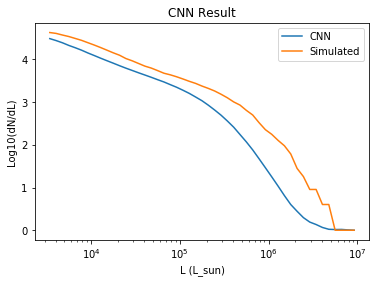

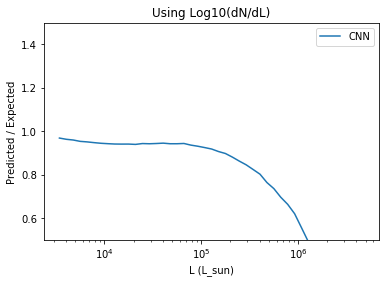

4734 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13697_rotate_0_subfield_35__Li_4.290e-02_1.347e+00_-1.808e+00_3.087e-01_3.059e-01 ----------------------------
Error and MSE for the given base_number:
[0.031222926452755928, 0.064652428030967712]


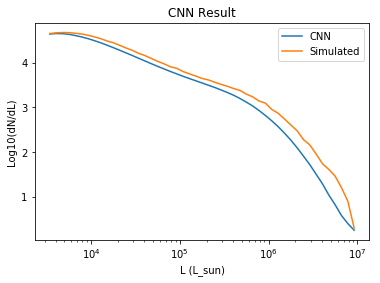

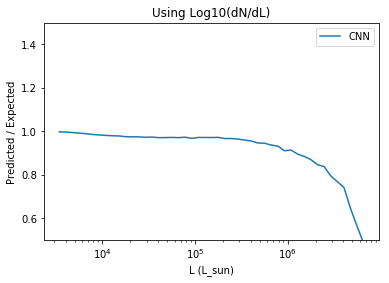

4704 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13783_rotate_0_subfield_7__Li_-3.151e-02_1.413e+00_-1.154e+00_3.025e-01_3.024e-01 ----------------------------
Error and MSE for the given base_number:
[13.474720001220703, 272.53421020507812]


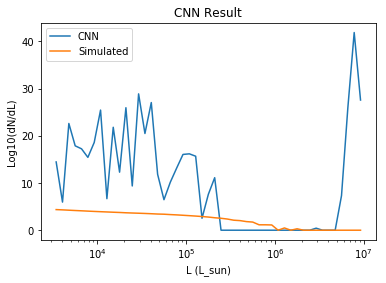

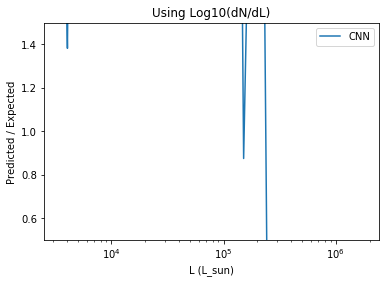

4157 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13761_rotate_0_subfield_26__Li_-2.090e-02_1.328e+00_-1.885e+00_2.915e-01_2.860e-01 ----------------------------
Error and MSE for the given base_number:
[0.016425604000687599, 0.03330756351351738]


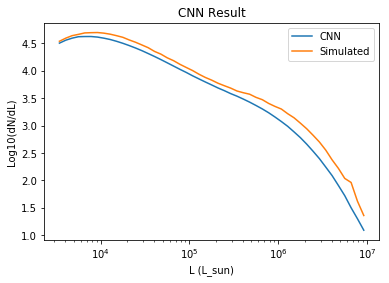

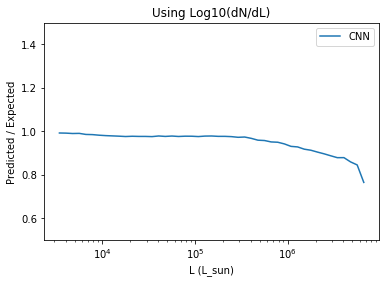

5475 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13859_rotate_0_subfield_27__Li_1.164e-03_1.336e+00_-1.501e+00_3.076e-01_3.129e-01 ----------------------------
Error and MSE for the given base_number:
[0.056532625108957291, 0.12099750339984894]


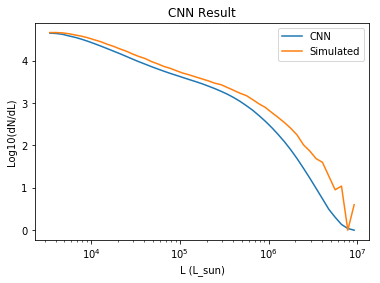

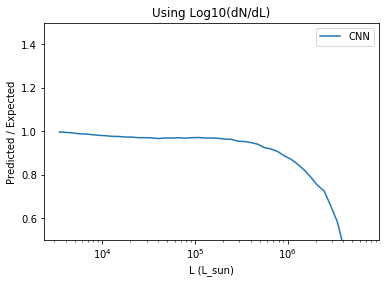

3408 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13841_rotate_0_subfield_26__Li_-3.615e-02_1.360e+00_-1.828e+00_2.957e-01_2.944e-01 ----------------------------
Error and MSE for the given base_number:
[0.039300080388784409, 0.082326158881187439]


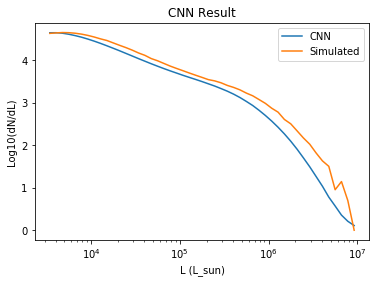

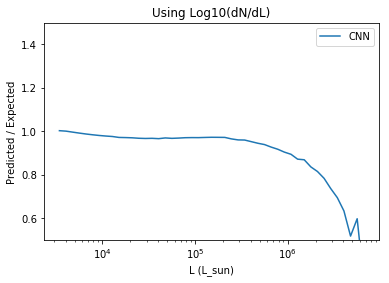

In [23]:
for numb in base_numbers:
# for i in range(6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=11)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

3133 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13583_rotate_0_subfield_7__Li_-3.505e-02_1.466e+00_-1.795e+00_2.982e-01_2.853e-01 ----------------------------
Error and MSE for the given base_number:
[11.515507698059082, 263.1939697265625]


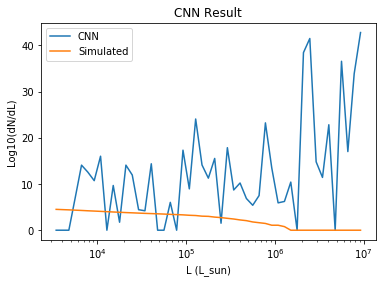

/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: divide by zero encountered in true_divide
  # ratio_smooth = avg/cur_lum
/home/dpfeffe2/projects/intensitymap_cnn/scripts/lnn/tools.py:294: RuntimeWarning: invalid value encountered in true_divide
  # ratio_smooth = avg/cur_lum


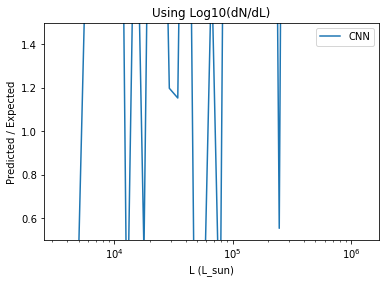

1847 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13735_rotate_0_subfield_24__Li_-2.513e-02_1.448e+00_-1.840e+00_2.826e-01_2.837e-01 ----------------------------
Error and MSE for the given base_number:
[0.1444355845451355, 0.3216998279094696]


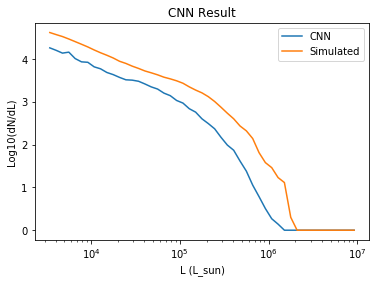

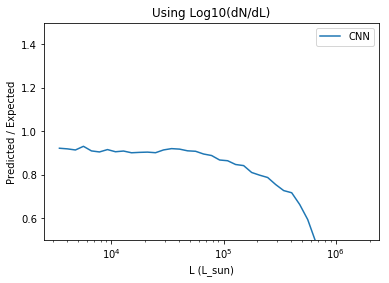

2871 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13795_rotate_0_subfield_8__Li_1.846e-02_1.378e+00_-1.217e+00_2.998e-01_3.020e-01 ----------------------------
Error and MSE for the given base_number:
[0.10620865225791931, 0.23308625817298889]


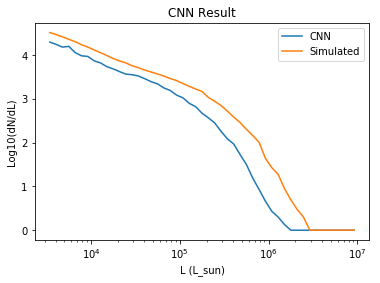

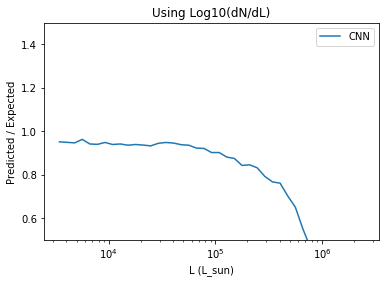

4823 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13855_rotate_0_subfield_22__Li_2.563e-02_1.394e+00_-1.469e+00_2.864e-01_2.960e-01 ----------------------------
Error and MSE for the given base_number:
[0.074279822409152985, 0.15847304463386536]


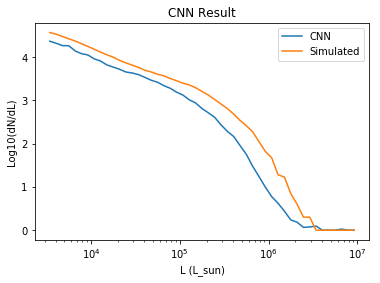

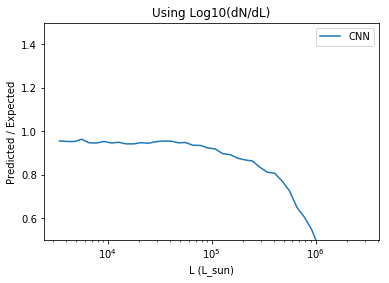

4041 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13825_rotate_0_subfield_13__Li_-2.262e-02_1.430e+00_-1.821e+00_2.915e-01_3.051e-01 ----------------------------
Error and MSE for the given base_number:
[0.13895364105701447, 0.31344118714332581]


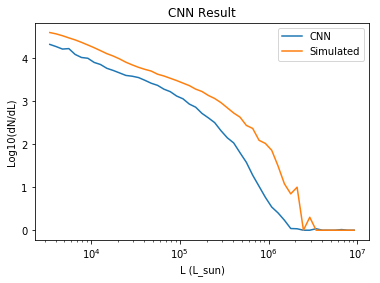

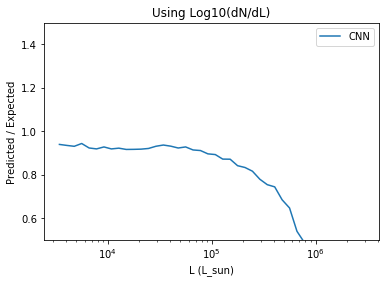

602 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13739_rotate_0_subfield_6__Li_1.328e-02_1.342e+00_-1.501e+00_2.961e-01_2.991e-01 ----------------------------
Error and MSE for the given base_number:
[0.10528196394443512, 0.23114599287509918]


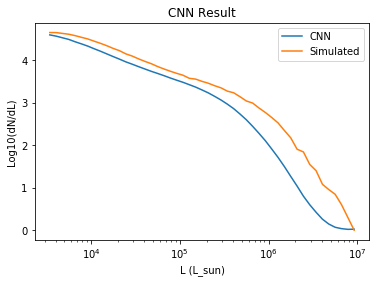

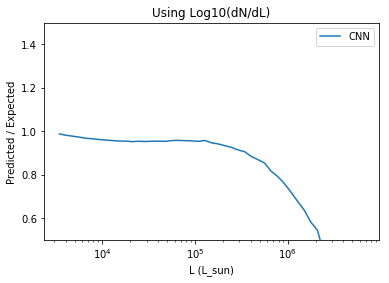

5360 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13841_rotate_0_subfield_10__Li_3.522e-02_1.387e+00_-1.285e+00_2.935e-01_3.205e-01 ----------------------------
Error and MSE for the given base_number:
[0.14324897527694702, 0.32624620199203491]


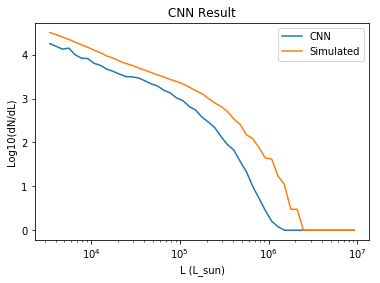

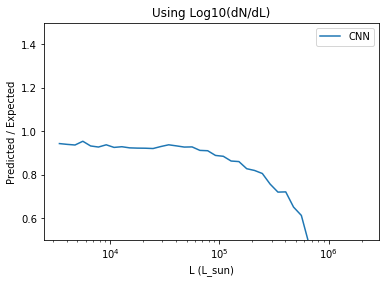

3788 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13637_rotate_0_subfield_31__Li_-4.586e-03_1.406e+00_-1.443e+00_2.902e-01_3.015e-01 ----------------------------
Error and MSE for the given base_number:
[0.17786285281181335, 0.40777498483657837]


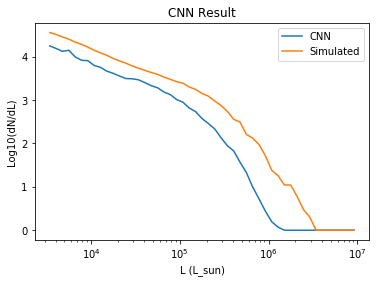

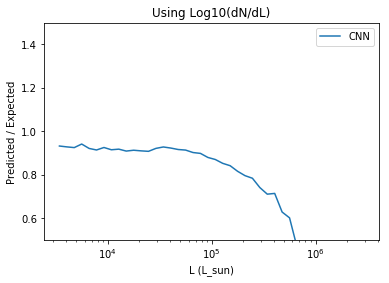

1328 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13883_rotate_0_subfield_35__Li_4.825e-02_1.381e+00_-7.203e-01_2.859e-01_3.072e-01 ----------------------------
Error and MSE for the given base_number:
[1747.160888671875, 5099312.5]


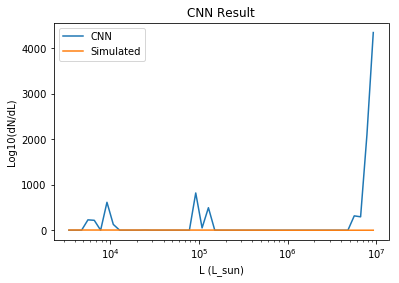

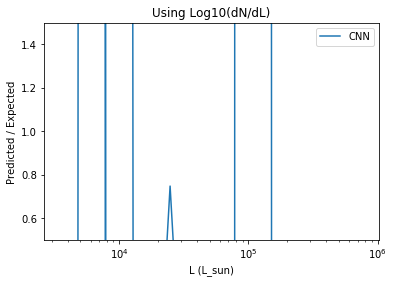

1359 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13831_rotate_0_subfield_21__Li_5.075e-02_1.427e+00_-9.963e-01_3.003e-01_2.992e-01 ----------------------------
Error and MSE for the given base_number:
[4705.57275390625, 36625568.0]


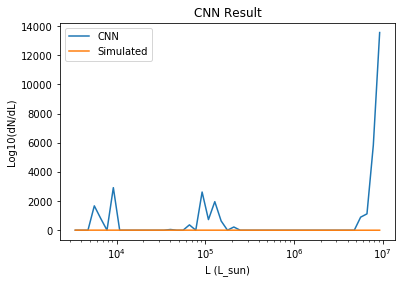

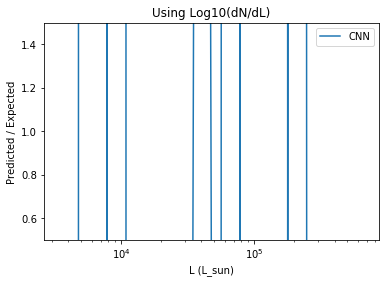

510 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13587_rotate_0_subfield_19__Li_-6.267e-02_1.452e+00_-1.433e+00_3.034e-01_2.907e-01 ----------------------------
Error and MSE for the given base_number:
[13.728241920471191, 352.46969604492188]


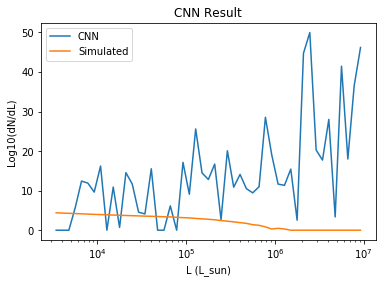

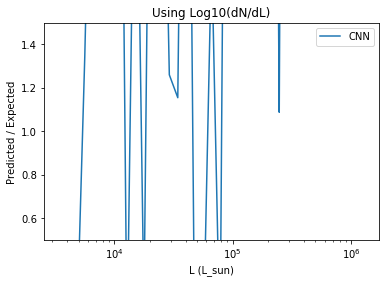

3824 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13819_rotate_0_subfield_20__Li_8.775e-03_1.434e+00_-1.137e+00_3.154e-01_3.090e-01 ----------------------------
Error and MSE for the given base_number:
[4722.41845703125, 34259572.0]


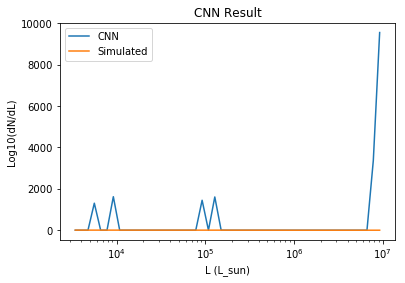

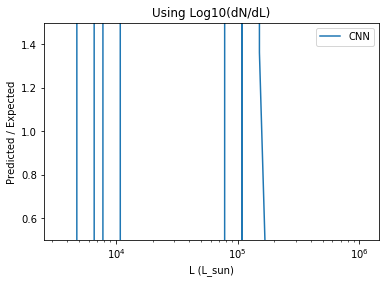

4691 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13789_rotate_0_subfield_21__Li_-4.820e-02_1.407e+00_-1.873e+00_2.851e-01_2.962e-01 ----------------------------
Error and MSE for the given base_number:
[0.06413549929857254, 0.13508948683738708]


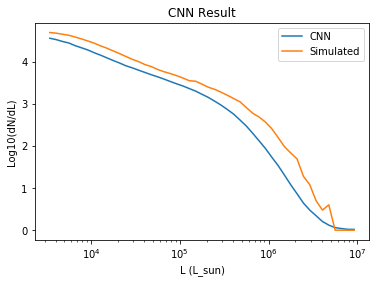

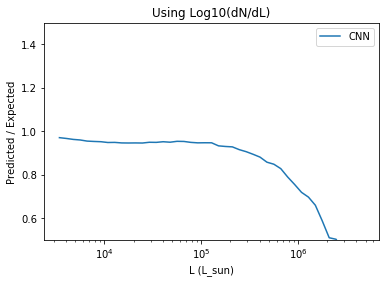

541 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13689_rotate_0_subfield_22__Li_-5.895e-02_1.426e+00_-1.347e+00_3.098e-01_3.084e-01 ----------------------------
Error and MSE for the given base_number:
[5.5655965805053711, 62.015171051025391]


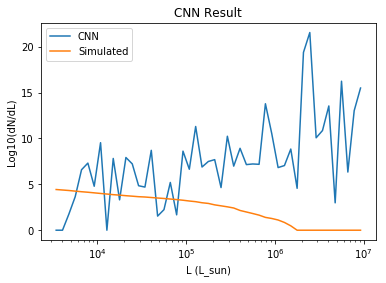

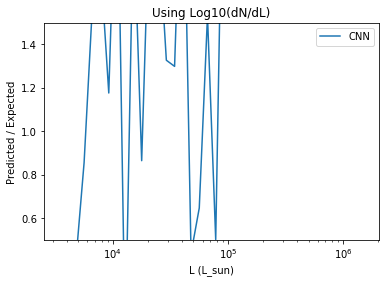

4704 ../maps2/random_small_Li/COMAP_z2.39-3.44_1140Mpc_seed_13783_rotate_0_subfield_7__Li_-3.151e-02_1.413e+00_-1.154e+00_3.025e-01_3.024e-01 ----------------------------
Error and MSE for the given base_number:
[206.25532531738281, 72609.3203125]


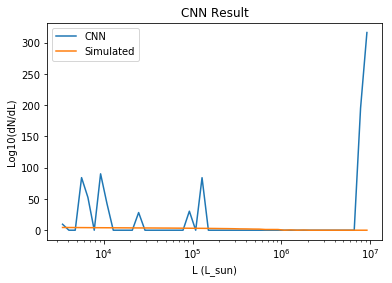

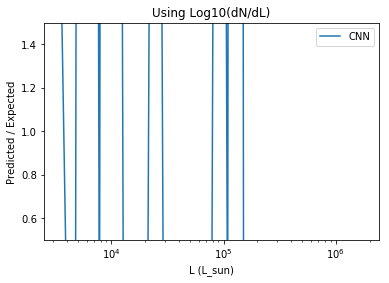

In [40]:
new_list = [3133, 1847, 2871, 4823, 4041, 602, 5360, 3788, 1328, 1359, 510, 3824, 4691, 541, 4704]
for numb in new_list:
# for i in range(6):
    print(numb, random_small_Li_base[numb], '----------------------------')
    
    cur_lum, cnn_lum, loss = lnn.test_model(noisy_adam_full_train, random_small_Li_base, numb, 'log', True, pre_pool=4, 
                                          log_input=True, pre_pool_z=10, lum_func_size=lum_func_size,
                                     make_map_noisy=0)
    lnn.plot_model_test(cur_lum, cnn_lum, lumLogBinCents, 'log', lum_func_size=lum_func_size)
    lnn.plot_model_ratio(cur_lum, cnn_lum, lumLogBinCents, 'log', 2)

# Test Many Maps at Once

In [18]:
%autoreload

In [22]:
base_numbers = np.random.choice(range(len(random_small_Li_base)), 120)

lnn.test_model_multiple_times(basic_adam, np.array(random_small_Li_base), luminosity_byproduct='log',
                                threeD=True, log_input=True,
                                make_map_noisy=0, base_numbers=base_numbers, test_size=10,
                                pre_pool=4, pre_pool_z=10, lum_func_size=lum_func_size)

3/3 [==============================] - 72s 24s/step
[0.060976278036832809, 0.45527355683346588]


In [23]:
# base_numbers = np.random.choice(range(len(random_small_Li_base)), 120)

lnn.test_model_multiple_times(full_train_basic_adam, np.array(random_small_Li_base), luminosity_byproduct='log',
                                threeD=True, log_input=True,
                                make_map_noisy=0, base_numbers=base_numbers, test_size=10,
                                pre_pool=4, pre_pool_z=10, lum_func_size=lum_func_size)

3/3 [==============================] - 48s 16s/step
[4.9457563236355782, 3985.6243533951542]


In [55]:
base_numbers = np.random.choice(range(len(random_small_Li_base)), 120)

lnn.test_model_multiple_times(noisy_adam, np.array(random_small_Li_base), luminosity_byproduct='log',
                                threeD=True, log_input=True,
                                make_map_noisy=11, base_numbers=base_numbers, test_size=10,
                                pre_pool=4, pre_pool_z=10, lum_func_size=lum_func_size)

3/3 [==============================] - 135s 45s/step
[0.013719234305123488, 0.028043617804845173]


In [24]:
base_numbers = np.random.choice(range(len(random_small_Li_base)), 120)

lnn.test_model_multiple_times(noisy_adam_zero, np.array(random_small_Li_base), luminosity_byproduct='log',
                                threeD=True, log_input=True,
                                make_map_noisy=11, base_numbers=base_numbers, test_size=10,
                                pre_pool=4, pre_pool_z=10, lum_func_size=lum_func_size)

3/3 [==============================] - 131s 44s/step
[37.654422760009766, 2473.0753580729165]


In [25]:
base_numbers = np.random.choice(range(len(random_small_Li_base)), 120)

lnn.test_model_multiple_times(noisy_adam_full_train, np.array(random_small_Li_base), luminosity_byproduct='log',
                                threeD=True, log_input=True,
                                make_map_noisy=11, base_numbers=base_numbers, test_size=10,
                                pre_pool=4, pre_pool_z=10, lum_func_size=lum_func_size)

3/3 [==============================] - 126s 42s/step
[0.33962990840276081, 0.95956192413965857]


In [22]:
base_numbers

array([1877, 5694, 2604, 2973, 1308, 4848, 2339,  938, 1318, 4383,  964,
       1583, 2062, 5667, 3133, 1847, 4275, 2871, 1484, 1442, 2302, 4823,
       1723, 1070, 2019, 5259, 2003, 2470, 2228, 4041, 4838, 5362,  636,
        602, 4166, 3695, 5360, 1501,   23, 2016, 3438, 3605, 1128, 2645,
       3984, 5405, 3788, 2283, 1364, 3532, 2217, 2465, 5240, 1183, 4813,
       3806, 2712, 4779, 1210, 4205, 4927,  160, 1328, 4300, 5158, 1293,
       5748,  488, 3693, 2325, 3662, 3163,  350, 5185, 3091, 1359, 3844,
       2964, 5057, 3235, 2345, 2679,  510, 5294, 4214, 3903, 2101, 3824,
       2022,  520, 3620, 4439, 1249, 2426, 5352, 4095,  313, 5635, 2479,
       1167,  328, 4691,  333, 5210, 1691,  541, 3688, 3836, 2209, 3403,
       1134, 1346, 2752, 5781, 5449, 4734, 4704, 4157, 5475, 3408])

# Model History

In [25]:
%autoreload

In [26]:
basic_adam_history = lnn.get_full_history('basic_adam', modelLoc4)
noisy_adam_history = lnn.get_full_history('noisy_adam', modelLoc4)
bigger_input_z_history = lnn.get_full_history('bigger_input_z', modelLoc4)
full_train_basic_adam_history = lnn.get_full_history('full_train_basic_adam', modelLoc4)
noisy_adam_full_train_history = lnn.get_full_history('noisy_adam_full_train', modelLoc4)
noisy_adam_zero_history = lnn.get_full_history('noisy_adam_zero', modelLoc4)

In [27]:
augmentation_adam_full_train_history = lnn.get_full_history('augmentation_adam_full_train', modelLoc4)
# augmentation_adam_history = lnn.get_full_history('augmentation_adam', modelLoc4)

In [28]:
noisy_resnet_history = lnn.get_full_history('noisy_resnet', modelLoc4)
noisy_resnet_full_train_history = lnn.get_full_history('noisy_resnet_full_train', modelLoc4)
noisy_foreground_resnet_history = lnn.get_full_history('noisy_foreground_resnet', modelLoc4)
noisy_foreground_resnet_full_train_history = lnn.get_full_history('noisy_foreground_resnet_full_train', modelLoc4)
foreground_resnet_history = lnn.get_full_history('foreground_resnet', modelLoc4)

basic_adam_history


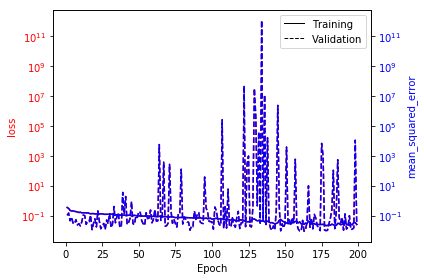

full_train_basic_adam_history


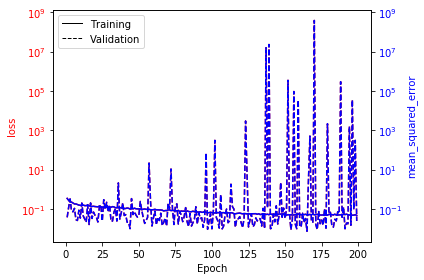

noisy_adam_history


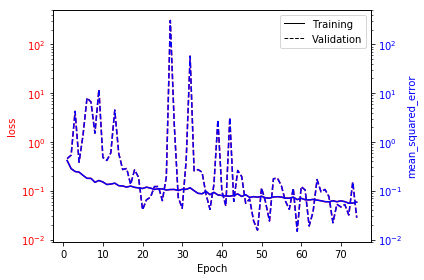

bigger_input_z_history


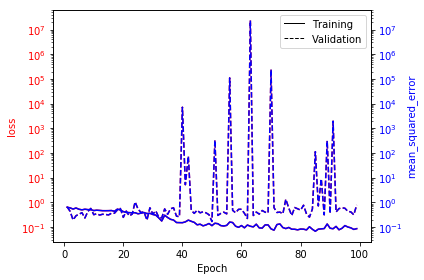

()

In [29]:
print('basic_adam_history')
lnn.history_compare_two_metrics(basic_adam_history)

print('full_train_basic_adam_history')
lnn.history_compare_two_metrics(full_train_basic_adam_history)

print('noisy_adam_history')
lnn.history_compare_two_metrics(noisy_adam_history)

print('bigger_input_z_history')
lnn.history_compare_two_metrics(bigger_input_z_history)

noisy_adam_zero_history


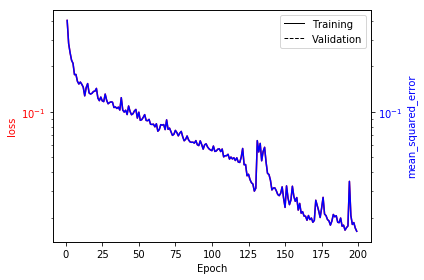

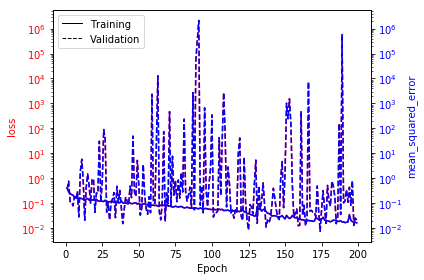

noisy_adam_full_train_history


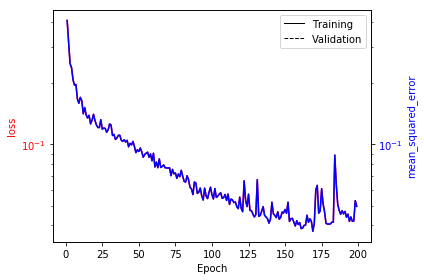

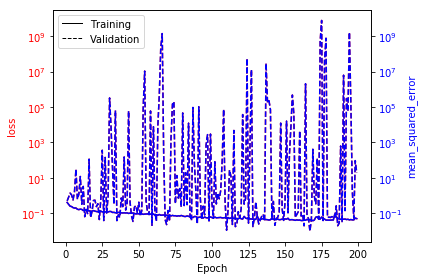

()

In [30]:
print('noisy_adam_zero_history')
lnn.history_compare_two_metrics(noisy_adam_zero_history, do_val=False)
lnn.history_compare_two_metrics(noisy_adam_zero_history, do_val=True)

print('noisy_adam_full_train_history')
lnn.history_compare_two_metrics(noisy_adam_full_train_history, do_val=False)
lnn.history_compare_two_metrics(noisy_adam_full_train_history, do_val=True)

augmentation_adam_full_train_history


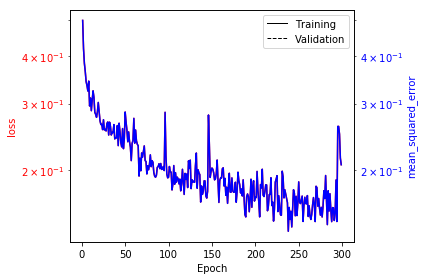

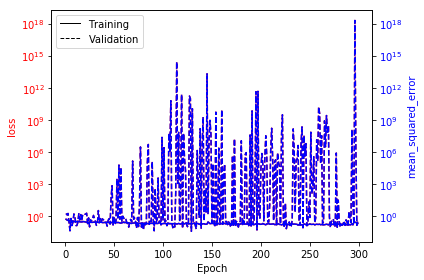

()

In [20]:
print('augmentation_adam_full_train_history')
lnn.history_compare_two_metrics(augmentation_adam_full_train_history, do_val=False)
lnn.history_compare_two_metrics(augmentation_adam_full_train_history, do_val=True)

noisy_resnet_history


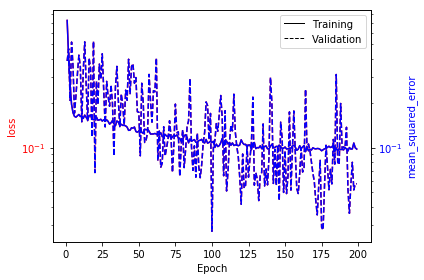

noisy_resnet_full_train_history


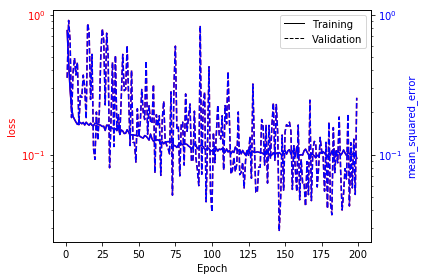

noisy_foreground_resnet_history


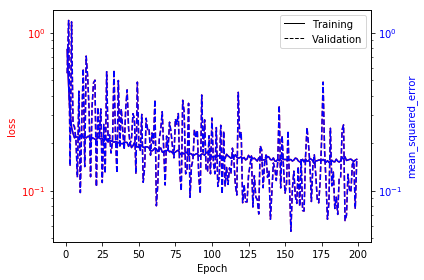

foreground_resnet_history


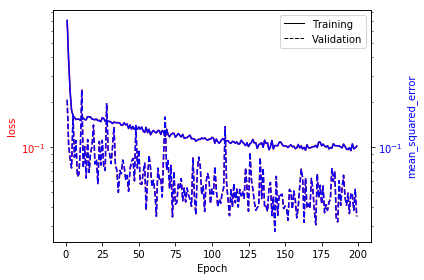

noisy_foreground_resnet_full_train_history


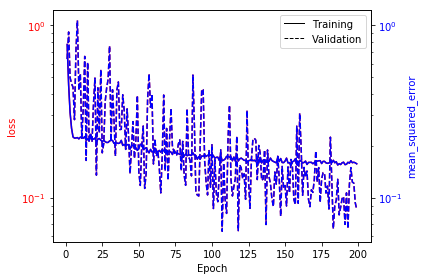

()

In [30]:
print('noisy_resnet_history')
lnn.history_compare_two_metrics(noisy_resnet_history, do_val=True)

print('noisy_resnet_full_train_history')
lnn.history_compare_two_metrics(noisy_resnet_full_train_history, do_val=True)

print('noisy_foreground_resnet_history')
lnn.history_compare_two_metrics(noisy_foreground_resnet_history, do_val=True)

print('foreground_resnet_history')
lnn.history_compare_two_metrics(foreground_resnet_history, do_val=True)

print('noisy_foreground_resnet_full_train_history')
lnn.history_compare_two_metrics(noisy_foreground_resnet_full_train_history, do_val=True)